In [1]:
import random
import time
import os
import sys
# Automatically find and add the project root directory to sys.path
project_root = os.path.abspath(os.path.join(os.getcwd(), '..'))
if project_root not in sys.path:
    sys.path.insert(0, project_root)
from tsai.all import *
from fastai.vision.all import *
from sklearn.model_selection import train_test_split
from fastai.callback.tracker import EarlyStoppingCallback
from fastai.vision.all import *
from torch.utils.data.dataset import ConcatDataset
from tsai.utils import set_seed
from sklearn.preprocessing import MinMaxScaler
from scipy.interpolate import interp1d
# from aeon.datasets import load_classification
# from sktime.datasets import load_UCR_UEA_dataset
from lomatce.explainer import LomatceExplainer
import lomatce.perturbation as perturbation 
import lomatce.utils.test_dataloader as test_loader




set_seed(1024)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
# device = "cpu"
print(f"device: {device}")
my_setup()

device: cuda
os              : Windows-10-10.0.26200-SP0
python          : 3.11.13
tsai            : 0.3.9
fastai          : 2.7.14
fastcore        : 1.5.29
torch           : 2.2.2+cu118
device          : 1 gpu (['NVIDIA GeForce RTX 4050 Laptop GPU'])
cpu cores       : 14
threads per cpu : 1
RAM             : 15.68 GB
GPU memory      : [6.0] GB


In [2]:
# Set a random seed to ensure that the results are reproducible
random_seed = 45

torch.manual_seed(random_seed)
random.seed(random_seed)
np.random.seed(random_seed)

In [3]:
# List of univariate datasets from UCR archive
print(get_UCR_univariate_list())

# List of multivariate datasets from UCR archieve
print(get_UCR_multivariate_list())

['ACSF1', 'Adiac', 'AllGestureWiimoteX', 'AllGestureWiimoteY', 'AllGestureWiimoteZ', 'ArrowHead', 'Beef', 'BeetleFly', 'BirdChicken', 'BME', 'Car', 'CBF', 'Chinatown', 'ChlorineConcentration', 'CinCECGTorso', 'Coffee', 'Computers', 'CricketX', 'CricketY', 'CricketZ', 'Crop', 'DiatomSizeReduction', 'DistalPhalanxOutlineAgeGroup', 'DistalPhalanxOutlineCorrect', 'DistalPhalanxTW', 'DodgerLoopDay', 'DodgerLoopGame', 'DodgerLoopWeekend', 'Earthquakes', 'ECG200', 'ECG5000', 'ECGFiveDays', 'ElectricDevices', 'EOGHorizontalSignal', 'EOGVerticalSignal', 'EthanolLevel', 'FaceAll', 'FaceFour', 'FacesUCR', 'FiftyWords', 'Fish', 'FordA', 'FordB', 'FreezerRegularTrain', 'FreezerSmallTrain', 'Fungi', 'GestureMidAirD1', 'GestureMidAirD2', 'GestureMidAirD3', 'GesturePebbleZ1', 'GesturePebbleZ2', 'GunPoint', 'GunPointAgeSpan', 'GunPointMaleVersusFemale', 'GunPointOldVersusYoung', 'Ham', 'HandOutlines', 'Haptics', 'Herring', 'HouseTwenty', 'InlineSkate', 'InsectEPGRegularTrain', 'InsectEPGSmallTrain', 'I

In [4]:
dsid = 'CBF'
dataset_name = dsid.lower()
model = 'LSTM_FCN'.lower()

cur_time = time.strftime('%Y-%m-%d_%H-%M-%S')
if 'cuda' in str(device):
    base_dir = f'results/{dataset_name}/{model}--{cur_time}' 
else:
    base_dir = f'results/{dataset_name}/{model}--2023-12-28_16-37-54' 
#Create the base directory if not exist
os.makedirs(base_dir, exist_ok=True)

In [5]:
dsid= 'CBF'
X, y, splits  = get_UCR_data(dsid, on_disk=True, return_split=False)

In [6]:
unique_classes, counts = np.unique(y, return_counts=True)
for cls, count in zip(unique_classes, counts):
    print(f"Class {cls}: {count} instances")

Class 1: 310 instances
Class 2: 310 instances
Class 3: 310 instances


### Load and preprocess data

In [7]:
def data_preparation(X, y, test_size=0.3, random_state=12):
    # Stratified split to maintain class distribution

    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, stratify=y, random_state=random_state)
    X_test, X_valid, y_test, y_valid = train_test_split(X_test, y_test, test_size=0.5, stratify=y_test, random_state=random_state)

    print(f'Shape of X_train :{X_train.shape}')
    print(f'Shape of y_train :{y_train.shape}')
    print(f'Shape of X_valid :{X_valid.shape}')
    print(f'Shape of X_test :{X_test.shape}')

    tfms  = [None, [Categorize()]]
    train_ds = TSDatasets(X_train, y_train, tfms=tfms)
    valid_ds = TSDatasets(X_valid, y_valid, tfms=tfms)


    dls = TSDataLoaders.from_dsets(train_ds, valid_ds, bs=[8, 32], batch_tfms=[TSStandardize()], num_workers=0,  device=device, shuffle=True )
    print(f' Number of classes : {dls.c}')
    return dls, X_train, X_test, y_test

In [8]:
lomatce_explainer = LomatceExplainer(base_dir=base_dir)
dls, X_train, X_test, y_test = data_preparation(X, y)

Shape of X_train :(651, 1, 128)
Shape of y_train :(651,)
Shape of X_valid :(140, 1, 128)
Shape of X_test :(139, 1, 128)
 Number of classes : 3


### Build learner and train model

In [9]:
def trainer (model, dls, epochs=100, learning_rate=1e-3, patience=15):
    kwargs = {}
    metrics=[accuracy]
    path = f'{base_dir}/export'
    os.makedirs(path, exist_ok=True)
    # Create model
    model = create_model(model, dls=dls, **kwargs)
    # Define early stopping criteria
    early_stopping = EarlyStoppingCallback(monitor='valid_loss', min_delta=0.001, patience=patience)

    # Define a call back to save the best model
    save_callback = SaveModelCallback(monitor='accuracy')
    # Train and evaluate model with early stopping
    # set_seed(42)
    cbs = [early_stopping, save_callback,ShowGraph()]
    learn = Learner(dls=dls, model=model, opt_func=Adam, metrics=metrics,cbs=cbs) #
    learn.fit_one_cycle(epochs, learning_rate)
    learn.save_all(path=path, dls_fname='dls', model_fname='model', learner_fname='learner')
    return learn

def validator(learn, X_test, y_test):
    dls = learn.dls
    valid_dl = dls.valid
    train_dl = dls.train
    # Labelled test data
    test_ds = valid_dl.dataset.add_test(X_test, y_test)# In this case I'll use X and y, but this would be your test data
    test_dl = valid_dl.new(test_ds)
    test_probas, test_targets, test_preds = learn.get_preds(dl=test_dl, with_decoded=True, save_preds=None, save_targs=None)
    # print(f'Test Accuracy: {skm.accuracy_score(test_targets, test_preds):10.6f}')
    valid_probas, valid_targets, valid_preds = learn.get_preds(dl=valid_dl, with_decoded=True)
    train_probas, train_targets, train_preds = learn.get_preds(dl=train_dl, with_decoded=True)
    
    valid_accuracy = (valid_targets == valid_preds).float().mean()
    test_accuracy = (test_targets == test_preds).float().mean()
    train_accuracy = (train_targets == train_preds).float().mean()

    print(f"Validation Accuracy :{valid_accuracy:.2f}")
    print(f"Test Accuracy :{test_accuracy:.2f}")
    print(f"Train Accuracy :{train_accuracy:.2f}")
    valid_dl.show_batch(sharey=True)
    test_dl.show_batch(sharey=True)
    learn.show_results(max_n=9)

    return train_accuracy, valid_accuracy, test_accuracy, test_preds, valid_preds

Shape of X_train :(651, 1, 128)
Shape of y_train :(651,)
Shape of X_valid :(140, 1, 128)
Shape of X_test :(139, 1, 128)
 Number of classes : 3
Start training...


epoch,train_loss,valid_loss,accuracy,time
0,0.954146,0.838360,0.992857,00:00
1,0.803583,0.668477,0.992857,00:00
2,0.664676,0.518447,0.992857,00:00
3,0.554449,0.382430,0.992857,00:00
4,0.413441,0.265070,1.000000,00:00
5,0.292898,0.162555,0.992857,00:00
6,0.204765,0.108447,1.000000,00:00
7,0.161459,0.073910,1.000000,00:00
8,0.106375,0.053644,1.000000,00:00
9,0.091805,0.027425,1.000000,00:00


Better model found at epoch 0 with accuracy value: 0.9928571581840515.


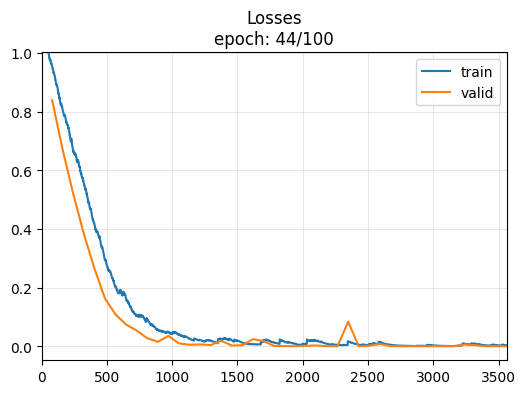

Better model found at epoch 4 with accuracy value: 1.0.
No improvement since epoch 29: early stopping


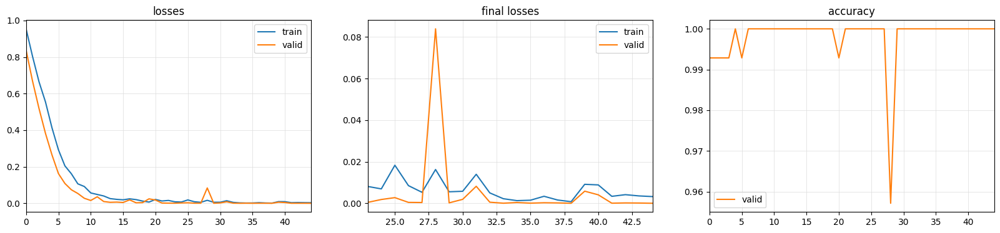

cuda


In [10]:
dls, X_train, X_test, y_test= data_preparation(X, y)
# Run the trainer function only if CUDA is available
if 'cuda' in str(device):
    print('Start training...')
    learn_new = trainer(LSTM_FCN, dls)
# else:
#     learn_new = load_learner_all(path=f'{base_dir}/export/',
#                                dls_fname='dls', model_fname='model', learner_fname='learner')
    # train_acc, valid_acc, test_acc, test_preds, valid_preds = validator(learn_new, X_test, y_test)
print(device)

Validation Accuracy :1.00
Test Accuracy :0.99
Train Accuracy :0.99


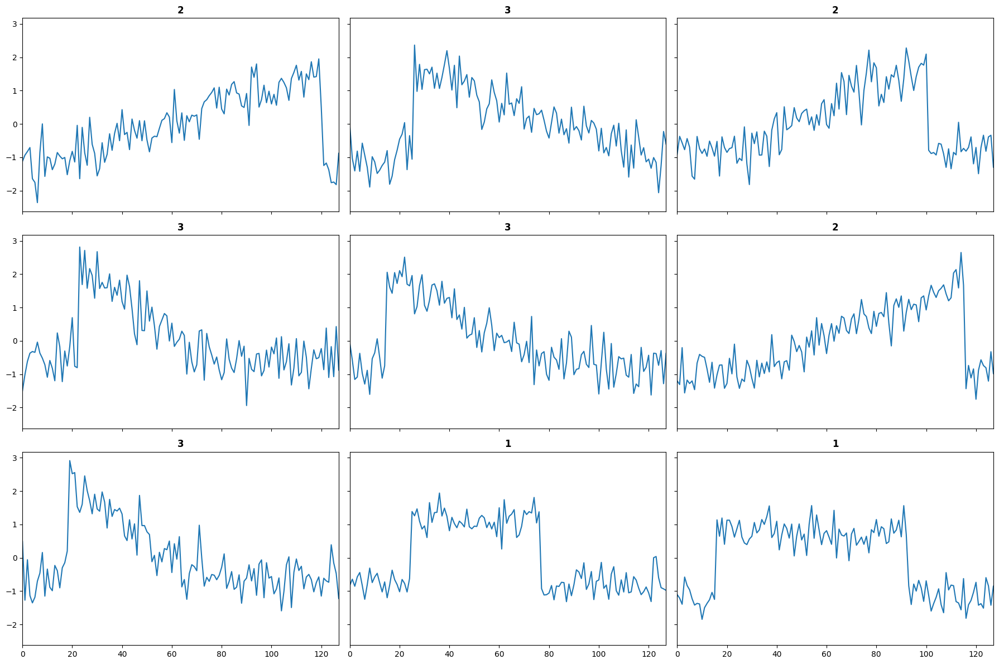

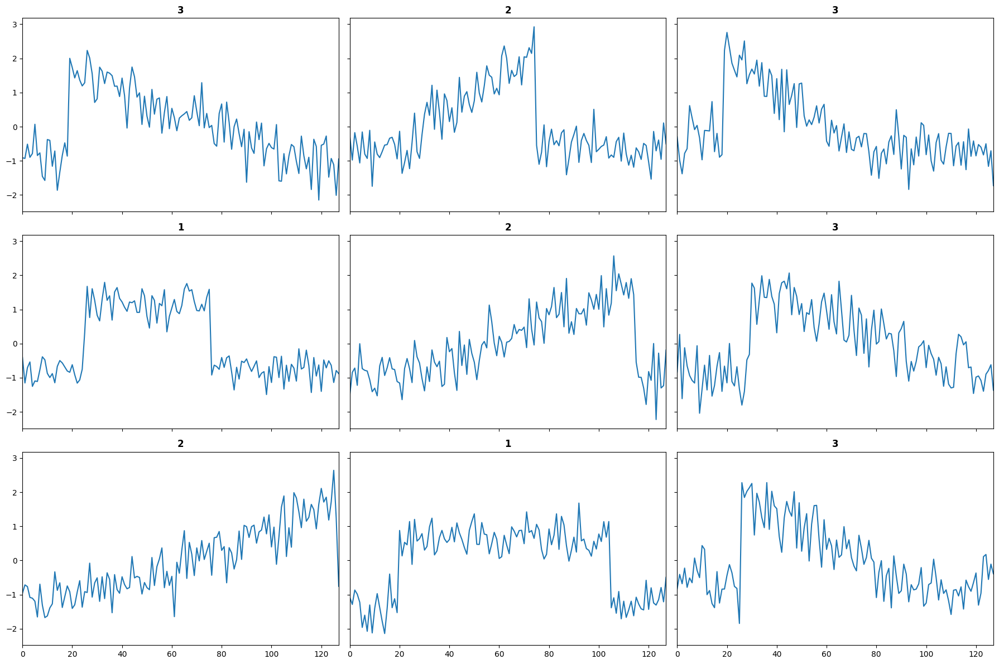

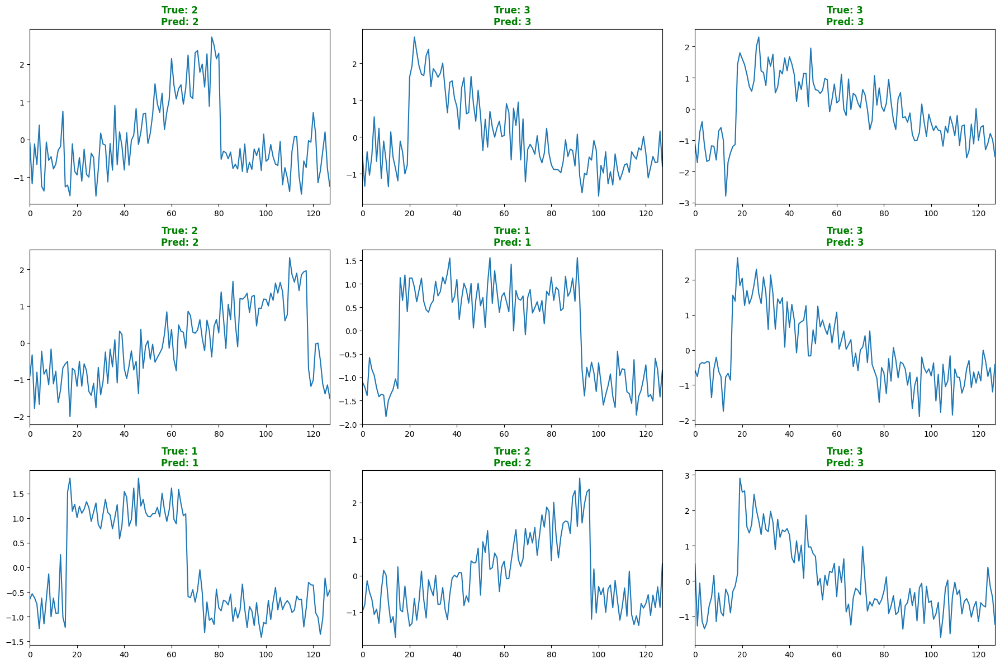

In [11]:
train_acc, valid_acc, test_acc, test_preds, valid_preds = validator(learn_new, X_test, y_test)

In [12]:
learn_new.summary()

not enough values to plot a chart


LSTM_FCN (Input shape: 8 x 1 x 128)
Layer (type)         Output Shape         Param #    Trainable 
                     8 x 1 x 100         
LSTM                                                           
Dropout                                                        
____________________________________________________________________________
                     8 x 128 x 128       
Conv1d                                    896        True      
BatchNorm1d                               256        True      
ReLU                                                           
____________________________________________________________________________
                     8 x 256 x 128       
Conv1d                                    163840     True      
BatchNorm1d                               512        True      
ReLU                                                           
____________________________________________________________________________
                     8 x 128 x 

In [13]:
class_labels = ['Cylinder','Bell','Funnel']

In [14]:
def predict_fn(data, learner):
    if len(data.shape) == 2:
        data = data.reshape(data.shape[0], 1, data.shape[1])
    data_dl = test_loader.test_dataloader(learner, data)
    data_probas, _, data_preds = learner.get_preds(dl=data_dl, with_decoded=True, save_preds=None)
    return data_probas, data_preds

### Apply LOMATCE (Local Model-Agnostic TimeSeries Classifers Explanation)
LOMATCE is a novel Explainable AI (XAI) method designed specifically for time series classifiers. It generates explanations that preserve the temporal characteristics of time series data.

INFO:lomatce.explainer:Starting time series local explanation
INFO:lomatce.explainer:Perturbed instances shape for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 15243 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 10877 samples)
Optimal number of clusters for Decreasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 36380 samples)
Optimal number of clusters for LocalMax_ch1: 3
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 36839 samples)
Optimal number of clusters for LocalMin_ch1: 3


INFO:lomatce.explainer:Final data shape: (1001, 44) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 44


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.96
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.93
INFO:lomatce.explainer:Model Type: Ridge


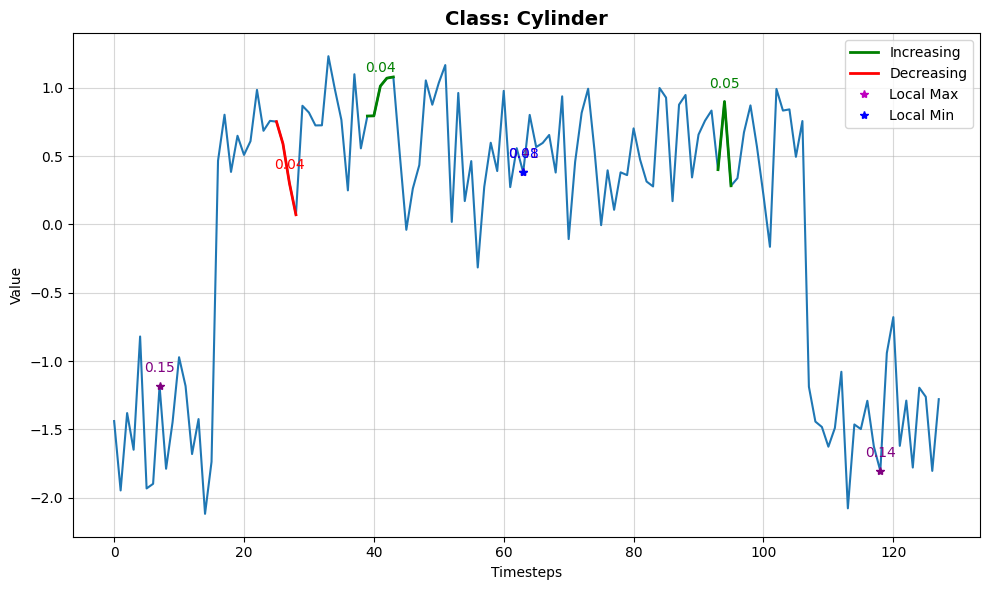

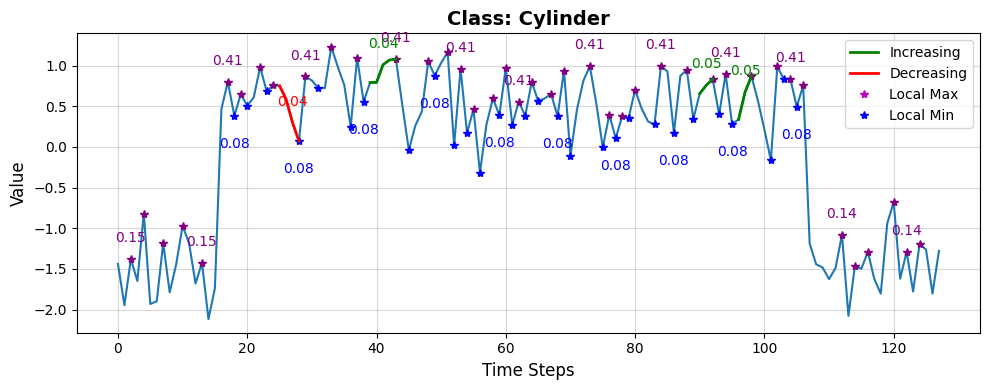

Prediction probability : tensor([0.9106, 0.0327, 0.0567])
Cylinder:                      0.9106
Bell:                      0.0327
Funnel:                      0.0567


In [15]:

origi_instance_0 = X_test[5] # Instance that is classified as Cylinder
explanation = lomatce_explainer.explain_instance(origi_instance_0, lambda data: predict_fn(data, learn_new), num_perturbations=1000, top_n=15, class_names=class_labels, replacement_method='zero')

INFO:lomatce.explainer:Starting time series local explanation
INFO:lomatce.explainer:Perturbed instances shape for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 16596 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 14253 samples)
Optimal number of clusters for Decreasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 36891 samples)
Optimal number of clusters for LocalMax_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 37004 samples)
Optimal number of clusters for LocalMin_ch1: 19


INFO:lomatce.explainer:Final data shape: (1001, 76) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 76


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.98
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.72
INFO:lomatce.explainer:Model Type: Ridge


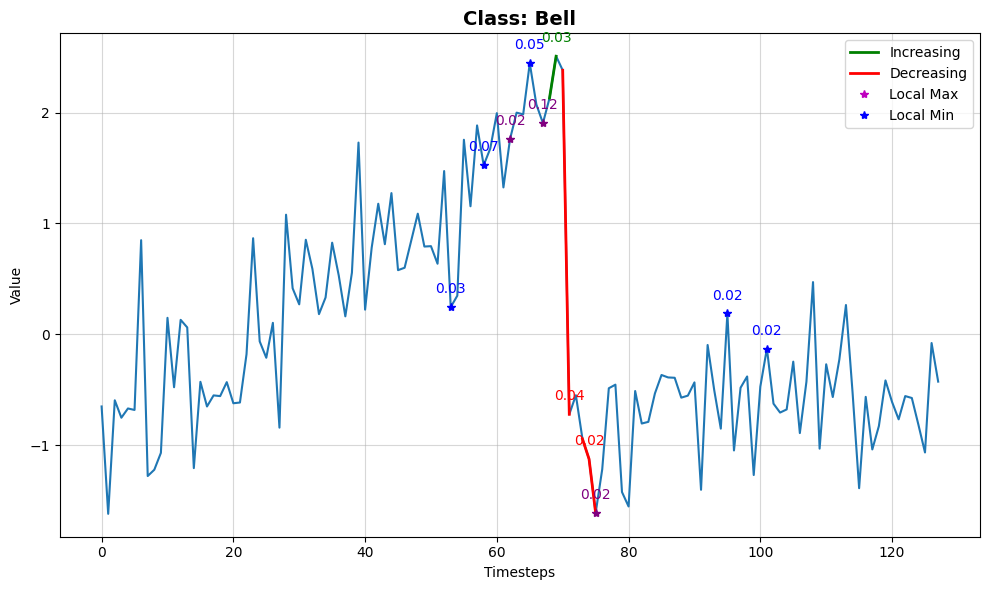

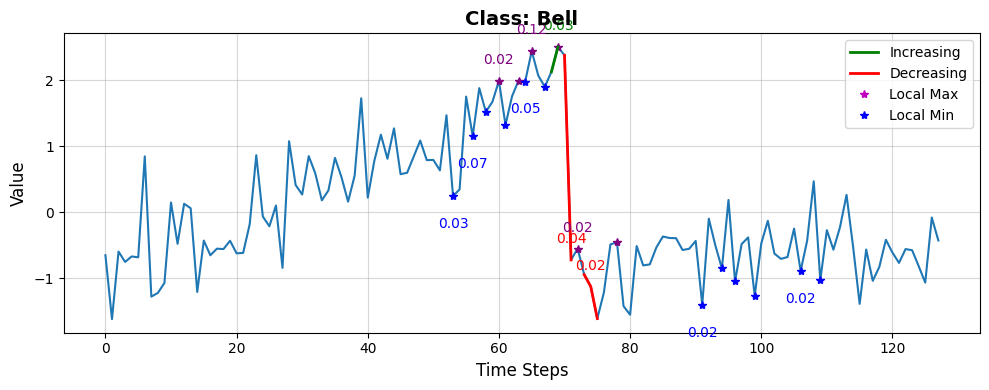

Prediction probability : tensor([0.1262, 0.7317, 0.1421])
Cylinder:                      0.1262
Bell:                      0.7317
Funnel:                      0.1421


In [16]:
origi_instance_0 = X_test[7] # Instance that is classified as Bell
explanation = lomatce_explainer.explain_instance(origi_instance_0, lambda data: predict_fn(data, learn_new), num_perturbations=1000, top_n=15, class_names=class_labels, replacement_method='zero')

INFO:lomatce.explainer:Starting time series local explanation


INFO:lomatce.explainer:Perturbed instances shape for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 12586 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 16981 samples)
Optimal number of clusters for Decreasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 33334 samples)
Optimal number of clusters for LocalMax_ch1: 3
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 33414 samples)
Optimal number of clusters for LocalMin_ch1: 3


INFO:lomatce.explainer:Final data shape: (1001, 44) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 44


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.96
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.68
INFO:lomatce.explainer:Model Type: Ridge


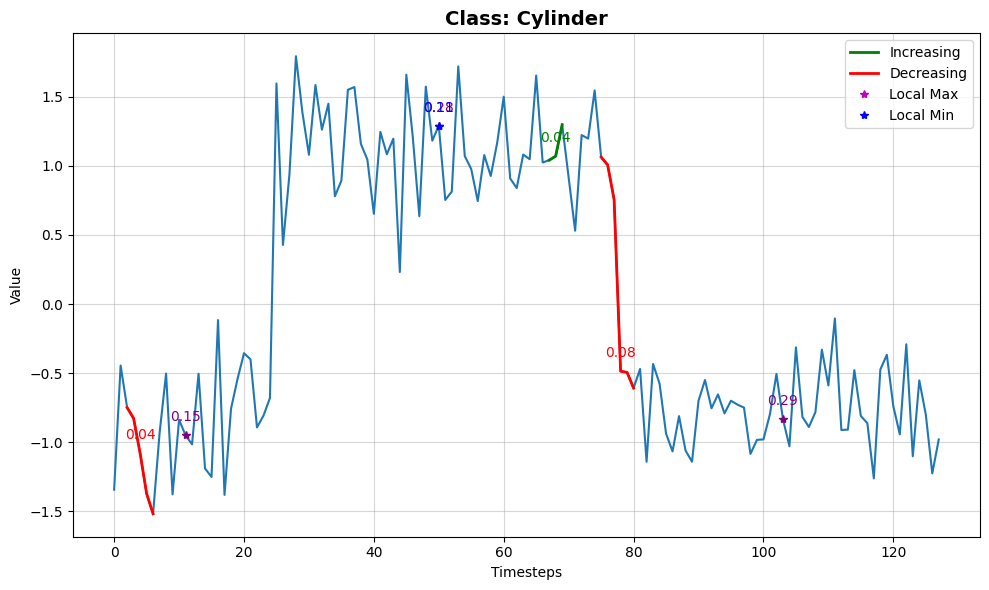

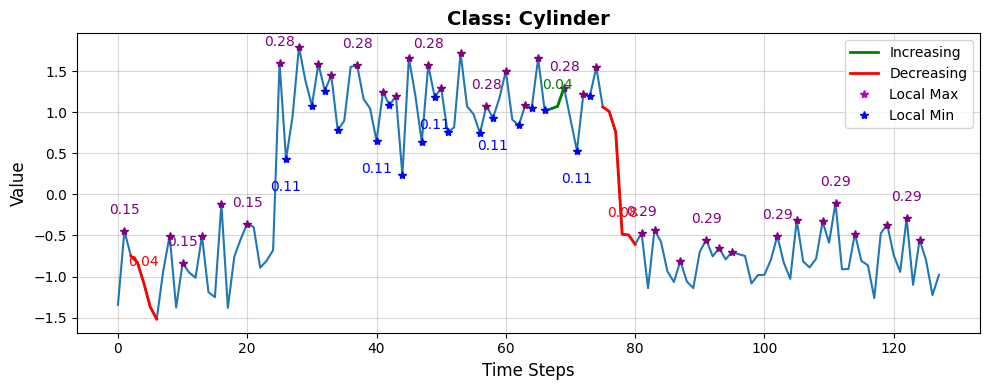

Prediction probability : tensor([0.6637, 0.0960, 0.2403])
Cylinder:                      0.6637
Bell:                      0.0960
Funnel:                      0.2403


In [17]:
origi_instance_1 = X_test[3] # Instance that is classified as cylinder
explanation = lomatce_explainer.explain_instance(origi_instance_1, lambda data: predict_fn(data, learn_new), num_perturbations=1000, top_n=15, class_names=class_labels, replacement_method='zero')

INFO:lomatce.explainer:Starting time series local explanation
INFO:lomatce.explainer:Perturbed instances shape for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 16659 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 14341 samples)
Optimal number of clusters for Decreasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 36923 samples)
Optimal number of clusters for LocalMax_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 37049 samples)
Optimal number of clusters for LocalMin_ch1: 18


INFO:lomatce.explainer:Final data shape: (1001, 75) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 75


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.98
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.73
INFO:lomatce.explainer:Model Type: Ridge


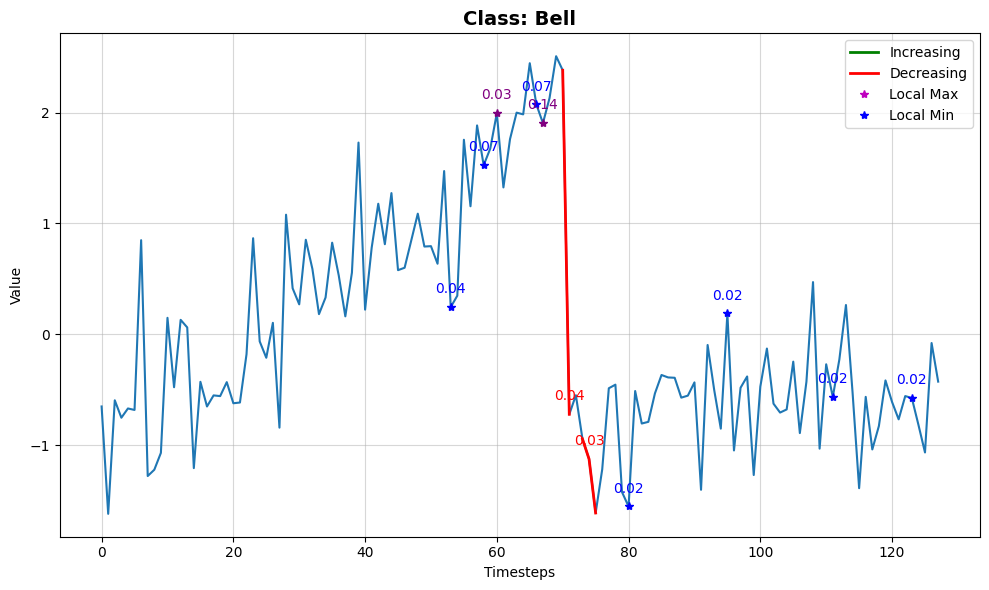

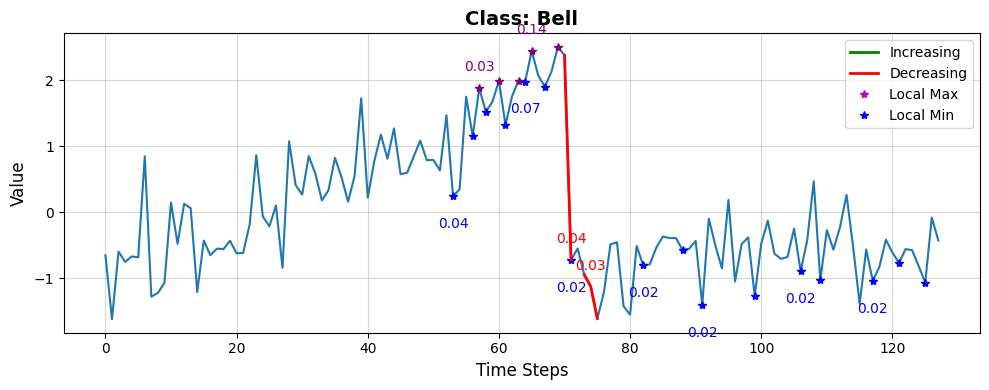

Prediction probability : tensor([0.1262, 0.7317, 0.1421])
Cylinder:                      0.1262
Bell:                      0.7317
Funnel:                      0.1421


In [18]:
origi_instance_2 = X_test[7] # Instance that is classified as bell
explanation = lomatce_explainer.explain_instance(origi_instance_2, lambda data: predict_fn(data, learn_new), num_perturbations=1000, top_n=15, class_names=class_labels, replacement_method='total_mean')

INFO:lomatce.explainer:Starting time series local explanation
INFO:lomatce.explainer:Perturbed instances shape for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 12544 samples)
Optimal number of clusters for Increasing_ch1: 17
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 19453 samples)
Optimal number of clusters for Decreasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 33700 samples)
Optimal number of clusters for LocalMax_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 32621 samples)
Optimal number of clusters for LocalMin_ch1: 19


INFO:lomatce.explainer:Final data shape: (1001, 74) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 74


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.93
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.54
INFO:lomatce.explainer:Model Type: Ridge


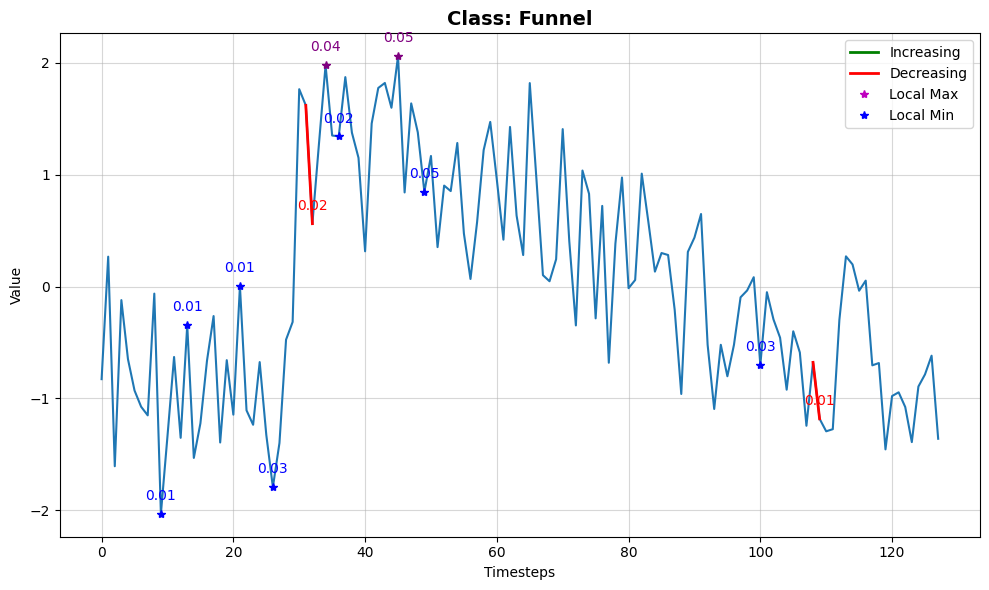

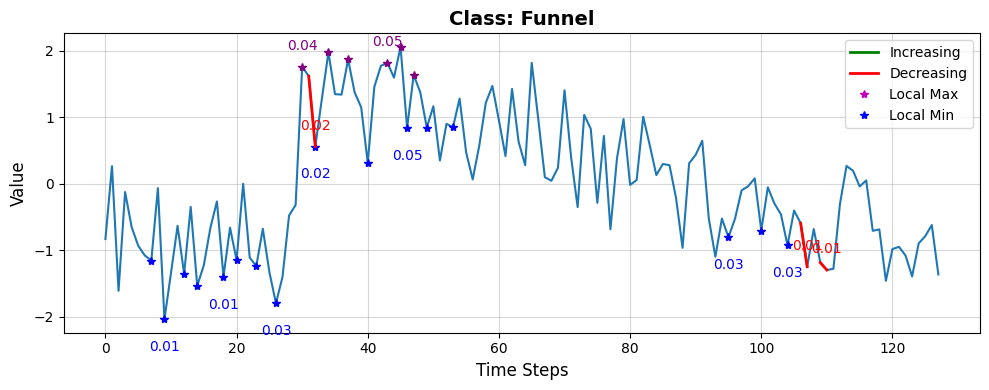

Prediction probability : tensor([0.1916, 0.2709, 0.5376])
Cylinder:                      0.1916
Bell:                      0.2709
Funnel:                      0.5376


In [19]:
origi_instance_3 = X_test[4] # Instance that is classified as Funnel
explanation = lomatce_explainer.explain_instance(origi_instance_3, lambda data: predict_fn(data, learn_new), num_perturbations=1000, top_n=15, class_names=class_labels, replacement_method='zero')

INFO:lomatce.explainer:Starting time series local explanation
INFO:lomatce.explainer:Perturbed instances shape for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 16155 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 12585 samples)
Optimal number of clusters for Decreasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 36035 samples)
Optimal number of clusters for LocalMax_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 36975 samples)
Optimal number of clusters for LocalMin_ch1: 19


INFO:lomatce.explainer:Final data shape: (1001, 76) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 76


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.94
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.69
INFO:lomatce.explainer:Model Type: Ridge


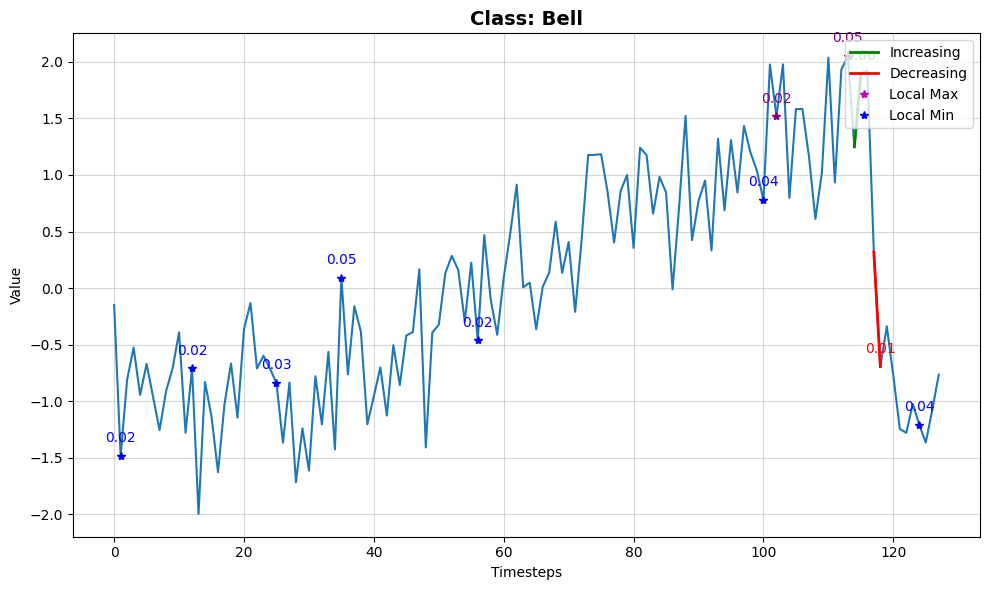

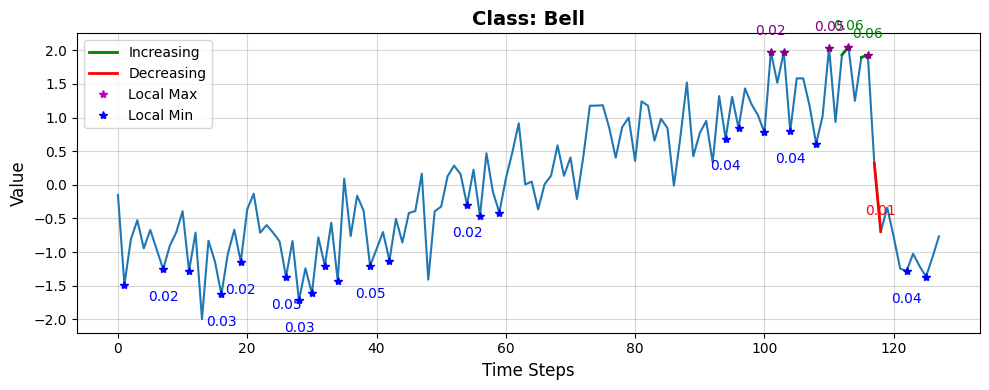

Prediction probability : tensor([0.2037, 0.6893, 0.1071])
Cylinder:                      0.2037
Bell:                      0.6893
Funnel:                      0.1071


In [20]:
origi_instance_2 = X_test[16] # Instance that is classified as bell
explanation = lomatce_explainer.explain_instance(origi_instance_2, lambda data: predict_fn(data, learn_new), num_perturbations=1000, top_n=15, class_names=class_labels, replacement_method='zero')

INFO:lomatce.explainer:Starting time series local explanation


Replacement methods: zero


INFO:lomatce.explainer:Perturbed instances shap for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 13574 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 16291 samples)
Optimal number of clusters for Decreasing_ch1: 16
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 38126 samples)
Optimal number of clusters for LocalMax_ch1: 18
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 37262 samples)
Optimal number of clusters for LocalMin_ch1: 19


INFO:lomatce.explainer:Final data shape: (1001, 72) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 72


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.97
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.79
INFO:lomatce.explainer:Model Type: Ridge


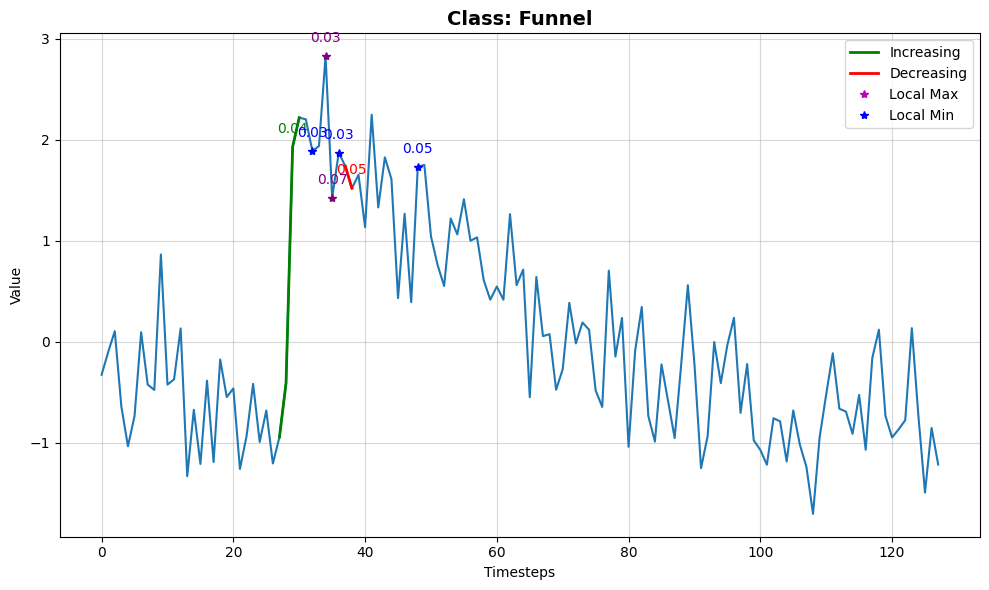

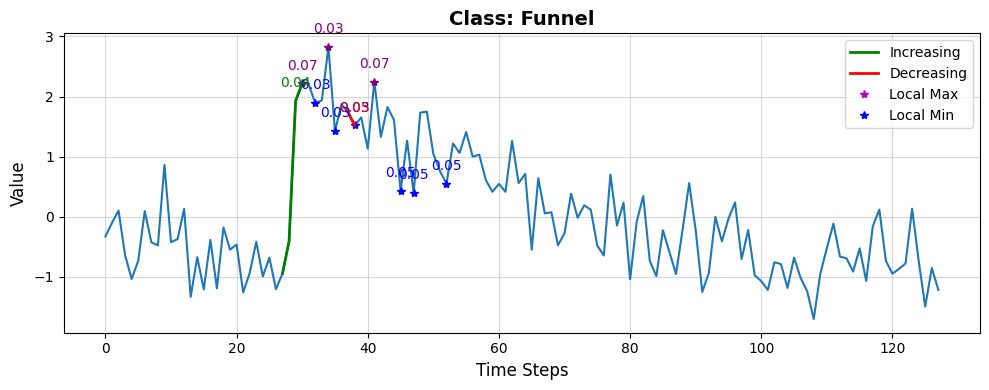

INFO:lomatce.explainer:Starting time series local explanation


Predection probability : tensor([0.0844, 0.1198, 0.7957])
Cylinder:                      0.0844
Bell:                      0.1198
Funnel:                      0.7957


INFO:lomatce.explainer:Perturbed instances shap for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 15077 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 15289 samples)
Optimal number of clusters for Decreasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 34600 samples)
Optimal number of clusters for LocalMax_ch1: 3
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 35588 samples)
Optimal number of clusters for LocalMin_ch1: 3


INFO:lomatce.explainer:Final data shape: (1001, 44) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 44


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.93
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.77
INFO:lomatce.explainer:Model Type: Ridge


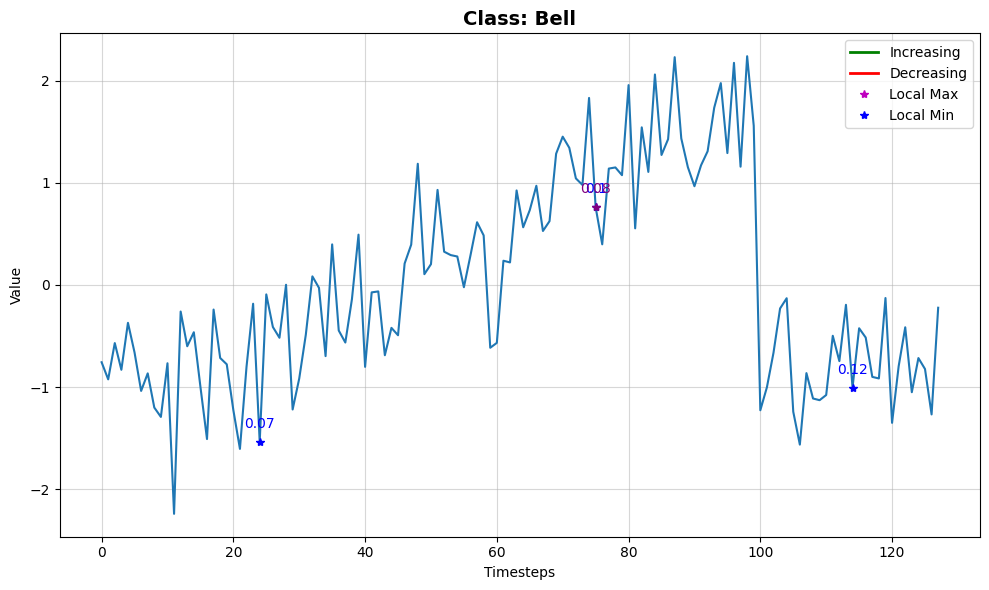

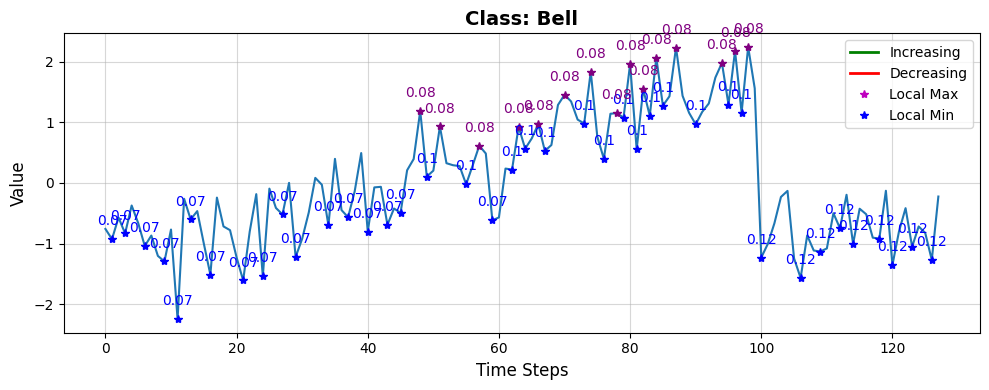

INFO:lomatce.explainer:Starting time series local explanation


Predection probability : tensor([0.1180, 0.7757, 0.1063])
Cylinder:                      0.1180
Bell:                      0.7757
Funnel:                      0.1063


INFO:lomatce.explainer:Perturbed instances shap for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 12361 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 15267 samples)
Optimal number of clusters for Decreasing_ch1: 18
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 38595 samples)
Optimal number of clusters for LocalMax_ch1: 4
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 37159 samples)
Optimal number of clusters for LocalMin_ch1: 19


INFO:lomatce.explainer:Final data shape: (1001, 60) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 60


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.98
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.74
INFO:lomatce.explainer:Model Type: Ridge


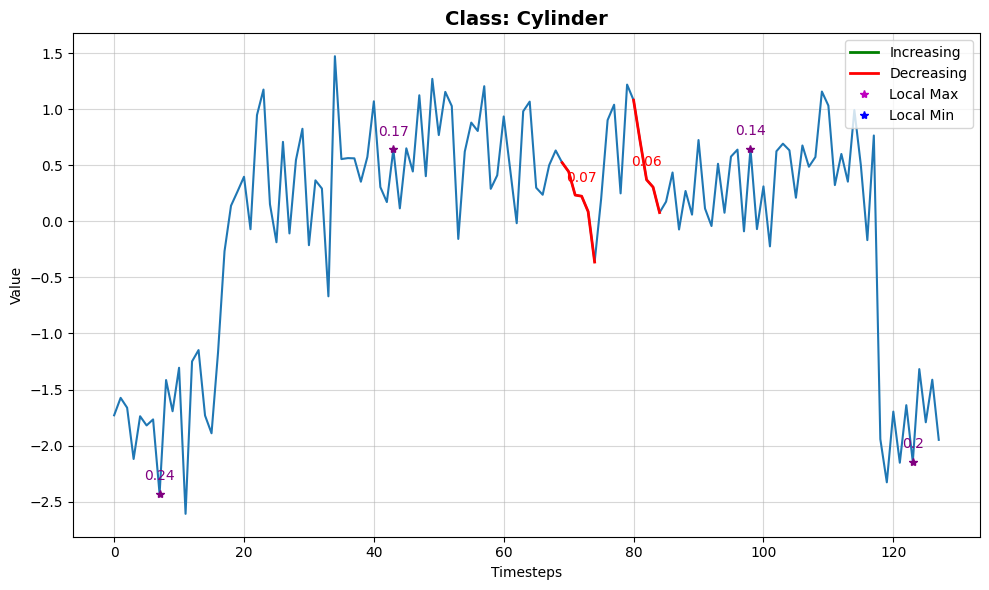

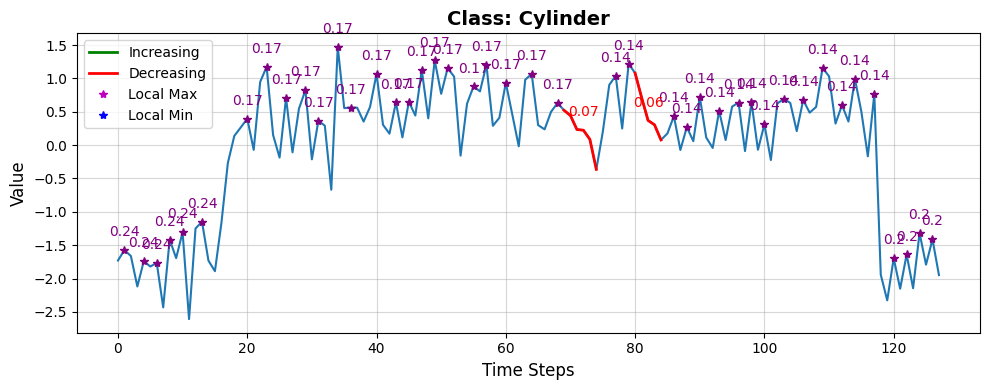

INFO:lomatce.explainer:Starting time series local explanation


Predection probability : tensor([0.7289, 0.1401, 0.1309])
Cylinder:                      0.7289
Bell:                      0.1401
Funnel:                      0.1309
Replacement methods: total_mean


INFO:lomatce.explainer:Perturbed instances shap for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 13382 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 19446 samples)
Optimal number of clusters for Decreasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 36102 samples)
Optimal number of clusters for LocalMax_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 37059 samples)
Optimal number of clusters for LocalMin_ch1: 19


INFO:lomatce.explainer:Final data shape: (1001, 76) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 76


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.98
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.76
INFO:lomatce.explainer:Model Type: Ridge


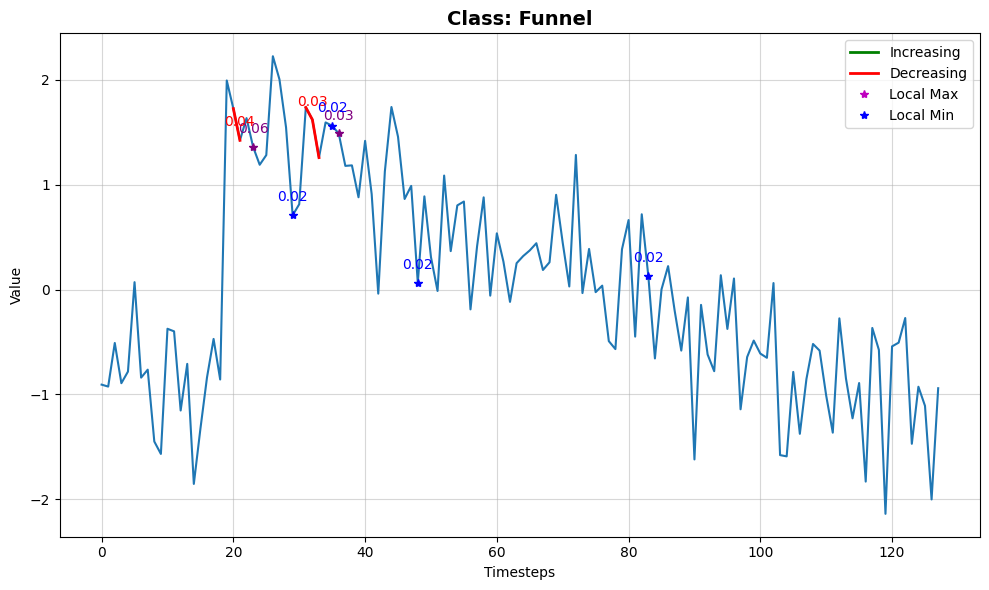

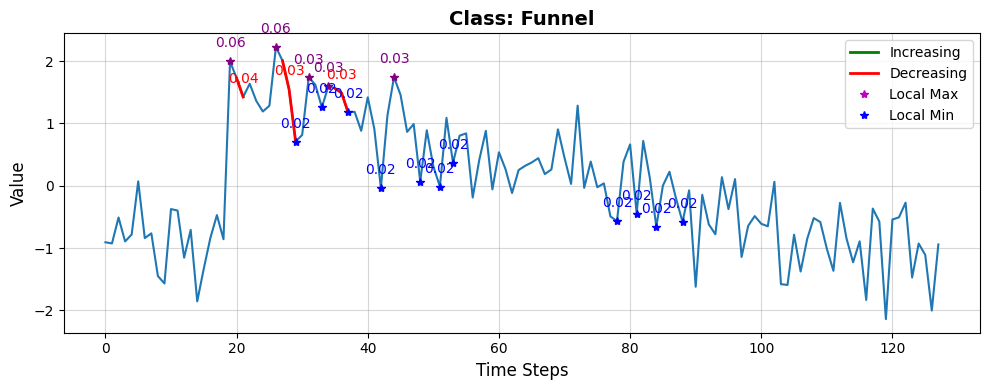

INFO:lomatce.explainer:Starting time series local explanation


Predection probability : tensor([0.1301, 0.1135, 0.7565])
Cylinder:                      0.1301
Bell:                      0.1135
Funnel:                      0.7565


INFO:lomatce.explainer:Perturbed instances shap for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 9049 samples)
Optimal number of clusters for Increasing_ch1: 18
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 14330 samples)
Optimal number of clusters for Decreasing_ch1: 17
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 38813 samples)
Optimal number of clusters for LocalMax_ch1: 17
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 39821 samples)
Optimal number of clusters for LocalMin_ch1: 19


INFO:lomatce.explainer:Final data shape: (1001, 71) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 71


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.96
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.76
INFO:lomatce.explainer:Model Type: Ridge


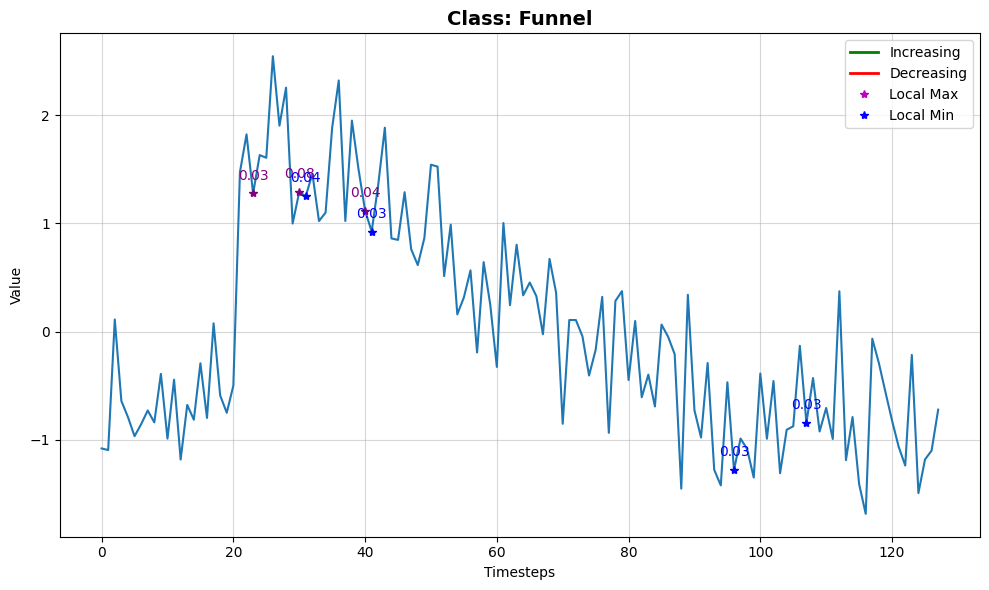

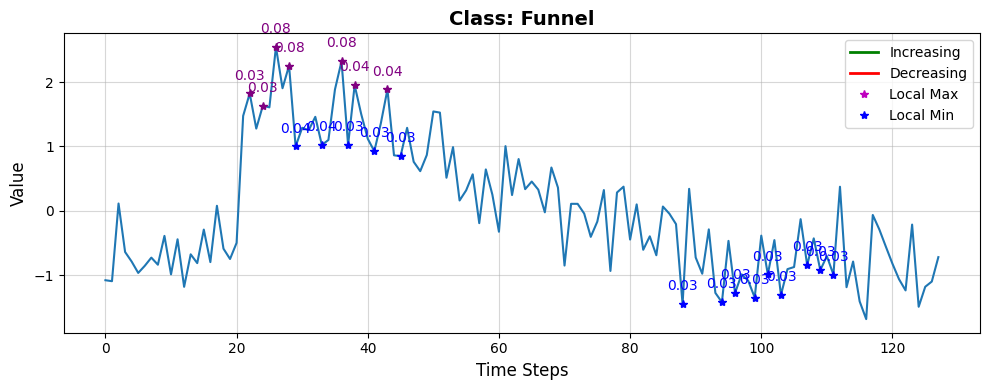

INFO:lomatce.explainer:Starting time series local explanation


Predection probability : tensor([0.1125, 0.1203, 0.7672])
Cylinder:                      0.1125
Bell:                      0.1203
Funnel:                      0.7672


INFO:lomatce.explainer:Perturbed instances shap for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 15311 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 14441 samples)
Optimal number of clusters for Decreasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 37971 samples)
Optimal number of clusters for LocalMax_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 37781 samples)
Optimal number of clusters for LocalMin_ch1: 17


INFO:lomatce.explainer:Final data shape: (1001, 74) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 74


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.95
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.69
INFO:lomatce.explainer:Model Type: Ridge


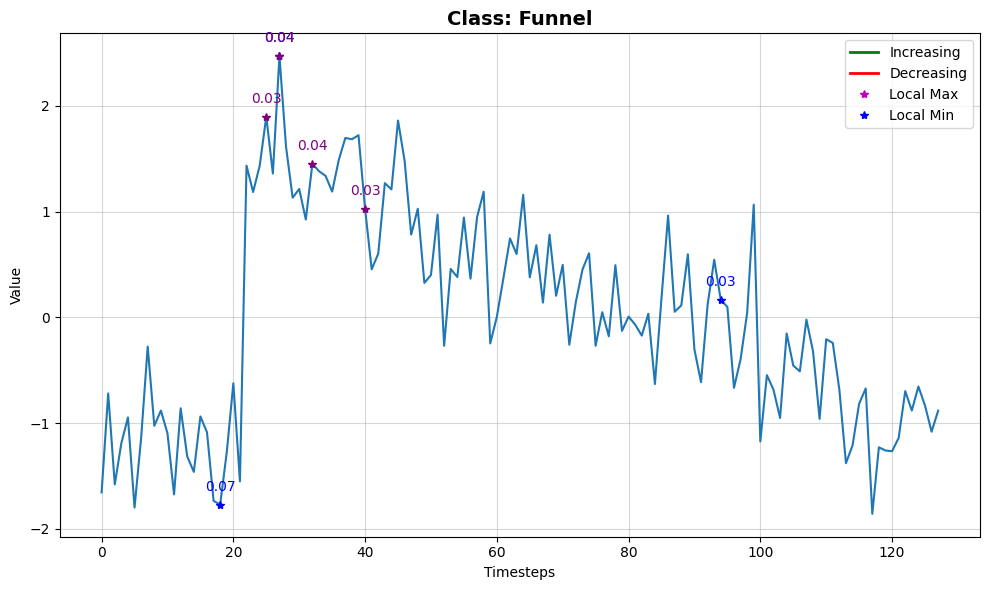

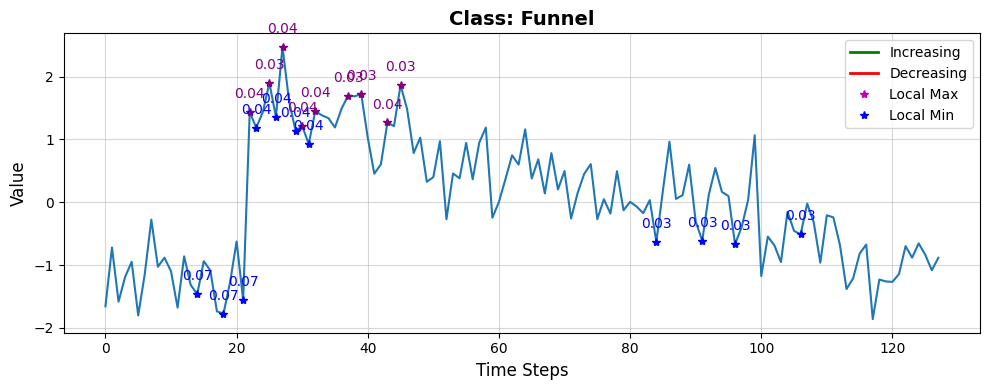

Predection probability : tensor([0.2001, 0.1042, 0.6957])
Cylinder:                      0.2001
Bell:                      0.1042
Funnel:                      0.6957


In [21]:
# Define the replacement methods
replacement_methods = ['zero', 'total_mean']

# Initialize a dictionary to store the results
results = {}

# Iterate over the replacement methods
for method in replacement_methods:
    # Initialize a list to store prediction scores for the current method
    print(f'Replacement methods: {method}')
    prediction_scores = []
    
    # Run the function 100 times for the current method
    for _ in range(3):
        # Randomly select an instance
        origi_instance = X_test[np.random.randint(len(X_test))]

        # Call the ts_local_explanation function with the current replacement method
        explanation = lomatce_explainer.explain_instance(origi_instance, lambda data : predict_fn(data, learn_new), num_perturbations=1000, class_names=class_labels, replacement_method=method)
        
        # Append the prediction score to the list
        # prediction_scores.append(prediction_score)
    
    # Compute the mean and standard deviation of the prediction scores for the current method
#     mean_prediction_score = np.mean(prediction_scores)
#     std_prediction_score = np.std(prediction_scores)
    
#     # Store the results in the dictionary
#     results[method] = (mean_prediction_score, std_prediction_score)

# # Print the results in tabular format
# print("Replacement Method\tAverage Prediction Score\tStandard Deviation")
# for method, (mean_score, std_score) in results.items():
#     print(f"{method}\t\t\t{mean_score:.2f}  \u00B1 {std_score:.2f}")


### Integrated Gradient

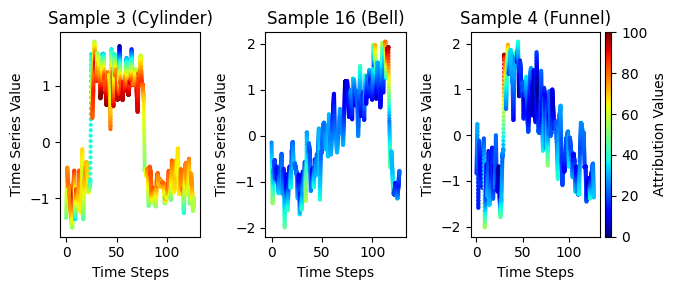

In [22]:
import torch
import numpy as np
from torch import tensor
from scipy.interpolate import interp1d
import matplotlib.pyplot as plt
from captum.attr import IntegratedGradients
from mpl_toolkits.axes_grid1 import make_axes_locatable

# Define a function to compute Integrated Gradients
def compute_integrated_gradients(x, target):
    integrated_gradients = IntegratedGradients(learn_new.model.cpu())
    attr, delta = integrated_gradients.attribute(x, target=target, return_convergence_delta=True)
    return attr.squeeze().cpu().numpy()

# Function to plot Integrated Gradients
def plot_integrated_gradients(x_sample, target, ax):
    # Compute Integrated Gradients for the sample
    attributions = compute_integrated_gradients(x_sample, target)

    max_length = 3000  # Adjust as needed

    time_steps = torch.arange(len(x_sample.reshape(-1,1)))  # Generate time step indices
    minimum = np.min(attributions)

    attributions = attributions - minimum
    attributions = attributions / max(attributions)
    attributions = attributions * 100

    x = np.linspace(0, x_sample.shape[2] - 1, max_length, endpoint=True)

    # Interpolate the time series values
    f_ts = interp1d(range(x_sample.shape[2]), x_sample[0, 0, :])
    y_ts = f_ts(x)

    # Interpolate the attribution values
    f_cas = interp1d(range(len(attributions)), attributions)
    cas_interpolated = f_cas(x).astype(int)

    # Plot the interpolated attribution values against the interpolated time series
    scatter = ax.scatter(x=x, y=y_ts, c=cas_interpolated, cmap='jet', marker='.', vmin=0, vmax=100, linewidths=0.0)
    return scatter

# Select two samples from the test set for visualization
sample_indices = [3, 16, 4]
targets = [0, 1, 2]  # Specify the target for each sample
x_samples = [tensor(X_test[sample_idx][None]) for sample_idx in sample_indices]

# Create subplots side by side
fig, axs = plt.subplots(1, 3, figsize=(7, 3))
labels = class_labels

# Plot Integrated Gradients for each sample
for i, (x_sample, target, ax) in enumerate(zip(x_samples, targets, axs)):
    scatter = plot_integrated_gradients(x_sample, target, ax)
    ax.set_title(f'Sample {sample_indices[i]} ({labels[target]})')
    ax.set_xlabel('Time Steps')
    ax.set_ylabel('Time Series Value')

# Create a new axis on the right side of the last subplot for the color bar
divider = make_axes_locatable(axs[-1])
cax = divider.append_axes("right", size="5%", pad=0.05)
cbar = fig.colorbar(scatter, cax=cax)
cbar.set_label('Attribution Values')

plt.tight_layout()
plt.show()


Cylinder found: 46
Bell found: 46
Funnel found: 47


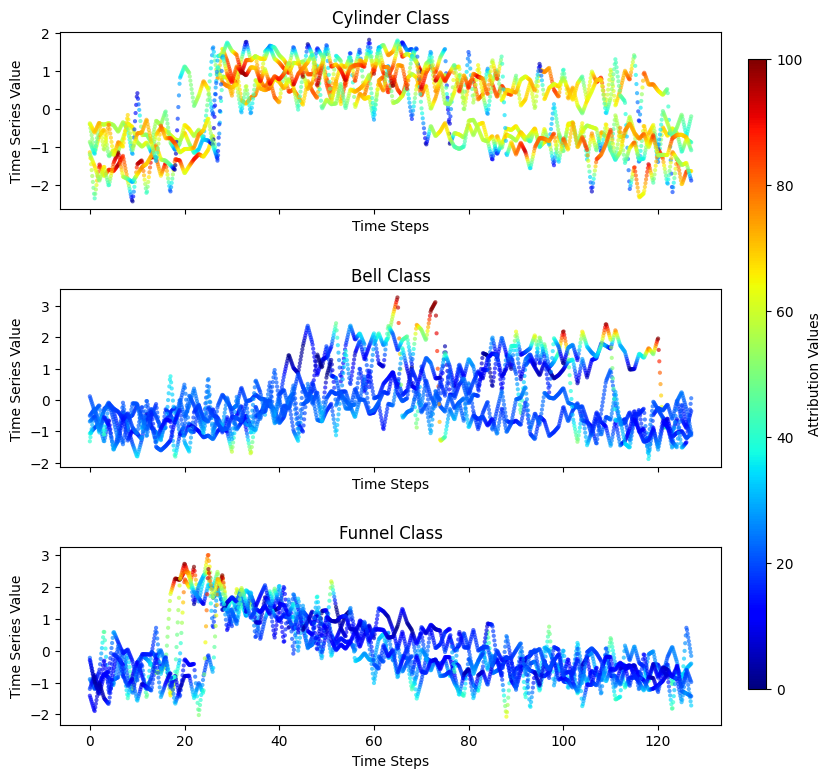

In [23]:
import torch
import numpy as np
from torch import tensor
from scipy.interpolate import interp1d
import matplotlib.pyplot as plt
from captum.attr import IntegratedGradients
from matplotlib.colors import Normalize
from matplotlib.cm import ScalarMappable

# ---------------------------------------------------
# Integrated Gradients
# ---------------------------------------------------

def compute_integrated_gradients(x, target):
    model = learn_new.model.cpu()
    model.eval()

    ig = IntegratedGradients(model)

    attr, delta = ig.attribute(
        x.float(),
        target=target,
        return_convergence_delta=True
    )

    return attr.squeeze().detach().cpu().numpy()


# ---------------------------------------------------
# Plot overlaid IG explanations for one predicted class
# ---------------------------------------------------

def plot_class_explanations(ax, class_idx, n_samples=3, max_length=1000):
    pred_indices = np.where(np.array(test_preds) == class_idx)[0]

    print(f"{class_labels[class_idx]} found:", len(pred_indices))

    chosen = np.random.choice(
        pred_indices,
        size=min(n_samples, len(pred_indices)),
        replace=False
    )

    for idx in chosen:
        x_sample = tensor(
            X_test[idx][None],
            dtype=torch.float32
        )

        attributions = compute_integrated_gradients(
            x_sample,
            target=class_idx
        )

        # Normalise attribution to 0–100
        attributions = attributions - np.min(attributions)
        attributions = attributions / (np.max(attributions) + 1e-8)
        attributions = attributions * 100

        x_interp = np.linspace(
            0,
            x_sample.shape[2] - 1,
            max_length,
            endpoint=True
        )

        f_ts = interp1d(
            range(x_sample.shape[2]),
            x_sample[0, 0, :].numpy()
        )
        y_ts = f_ts(x_interp)

        f_attr = interp1d(
            range(len(attributions)),
            attributions
        )
        attr_interp = f_attr(x_interp)

        ax.scatter(
            x_interp,
            y_ts,
            c=attr_interp,
            cmap="jet",
            norm=norm,
            marker=".",
            linewidths=0.0,
            alpha=0.65
        )

    ax.set_title(f"{class_labels[class_idx]} Class")
    ax.set_xlabel("Time Steps")
    ax.set_ylabel("Time Series Value")


# ---------------------------------------------------
# Shared colour scale
# ---------------------------------------------------

norm = Normalize(vmin=0, vmax=100)

# ---------------------------------------------------
# Create figure
# ---------------------------------------------------

fig, axs = plt.subplots(
    len(class_labels),
    1,
    figsize=(9, 9),
    sharex=True
)

if len(class_labels) == 1:
    axs = [axs]

for class_idx, ax in enumerate(axs):
    plot_class_explanations(
        ax,
        class_idx,
        n_samples=5,
        max_length=1000
    )

# Add more vertical space between subplots
fig.subplots_adjust(
    right=0.86,
    hspace=0.45
)

# Shared colourbar on the far right
cbar_ax = fig.add_axes([0.89, 0.15, 0.02, 0.7])

sm = ScalarMappable(norm=norm, cmap="jet")
sm.set_array([])

cbar = fig.colorbar(sm, cax=cbar_ax)
cbar.set_label("Attribution Values")

plt.show()

### LIME


🔍 Explaining instance 0 — Predicted class: Cylinder


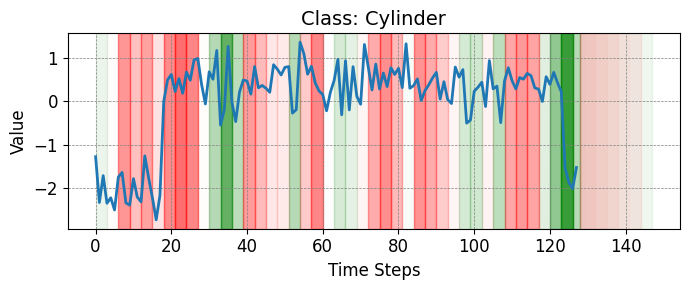


🔍 Explaining instance 1 — Predicted class: Bell


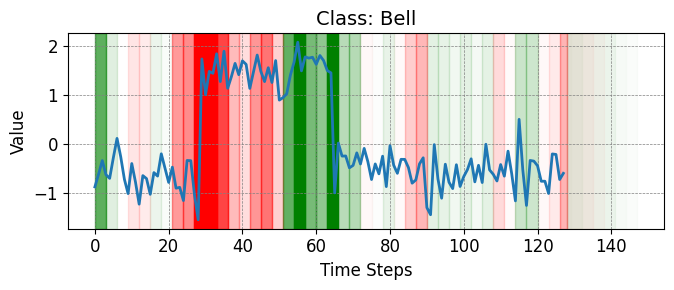


🔍 Explaining instance 2 — Predicted class: Cylinder


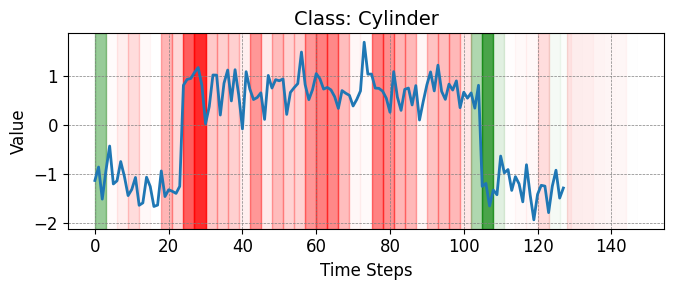


🔍 Explaining instance 3 — Predicted class: Cylinder


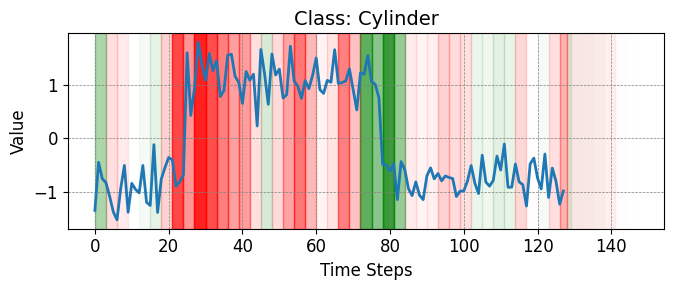


🔍 Explaining instance 4 — Predicted class: Funnel


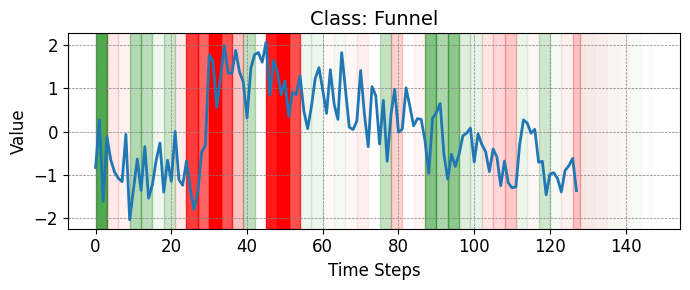

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import math
from lomatce.lime_timeseries import LimeTimeSeriesExplainer
import logging
logging.getLogger().setLevel(logging.WARNING) 

# Predict function that LIME will use
def predict_fn(data):
    if len(data.shape) == 2:
        data = data.reshape(data.shape[0], 1, data.shape[1])  # Handle univariate case
    data_dl = test_loader.test_dataloader(learn_new, data)
    data_probas, _, _ = learn_new.get_preds(dl=data_dl, with_decoded=True, save_preds=None)
    return data_probas.numpy()

# Compute LIME and visualize importance
def compute_lime_importances(flat_series, predict_fn, num_slices=25, num_features=10, num_samples=5000, class_label=None, class_names=None):
    if num_slices is None:
        num_slices = len(flat_series)
    explainer = LimeTimeSeriesExplainer(class_names=class_names)

    exp = explainer.explain_instance(
        flat_series,
        predict_fn,
        num_features=num_features,
        num_samples=num_samples,
        num_slices=num_slices,
        replacement_method='total_mean'
    )

    values_per_slice = math.ceil(len(flat_series) / num_slices)
    segments_weights = exp.as_list()
    sorted_segments = sorted(segments_weights, key=lambda x: x[1], reverse=True)

    # Plot
    plt.figure(figsize=(7, 3))
    plt.plot(flat_series, color='C0', linewidth=2)

    for feature, weight in sorted_segments:
        start = feature * values_per_slice
        end = min(start + values_per_slice, len(flat_series))
        color = 'red' if weight < 0 else 'green'
        alpha = min(abs(weight) * 20, 1.0)
        plt.axvspan(start, end, color=color, alpha=alpha, edgecolor='none')

    plt.title(f'Class: {class_label}', fontsize=14)
    plt.xlabel('Time Steps', fontsize=12)
    plt.ylabel('Value', fontsize=12)
    plt.grid(True, linestyle='--', linewidth=0.5, color='gray')
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)
    plt.gca().xaxis.set_major_locator(plt.MaxNLocator(integer=True))
    plt.tight_layout()
    plt.show()

    return sorted_segments

# 🔁 Explain multiple instances
num_instances_to_explain = 5  # Change to 6 or more if desired
for idx in range(num_instances_to_explain):
    label_index = int(test_preds[idx])  # Convert '0' or '1' string to int
    class_label = class_labels[label_index]

    instance = X_test[idx]  # Shape: (channels, time)
    flat_series = instance.flatten() if instance.ndim == 2 else instance  # Flatten if 2D

    print(f"\n🔍 Explaining instance {idx} — Predicted class: {class_label}")
    compute_lime_importances(
        flat_series,
        predict_fn,
        num_slices=50,
        num_features=50,
        num_samples=5000,
        class_label=class_label,
        class_names=class_labels
    )


### SHAP


🔍 Explaining instance 0 — Predicted class: Cylinder


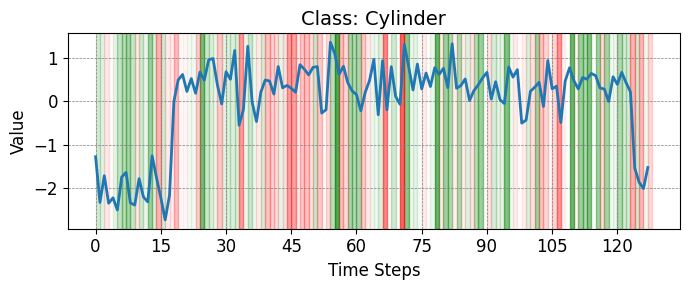


🔍 Explaining instance 1 — Predicted class: Bell


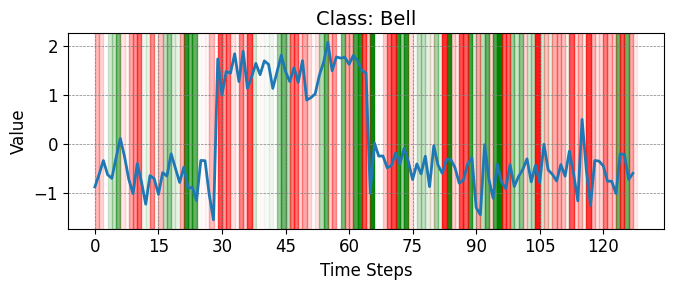


🔍 Explaining instance 2 — Predicted class: Cylinder


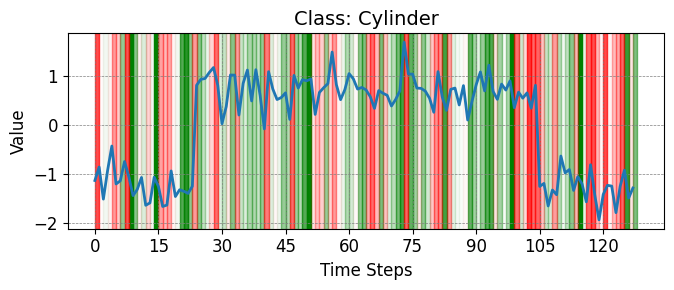

In [ ]:
import shap
import numpy as np
import matplotlib.pyplot as plt
import math

# --- 1. Segmenting Function ---
def create_segments(X, num_segments=None):
    num_samples, num_channels, sequence_length = X.shape
    if num_segments is None:
        num_segments = sequence_length
    segment_length = sequence_length // num_segments
    return num_segments, segment_length

# --- 2. Predict Function for SHAP ---
def predict_fn(masks, instance, background_data, num_segments, segment_length, learner):
    masked_inputs = []
    for mask in masks:
        masked_instance = instance.copy()
        for seg_idx in range(num_segments):
            start = seg_idx * segment_length
            end = (seg_idx + 1) * segment_length
            if mask[seg_idx] == 0:
                random_idx = np.random.randint(0, background_data.shape[0])
                background_segment = background_data[random_idx, :, start:end]
                masked_instance[0, :, start:end] = background_segment
        masked_inputs.append(masked_instance[0])
    masked_inputs = np.stack(masked_inputs)  # (num_masks, channels, time)
    data_dl = test_loader.test_dataloader(learner, masked_inputs)
    data_probas, _, _ = learner.get_preds(dl=data_dl, with_decoded=True, save_preds=None)
    return data_probas.numpy()

# --- 3. Plotting SHAP Segment Importance ---
def plot_segment_importance(flat_series, shap_values, segment_length, class_name):
    num_segments = len(shap_values)
    flat_series = flat_series.flatten() if len(flat_series.shape) == 2 else flat_series
    values_per_slice = math.ceil(len(flat_series) / segment_length)
    sorted_segments = sorted(enumerate(shap_values), key=lambda x: x[1], reverse=True)

    plt.figure(figsize=(7, 3))
    plt.plot(flat_series, color='C0', linewidth=2)
    
    for segment_idx, weight in sorted_segments:
        start = segment_idx * values_per_slice
        end = min(start + values_per_slice, len(flat_series))
        color = 'red' if weight < 0 else 'green'
        alpha = min(abs(weight) * 10, 1.0)
        plt.axvspan(start, end, color=color, alpha=alpha, edgecolor='none')

    plt.title(f'Class: {class_name}', fontsize=14)
    plt.xlabel('Time Steps', fontsize=12)
    plt.ylabel('Value', fontsize=12)
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)
    plt.grid(True, which='both', linestyle='--', linewidth=0.5, color='gray')
    plt.gca().xaxis.set_major_locator(plt.MaxNLocator(integer=True))
    plt.tight_layout()
    plt.show()

# --- 4. SHAP Explanation for Multiple Instances ---
# Set number of segments
num_segments, segment_length = create_segments(X_train, num_segments=None)

# Sample background for masking
background_data = X_train[np.random.choice(len(X_train), min(100, len(X_train)), replace=False)]

# Loop over multiple test instances
num_instances_to_explain = 3

for idx in range(num_instances_to_explain):
    instance_to_explain = X_test[idx:idx+1]  # Shape: (1, C, T)
    label_index = int(test_preds[idx])
    class_name = class_labels[label_index]
    print(f"\n🔍 Explaining instance {idx} — Predicted class: {class_name}")
    # SHAP explainer setup
    predict_fn_shap = lambda masks: predict_fn(
        masks,
        instance=instance_to_explain,
        background_data=background_data,
        num_segments=num_segments,
        segment_length=segment_length,
        learner=learn_new
    )

    explainer = shap.Explainer(predict_fn_shap, np.zeros((1, num_segments)))
    shap_values = explainer.shap_values(np.ones((1, num_segments)))
    
    # Extract SHAP values for the predicted class
    if isinstance(shap_values, list):
        shap_value = shap_values[label_index][0]
    else:
        shap_value = shap_values[0, :, label_index]

    shap_values_flat = np.array(shap_value).flatten()
    sorted_indices = np.argsort(-np.abs(shap_values_flat))
    sorted_shap_values = shap_values_flat[sorted_indices]
    important_time_steps = sorted_indices

    # Plot the explanation
    flat_series = instance_to_explain.reshape(1, instance_to_explain.shape[2])
    plot_segment_importance(flat_series, shap_values_flat, num_segments, class_name)


### SP-LOMATCE

In [15]:
from lomatce.sp_lomatce import SPLOMATCE

In [16]:
def predict_fn(data, learner):
    if len(data.shape) == 2:
        data = data.reshape(data.shape[0], 1, data.shape[1])
    data_dl = test_loader.test_dataloader(learner, data)
    data_probas, _, data_preds = learner.get_preds(dl=data_dl, with_decoded=True, save_preds=None)
    return data_probas, data_preds

In [17]:
# Initialize SP-LOMATCE
splomatce_explainer = SPLOMATCE(class_labels=class_labels, dataset_name=dataset_name.upper(), lomatce_explainer=lomatce_explainer, predict_fn=lambda data: predict_fn(data, learn_new), output_dir=base_dir)


INFO:lomatce.explainer:Starting time series local explanation



=== Running SP-LOMATCE for class Cylinder ===


INFO:lomatce.explainer:Perturbed instances shap for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 14427 samples)
Optimal number of clusters for Increasing_ch1: 18
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 12284 samples)
Optimal number of clusters for Decreasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 37947 samples)
Optimal number of clusters for LocalMax_ch1: 3
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 38044 samples)
Optimal number of clusters for LocalMin_ch1: 3


INFO:lomatce.explainer:Final data shape: (1001, 43) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 43


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.97
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.7
INFO:lomatce.explainer:Model Type: Ridge


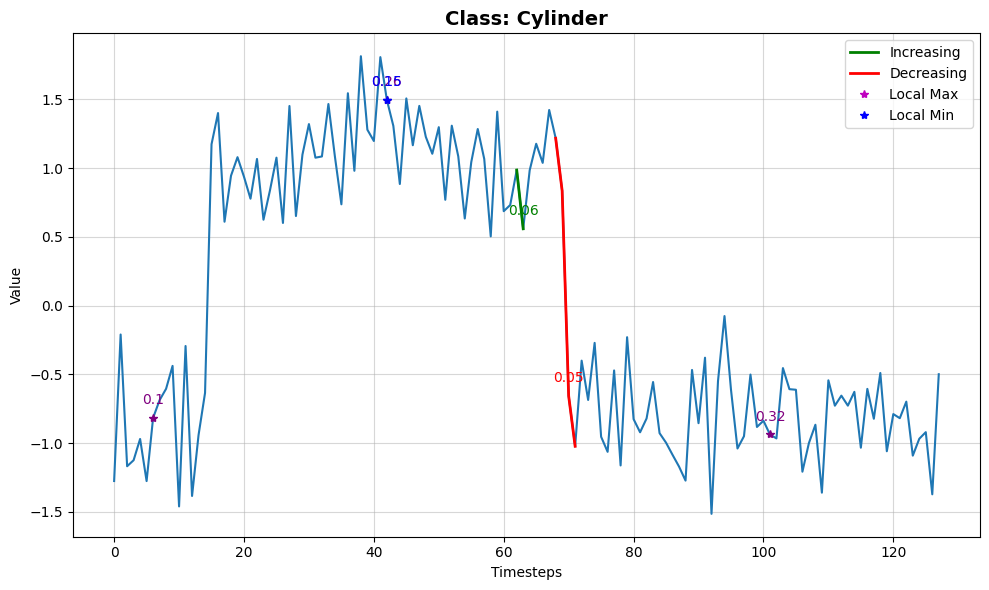

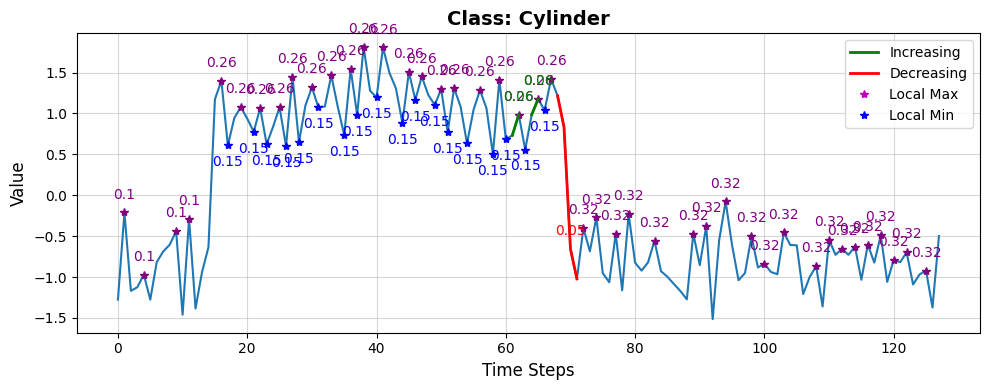

INFO:lomatce.explainer:Starting time series local explanation


Predection probability : tensor([0.6922, 0.0839, 0.2239])
Cylinder:                      0.6922
Bell:                      0.0839
Funnel:                      0.2239


INFO:lomatce.explainer:Perturbed instances shap for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 10738 samples)
Optimal number of clusters for Increasing_ch1: 18
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 17049 samples)
Optimal number of clusters for Decreasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 37228 samples)
Optimal number of clusters for LocalMax_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 36777 samples)
Optimal number of clusters for LocalMin_ch1: 3


INFO:lomatce.explainer:Final data shape: (1001, 59) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 59


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.96
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.96
INFO:lomatce.explainer:Model Type: Ridge


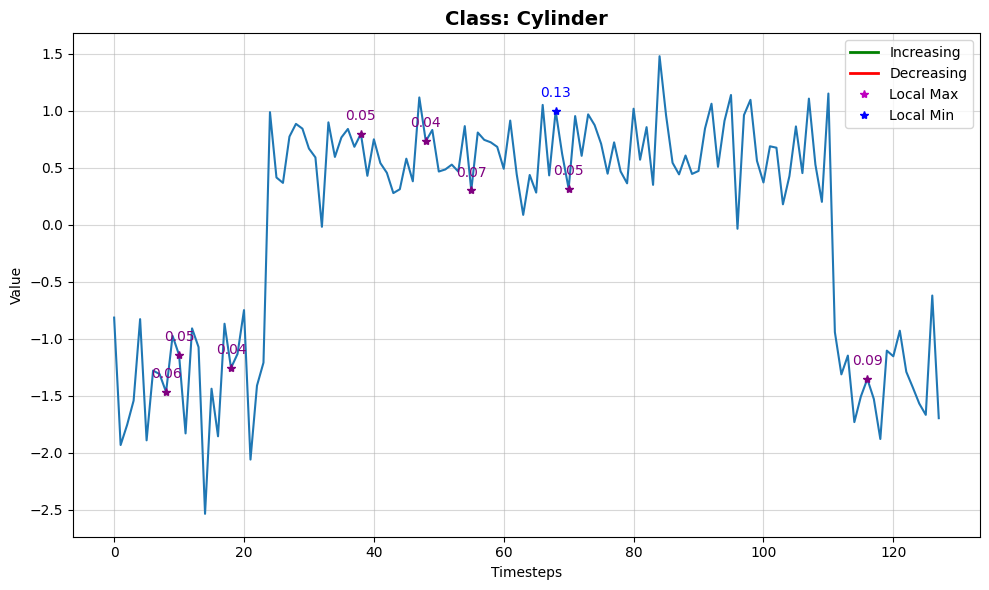

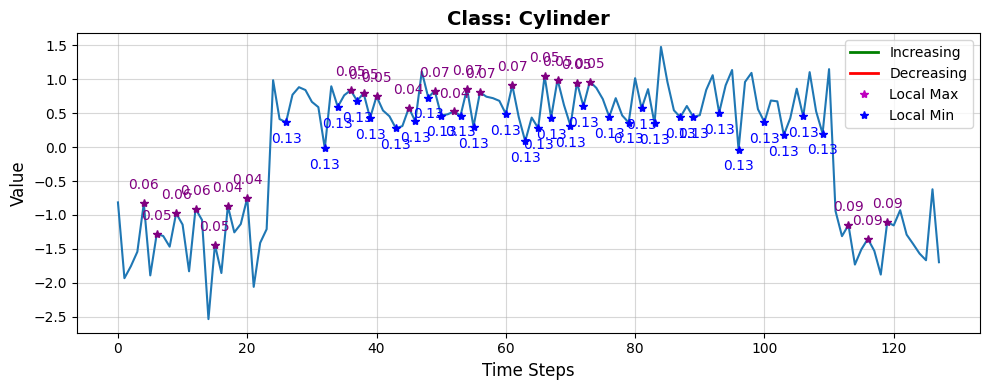

INFO:lomatce.explainer:Starting time series local explanation


Predection probability : tensor([0.9347, 0.0328, 0.0325])
Cylinder:                      0.9347
Bell:                      0.0328
Funnel:                      0.0325


INFO:lomatce.explainer:Perturbed instances shap for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 12335 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 15197 samples)
Optimal number of clusters for Decreasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 38329 samples)
Optimal number of clusters for LocalMax_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 36871 samples)
Optimal number of clusters for LocalMin_ch1: 19


INFO:lomatce.explainer:Final data shape: (1001, 76) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 76


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.99
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.74
INFO:lomatce.explainer:Model Type: Ridge


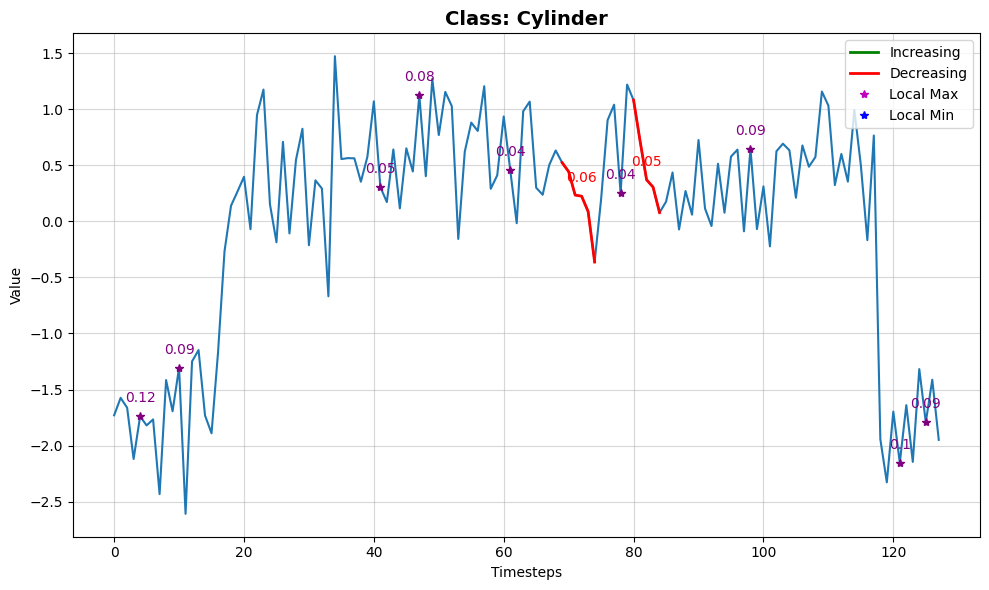

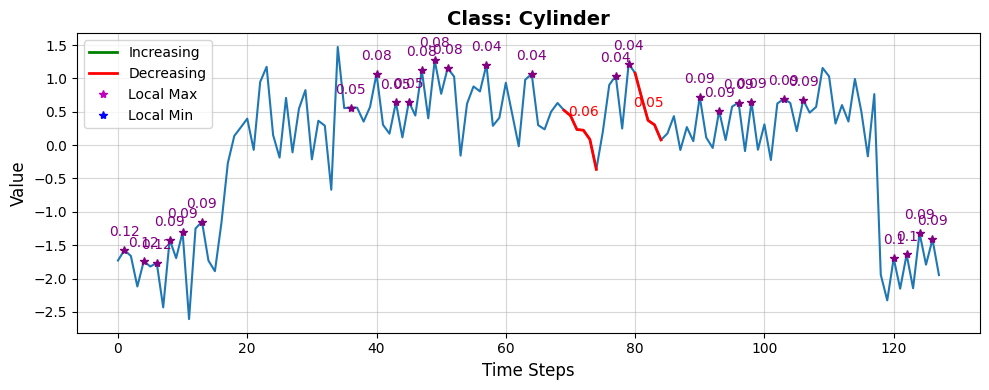

INFO:lomatce.explainer:Starting time series local explanation


Predection probability : tensor([0.7289, 0.1402, 0.1310])
Cylinder:                      0.7289
Bell:                      0.1402
Funnel:                      0.1310


INFO:lomatce.explainer:Perturbed instances shap for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 14257 samples)
Optimal number of clusters for Increasing_ch1: 18
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 17811 samples)
Optimal number of clusters for Decreasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 35201 samples)
Optimal number of clusters for LocalMax_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 35832 samples)
Optimal number of clusters for LocalMin_ch1: 3


INFO:lomatce.explainer:Final data shape: (1001, 59) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 59


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.97
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.93
INFO:lomatce.explainer:Model Type: Ridge


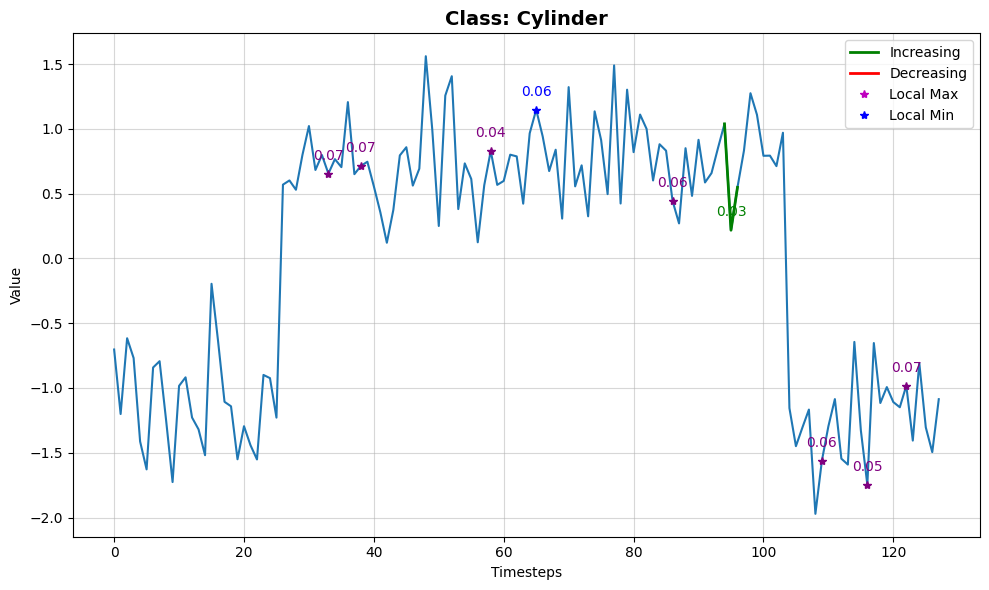

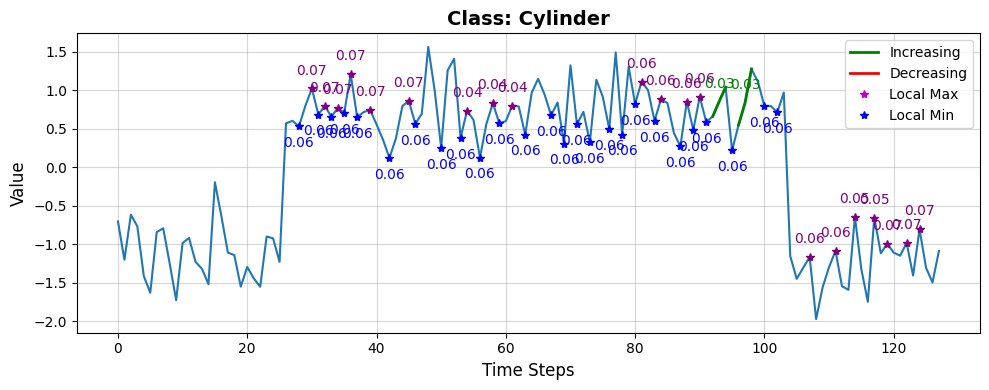

INFO:lomatce.explainer:Starting time series local explanation


Predection probability : tensor([0.9073, 0.0529, 0.0398])
Cylinder:                      0.9073
Bell:                      0.0529
Funnel:                      0.0398


INFO:lomatce.explainer:Perturbed instances shap for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 14332 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 15727 samples)
Optimal number of clusters for Decreasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 37107 samples)
Optimal number of clusters for LocalMax_ch1: 3
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 36797 samples)
Optimal number of clusters for LocalMin_ch1: 3


INFO:lomatce.explainer:Final data shape: (1001, 44) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 44


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.97
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.91
INFO:lomatce.explainer:Model Type: Ridge


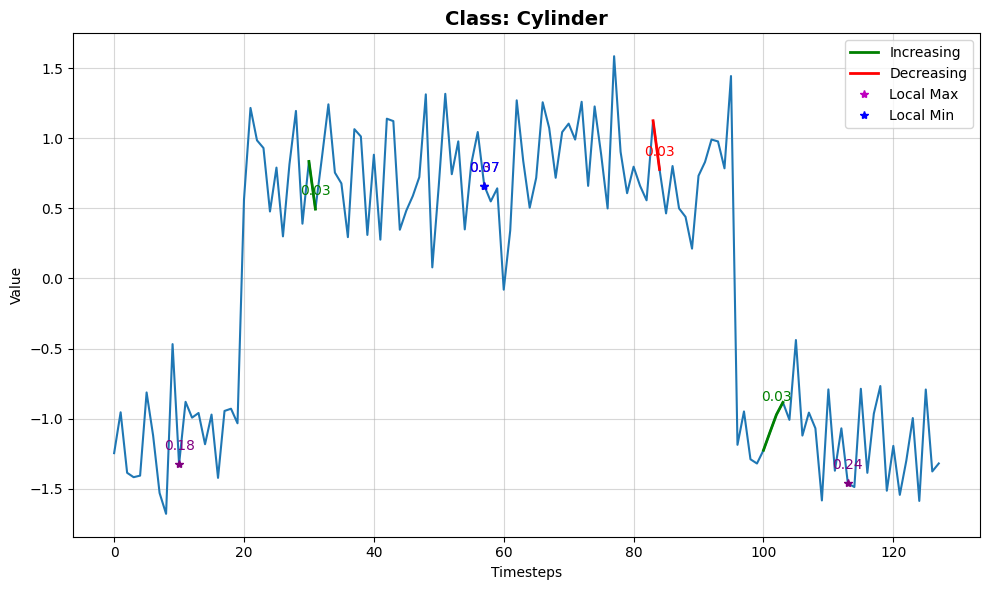

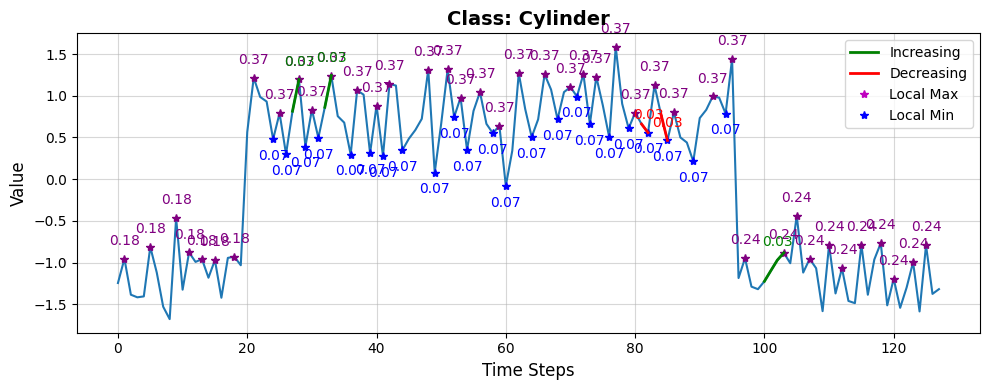

INFO:lomatce.explainer:Starting time series local explanation


Predection probability : tensor([0.8858, 0.0464, 0.0678])
Cylinder:                      0.8858
Bell:                      0.0464
Funnel:                      0.0678


INFO:lomatce.explainer:Perturbed instances shap for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 13451 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 19585 samples)
Optimal number of clusters for Decreasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 34523 samples)
Optimal number of clusters for LocalMax_ch1: 16
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 33027 samples)
Optimal number of clusters for LocalMin_ch1: 19


INFO:lomatce.explainer:Final data shape: (1001, 73) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 73


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.97
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.93
INFO:lomatce.explainer:Model Type: Ridge


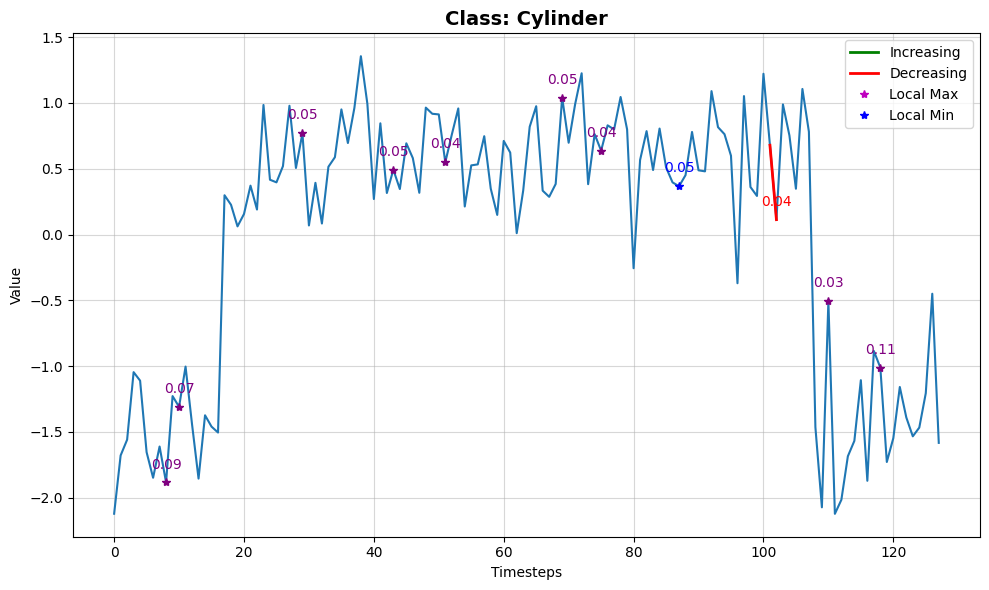

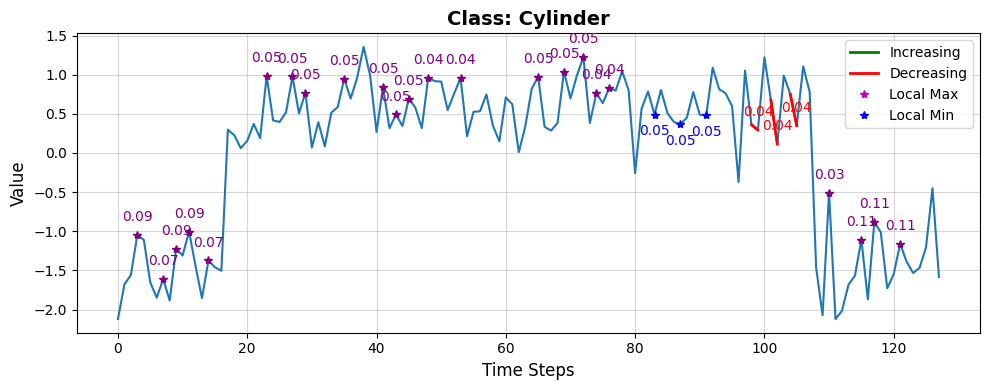

INFO:lomatce.explainer:Starting time series local explanation


Predection probability : tensor([0.8998, 0.0532, 0.0470])
Cylinder:                      0.8998
Bell:                      0.0532
Funnel:                      0.0470


INFO:lomatce.explainer:Perturbed instances shap for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 15828 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 16155 samples)
Optimal number of clusters for Decreasing_ch1: 17
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 34439 samples)
Optimal number of clusters for LocalMax_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 33949 samples)
Optimal number of clusters for LocalMin_ch1: 19


INFO:lomatce.explainer:Final data shape: (1001, 74) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 74


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.98
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.87
INFO:lomatce.explainer:Model Type: Ridge


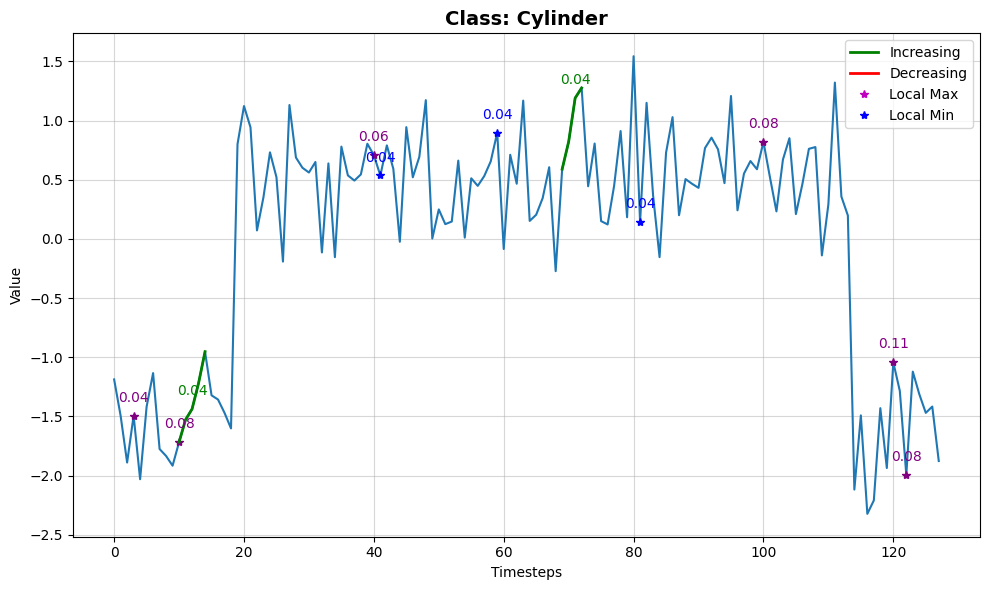

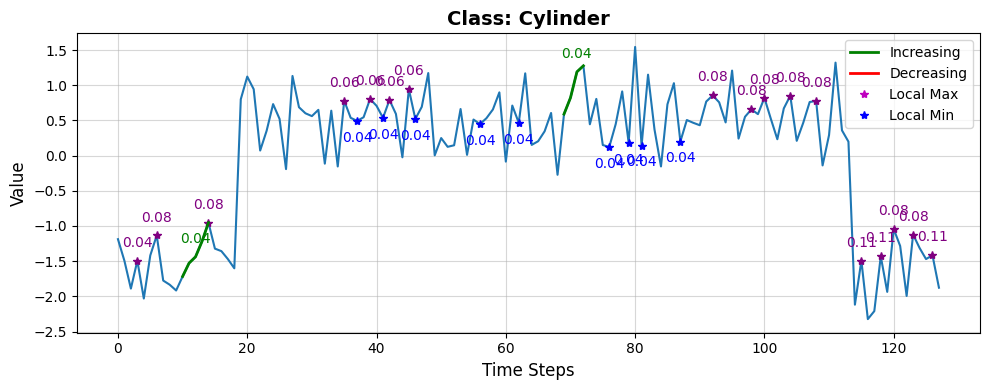

INFO:lomatce.explainer:Starting time series local explanation


Predection probability : tensor([0.8462, 0.0721, 0.0817])
Cylinder:                      0.8462
Bell:                      0.0721
Funnel:                      0.0817


INFO:lomatce.explainer:Perturbed instances shap for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 16055 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 17588 samples)
Optimal number of clusters for Decreasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 34581 samples)
Optimal number of clusters for LocalMax_ch1: 3
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 35310 samples)
Optimal number of clusters for LocalMin_ch1: 3


INFO:lomatce.explainer:Final data shape: (1001, 44) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 44


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.96
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.91
INFO:lomatce.explainer:Model Type: Ridge


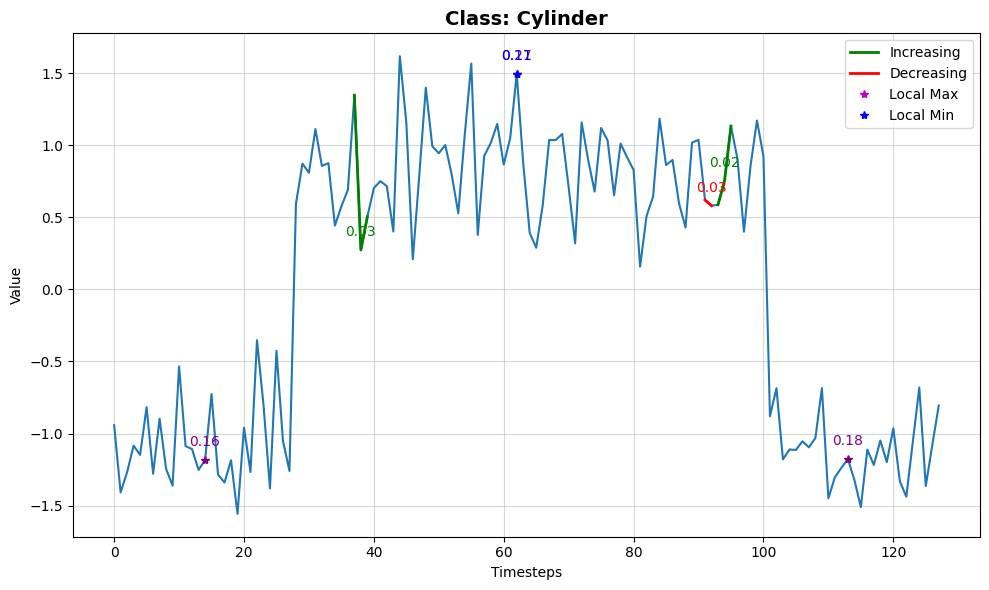

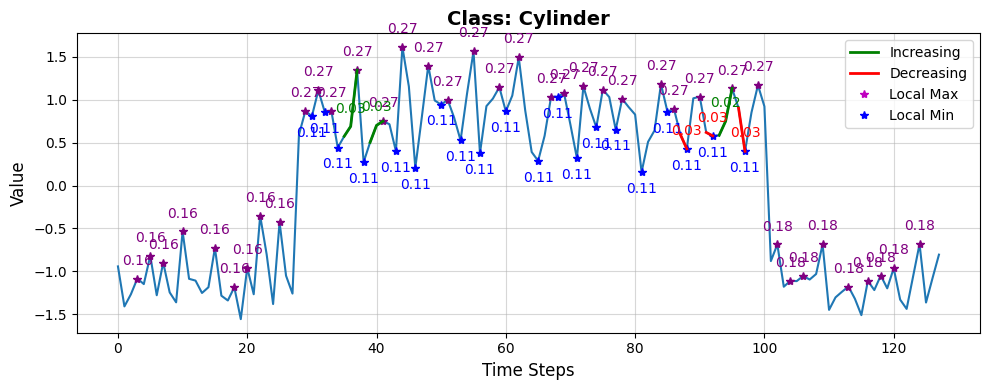

INFO:lomatce.explainer:Starting time series local explanation


Predection probability : tensor([0.8963, 0.0561, 0.0476])
Cylinder:                      0.8963
Bell:                      0.0561
Funnel:                      0.0476


INFO:lomatce.explainer:Perturbed instances shap for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 11705 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 14267 samples)
Optimal number of clusters for Decreasing_ch1: 16
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 36179 samples)
Optimal number of clusters for LocalMax_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 36718 samples)
Optimal number of clusters for LocalMin_ch1: 19


INFO:lomatce.explainer:Final data shape: (1001, 73) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 73


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.99
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.65
INFO:lomatce.explainer:Model Type: Ridge


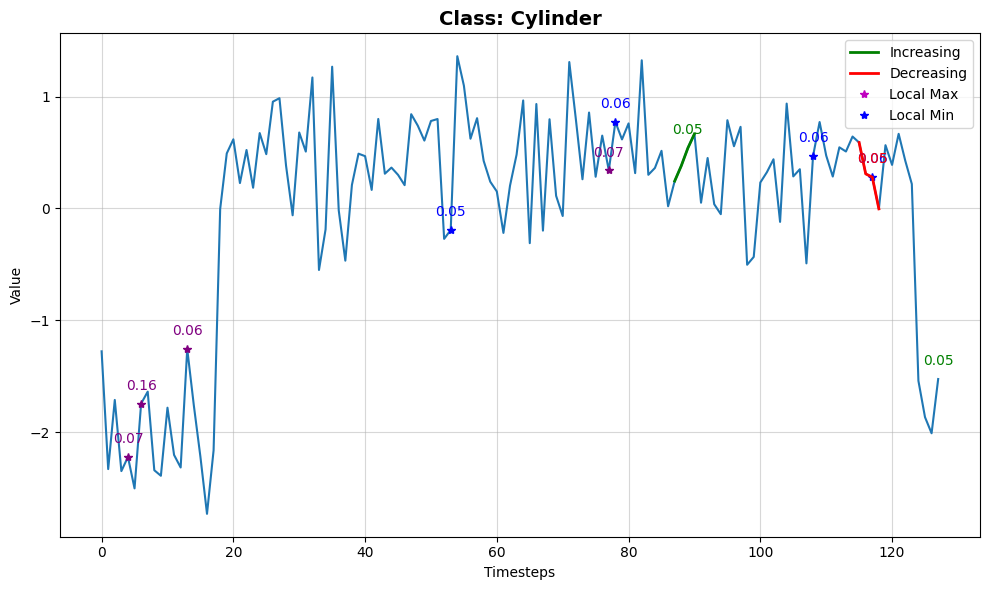

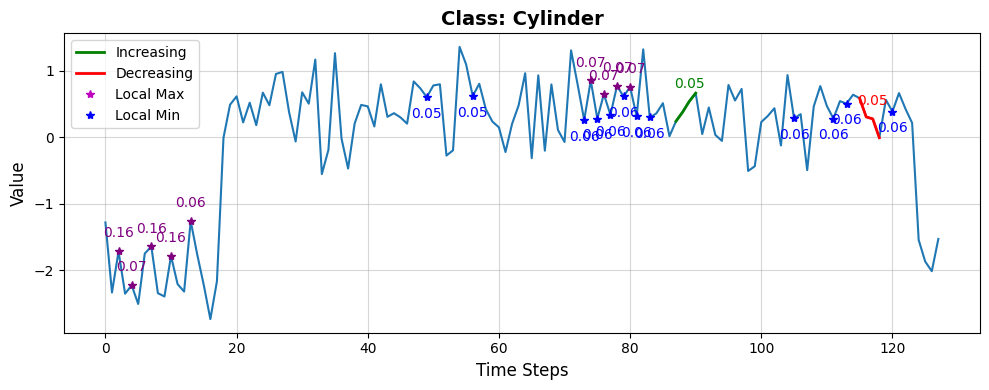

INFO:lomatce.explainer:Starting time series local explanation


Predection probability : tensor([0.6457, 0.1589, 0.1954])
Cylinder:                      0.6457
Bell:                      0.1589
Funnel:                      0.1954


INFO:lomatce.explainer:Perturbed instances shap for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 17546 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 12694 samples)
Optimal number of clusters for Decreasing_ch1: 18
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 34383 samples)
Optimal number of clusters for LocalMax_ch1: 3
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 33051 samples)
Optimal number of clusters for LocalMin_ch1: 3


INFO:lomatce.explainer:Final data shape: (1001, 43) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 43


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.95
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.96
INFO:lomatce.explainer:Model Type: Ridge


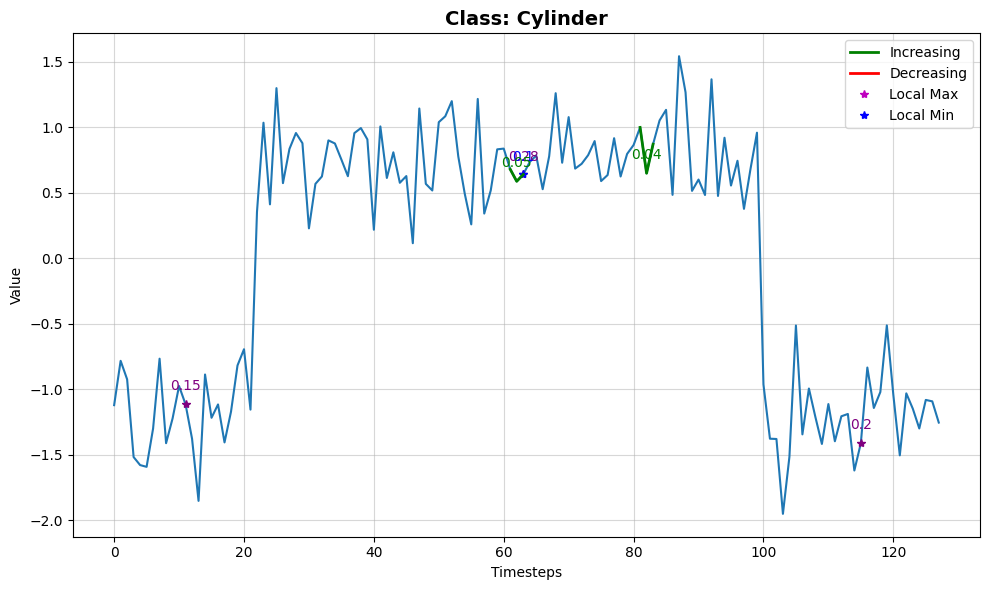

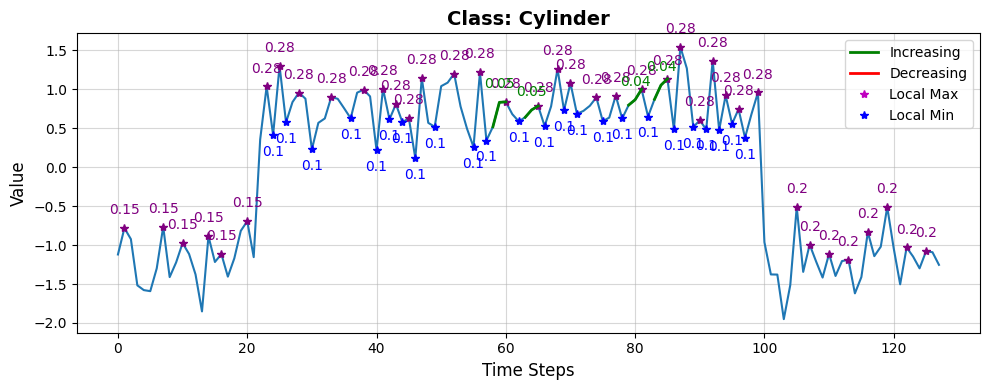

INFO:lomatce.explainer:Starting time series local explanation


Predection probability : tensor([0.9303, 0.0268, 0.0429])
Cylinder:                      0.9303
Bell:                      0.0268
Funnel:                      0.0429


INFO:lomatce.explainer:Perturbed instances shap for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 11803 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 15211 samples)
Optimal number of clusters for Decreasing_ch1: 18
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 34448 samples)
Optimal number of clusters for LocalMax_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 32942 samples)
Optimal number of clusters for LocalMin_ch1: 17


INFO:lomatce.explainer:Final data shape: (1001, 73) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 73


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.94
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.98
INFO:lomatce.explainer:Model Type: Ridge


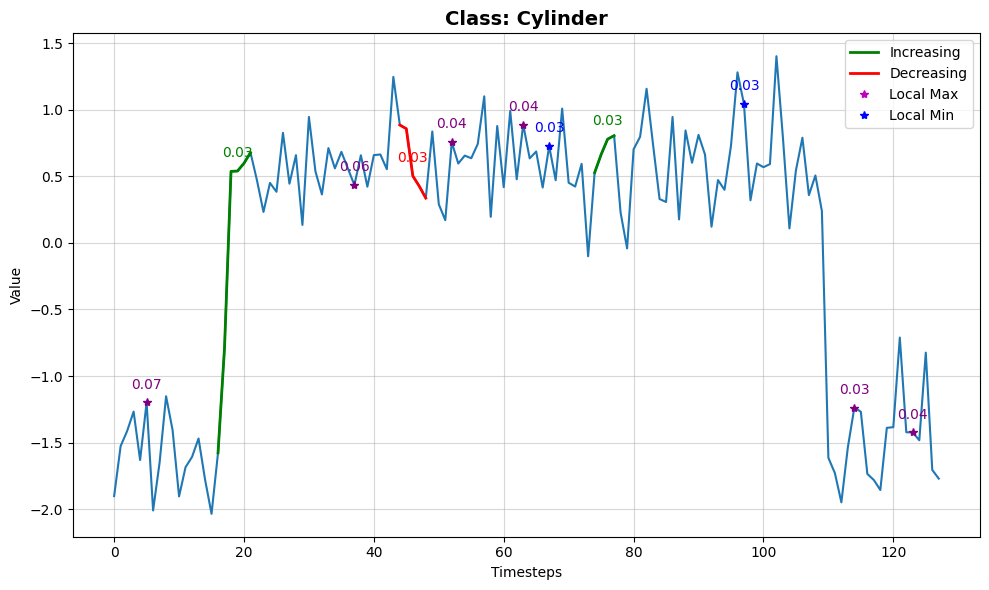

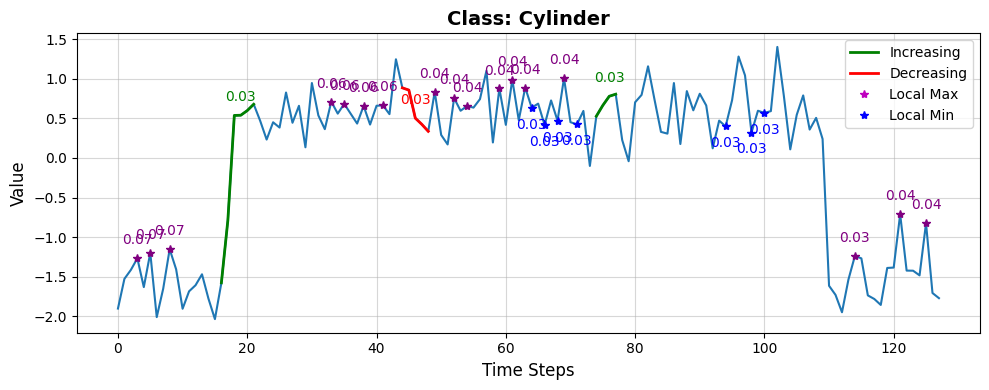

INFO:lomatce.explainer:Starting time series local explanation


Predection probability : tensor([0.9505, 0.0205, 0.0290])
Cylinder:                      0.9505
Bell:                      0.0205
Funnel:                      0.0290


INFO:lomatce.explainer:Perturbed instances shap for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 12606 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 16962 samples)
Optimal number of clusters for Decreasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 33430 samples)
Optimal number of clusters for LocalMax_ch1: 3
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 33473 samples)
Optimal number of clusters for LocalMin_ch1: 3


INFO:lomatce.explainer:Final data shape: (1001, 44) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 44


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.96
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.68
INFO:lomatce.explainer:Model Type: Ridge


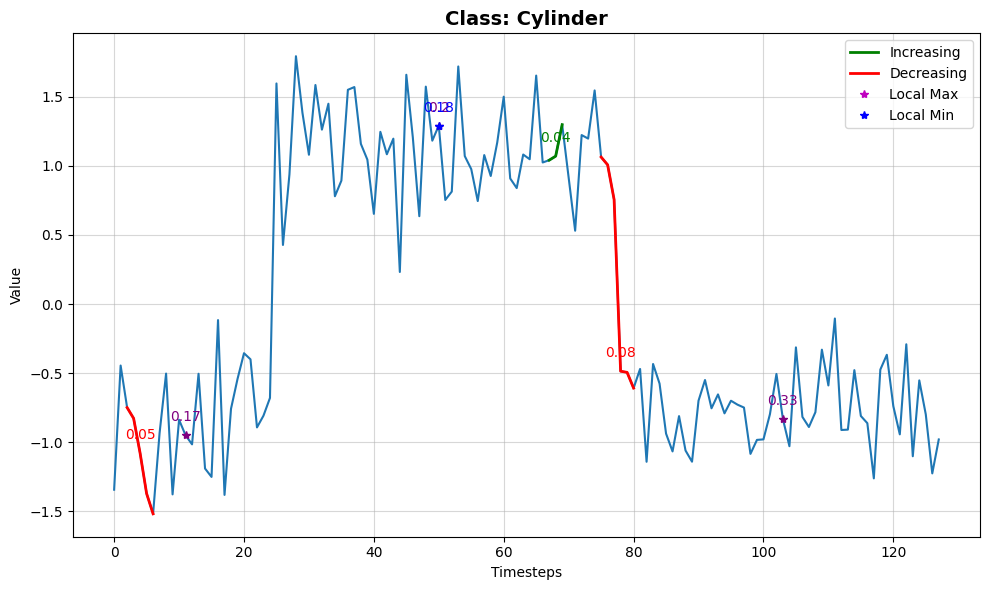

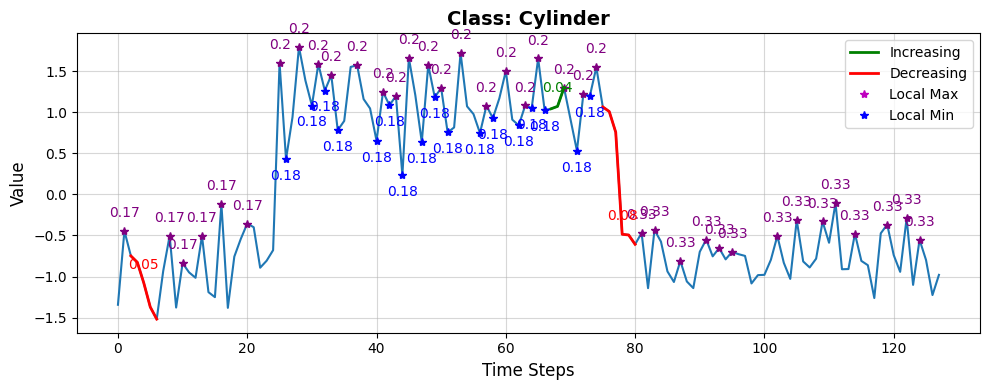

INFO:lomatce.explainer:Starting time series local explanation


Predection probability : tensor([0.6640, 0.0959, 0.2401])
Cylinder:                      0.6640
Bell:                      0.0959
Funnel:                      0.2401


INFO:lomatce.explainer:Perturbed instances shap for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 15323 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 16783 samples)
Optimal number of clusters for Decreasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 32984 samples)
Optimal number of clusters for LocalMax_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 32563 samples)
Optimal number of clusters for LocalMin_ch1: 19


INFO:lomatce.explainer:Final data shape: (1001, 76) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 76


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.99
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.59
INFO:lomatce.explainer:Model Type: Ridge


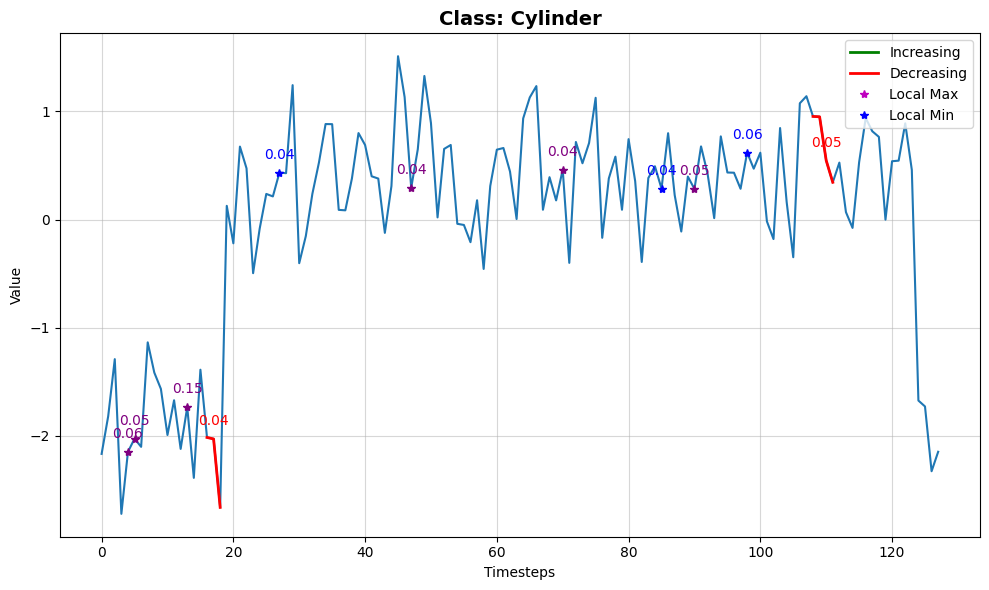

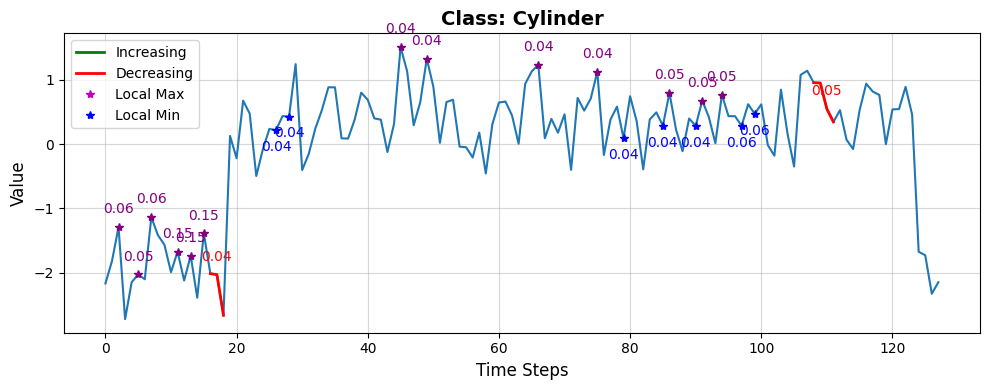

INFO:lomatce.explainer:Starting time series local explanation


Predection probability : tensor([0.5948, 0.2203, 0.1849])
Cylinder:                      0.5948
Bell:                      0.2203
Funnel:                      0.1849


INFO:lomatce.explainer:Perturbed instances shap for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 16119 samples)
Optimal number of clusters for Increasing_ch1: 18
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 14230 samples)
Optimal number of clusters for Decreasing_ch1: 18
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 37656 samples)
Optimal number of clusters for LocalMax_ch1: 3
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 37858 samples)
Optimal number of clusters for LocalMin_ch1: 3


INFO:lomatce.explainer:Final data shape: (1001, 42) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 42


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.94
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.42
INFO:lomatce.explainer:Model Type: Ridge


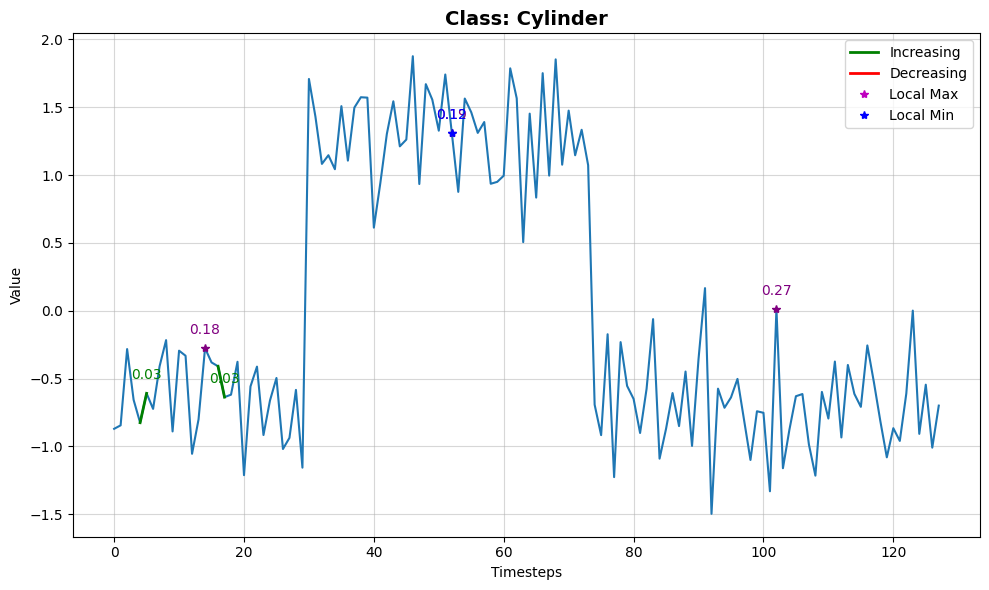

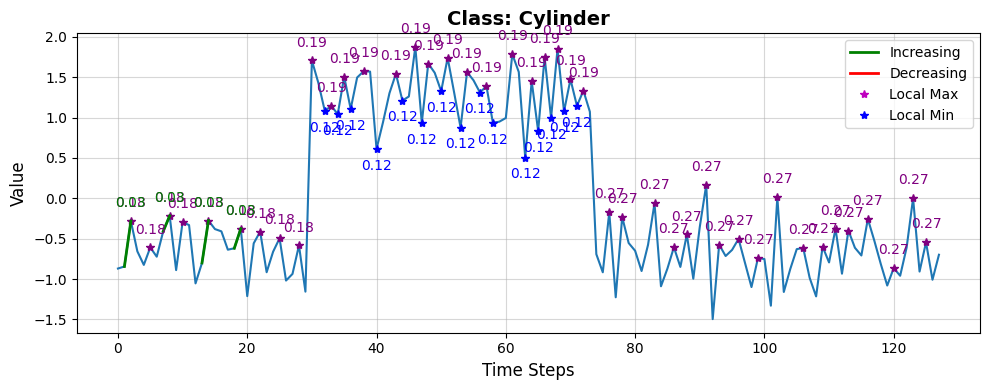

INFO:lomatce.explainer:Starting time series local explanation


Predection probability : tensor([0.4227, 0.2557, 0.3216])
Cylinder:                      0.4227
Bell:                      0.2557
Funnel:                      0.3216


INFO:lomatce.explainer:Perturbed instances shap for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 22089 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 13395 samples)
Optimal number of clusters for Decreasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 35667 samples)
Optimal number of clusters for LocalMax_ch1: 2
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 35196 samples)
Optimal number of clusters for LocalMin_ch1: 2


INFO:lomatce.explainer:Final data shape: (1001, 42) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 42


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.96
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.67
INFO:lomatce.explainer:Model Type: Ridge


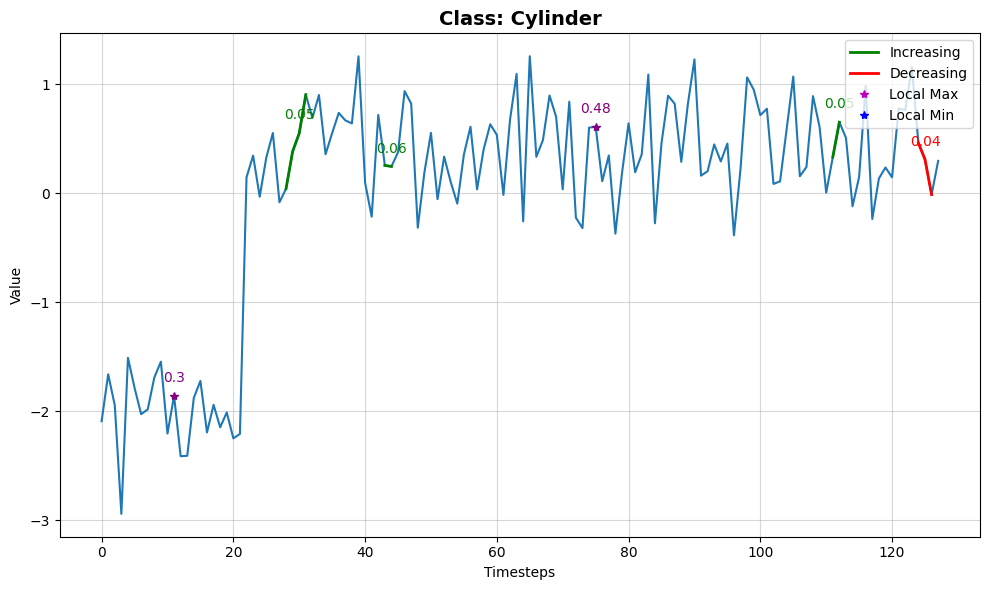

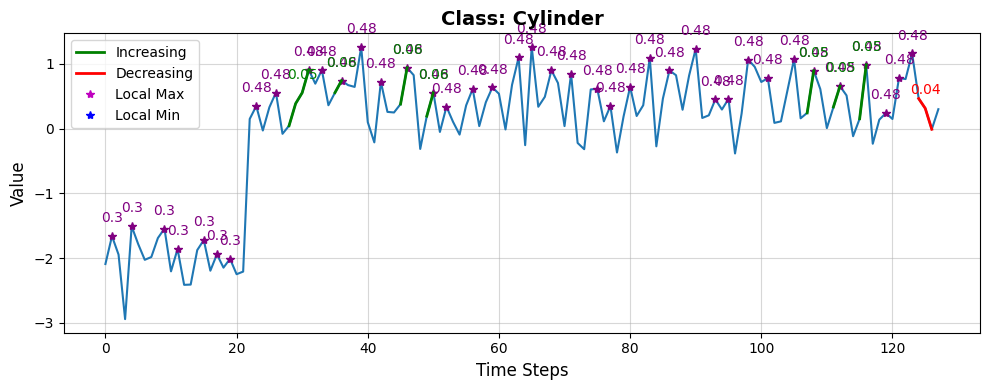

INFO:lomatce.explainer:Starting time series local explanation


Predection probability : tensor([0.6685, 0.1580, 0.1735])
Cylinder:                      0.6685
Bell:                      0.1580
Funnel:                      0.1735

📈 Global Faithfulness (Avg Local Fidelity): 0.9655

=== Running SP-LOMATCE for class Bell ===


INFO:lomatce.explainer:Perturbed instances shap for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 14825 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 15401 samples)
Optimal number of clusters for Decreasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 36221 samples)
Optimal number of clusters for LocalMax_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 36404 samples)
Optimal number of clusters for LocalMin_ch1: 19


INFO:lomatce.explainer:Final data shape: (1001, 76) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 76


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.99
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.76
INFO:lomatce.explainer:Model Type: Ridge


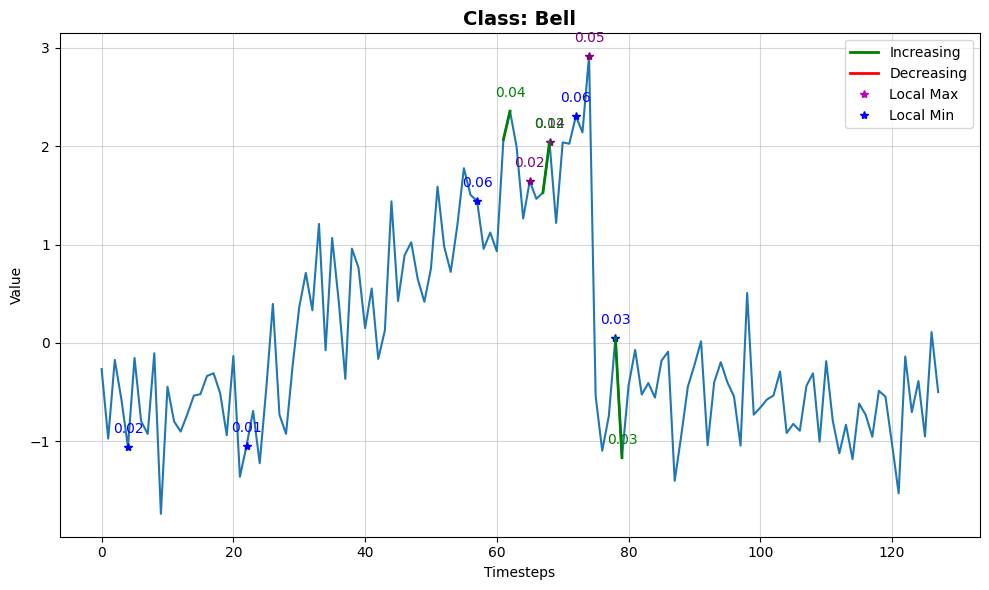

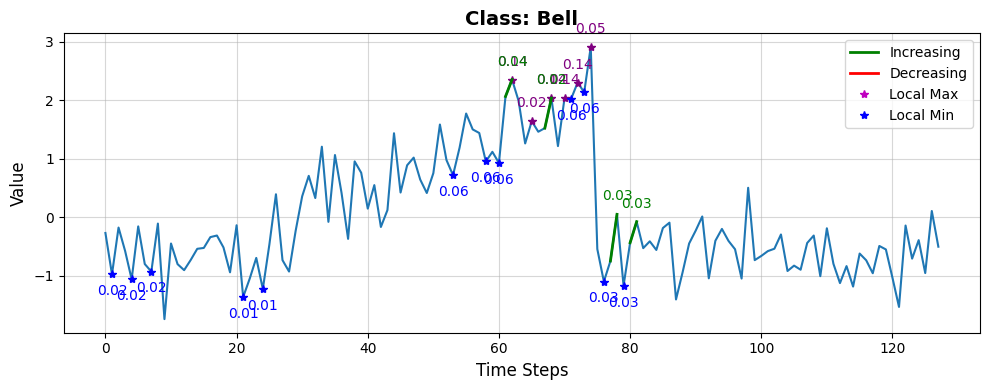

INFO:lomatce.explainer:Starting time series local explanation


Predection probability : tensor([0.1131, 0.7659, 0.1210])
Cylinder:                      0.1131
Bell:                      0.7659
Funnel:                      0.1210


INFO:lomatce.explainer:Perturbed instances shap for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 16327 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 9832 samples)
Optimal number of clusters for Decreasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 39581 samples)
Optimal number of clusters for LocalMax_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 40578 samples)
Optimal number of clusters for LocalMin_ch1: 19


INFO:lomatce.explainer:Final data shape: (1001, 76) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 76


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.97
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.72
INFO:lomatce.explainer:Model Type: Ridge


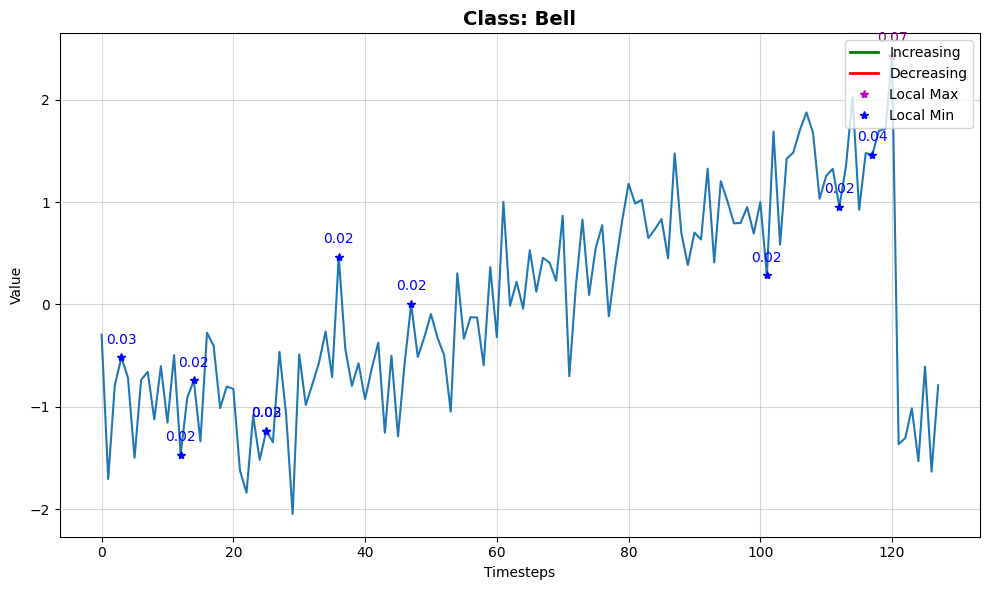

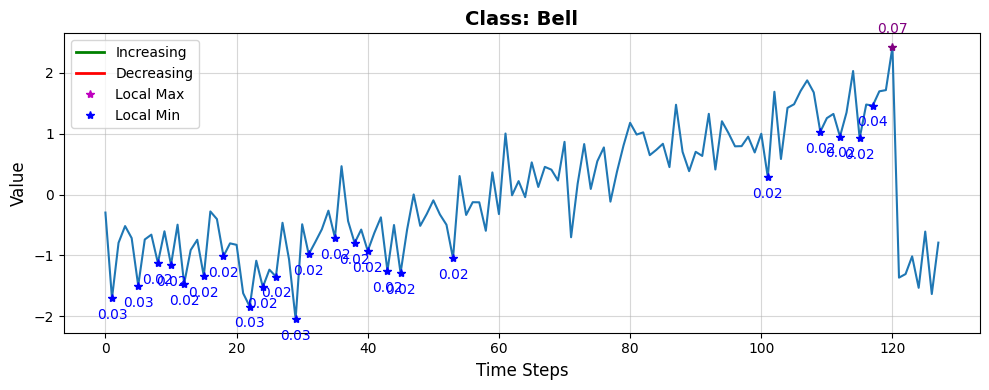

INFO:lomatce.explainer:Starting time series local explanation


Predection probability : tensor([0.1829, 0.7173, 0.0998])
Cylinder:                      0.1829
Bell:                      0.7173
Funnel:                      0.0998


INFO:lomatce.explainer:Perturbed instances shap for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 15033 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 15230 samples)
Optimal number of clusters for Decreasing_ch1: 18
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 34450 samples)
Optimal number of clusters for LocalMax_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 35477 samples)
Optimal number of clusters for LocalMin_ch1: 3


INFO:lomatce.explainer:Final data shape: (1001, 59) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 59


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.97
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.77
INFO:lomatce.explainer:Model Type: Ridge


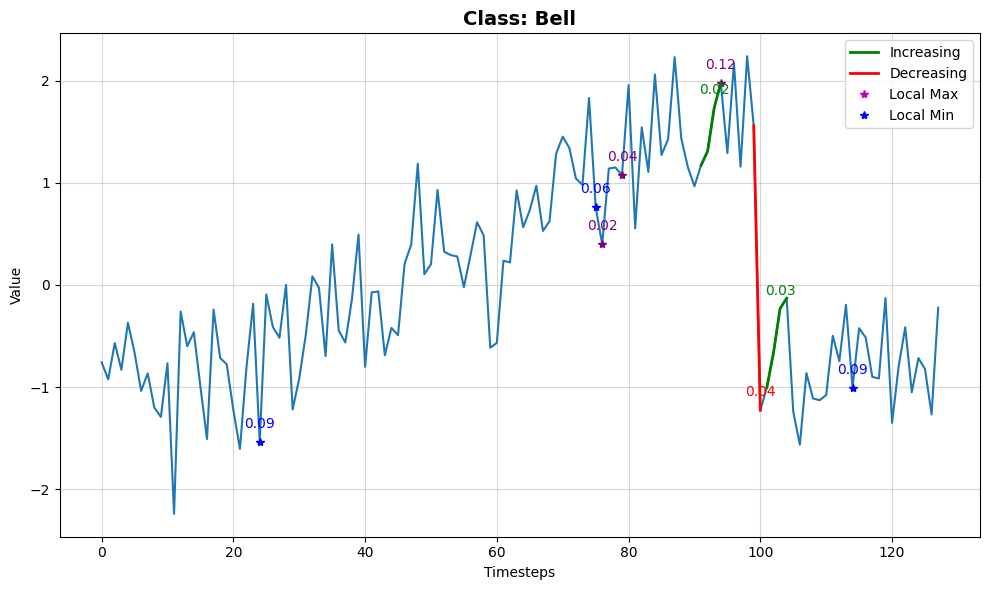

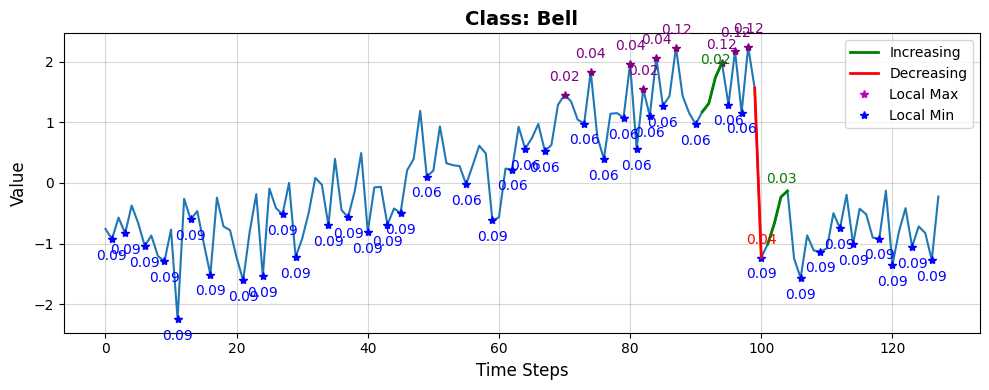

INFO:lomatce.explainer:Starting time series local explanation


Predection probability : tensor([0.1181, 0.7755, 0.1064])
Cylinder:                      0.1181
Bell:                      0.7755
Funnel:                      0.1064


INFO:lomatce.explainer:Perturbed instances shap for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 16725 samples)
Optimal number of clusters for Increasing_ch1: 18
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 17613 samples)
Optimal number of clusters for Decreasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 34351 samples)
Optimal number of clusters for LocalMax_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 34470 samples)
Optimal number of clusters for LocalMin_ch1: 19


INFO:lomatce.explainer:Final data shape: (1001, 75) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 75


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.99
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.79
INFO:lomatce.explainer:Model Type: Ridge


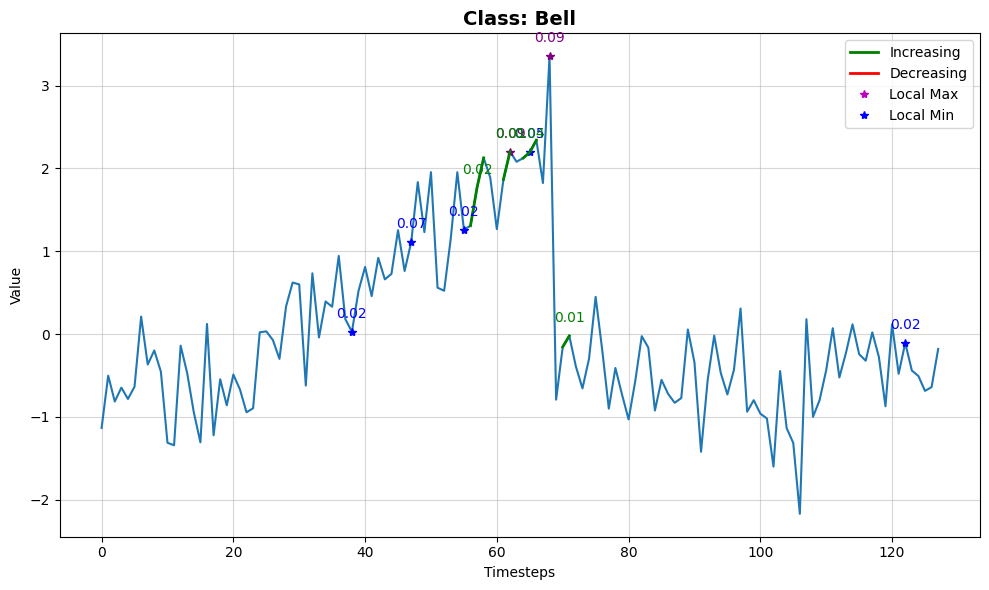

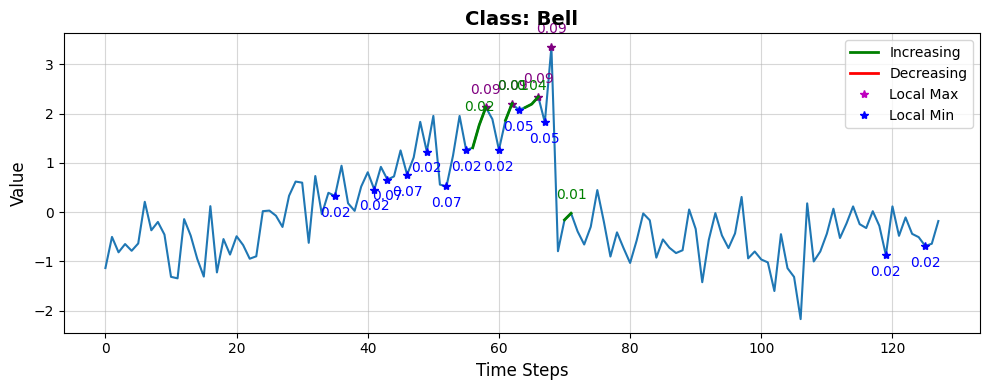

INFO:lomatce.explainer:Starting time series local explanation


Predection probability : tensor([0.0780, 0.7923, 0.1297])
Cylinder:                      0.0780
Bell:                      0.7923
Funnel:                      0.1297


INFO:lomatce.explainer:Perturbed instances shap for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 10685 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 13530 samples)
Optimal number of clusters for Decreasing_ch1: 16
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 37983 samples)
Optimal number of clusters for LocalMax_ch1: 18
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 38003 samples)
Optimal number of clusters for LocalMin_ch1: 19


INFO:lomatce.explainer:Final data shape: (1001, 72) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 72


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.97
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.65
INFO:lomatce.explainer:Model Type: Ridge


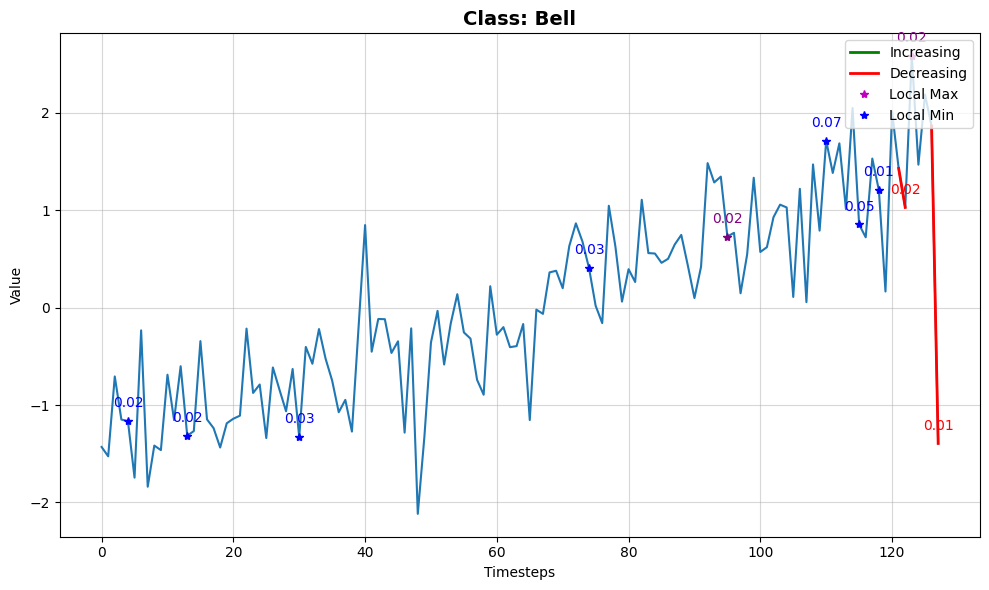

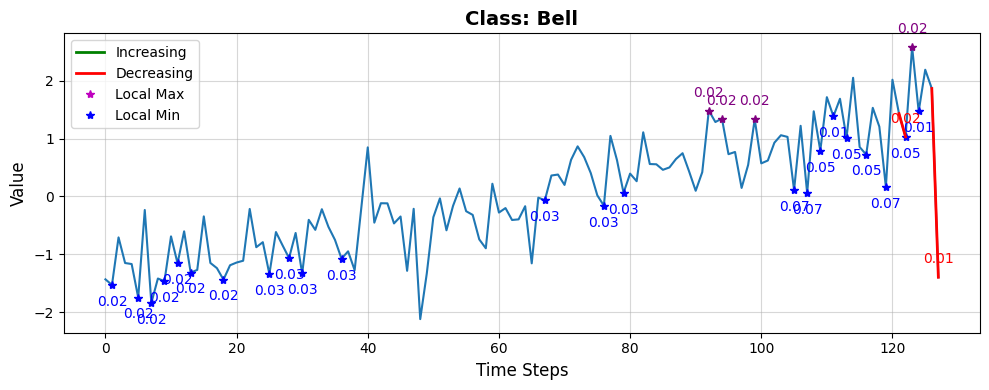

INFO:lomatce.explainer:Starting time series local explanation


Predection probability : tensor([0.2096, 0.6472, 0.1432])
Cylinder:                      0.2096
Bell:                      0.6472
Funnel:                      0.1432


INFO:lomatce.explainer:Perturbed instances shap for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 14492 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 11640 samples)
Optimal number of clusters for Decreasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 40420 samples)
Optimal number of clusters for LocalMax_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 40391 samples)
Optimal number of clusters for LocalMin_ch1: 18


INFO:lomatce.explainer:Final data shape: (1001, 75) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 75


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.95
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.78
INFO:lomatce.explainer:Model Type: Ridge


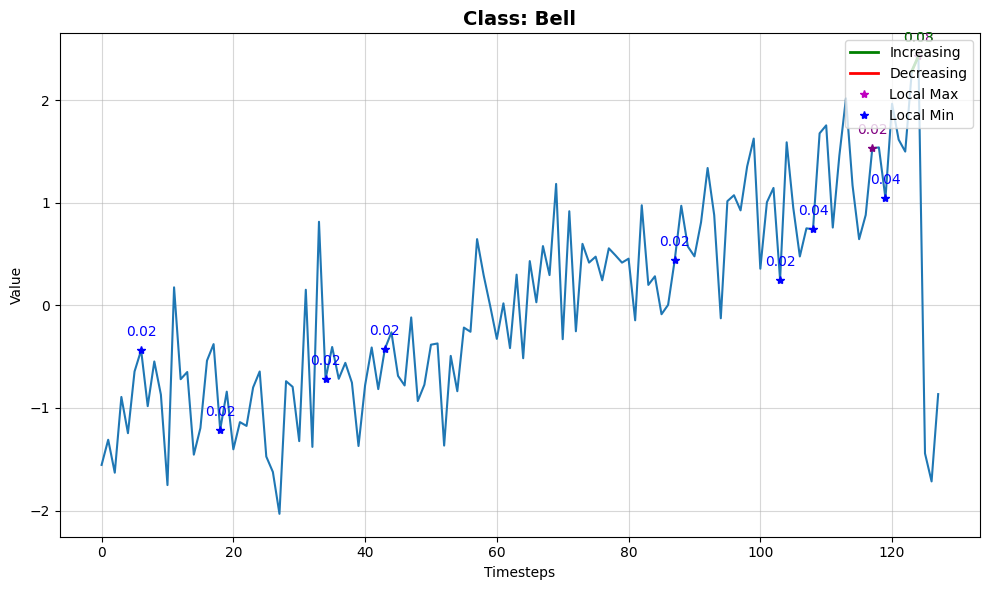

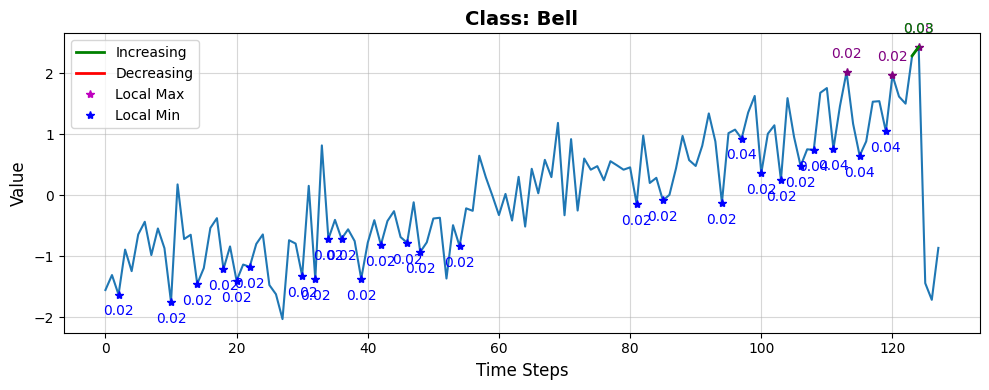

INFO:lomatce.explainer:Starting time series local explanation


Predection probability : tensor([0.1211, 0.7790, 0.0998])
Cylinder:                      0.1211
Bell:                      0.7790
Funnel:                      0.0998


INFO:lomatce.explainer:Perturbed instances shap for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 17782 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 18715 samples)
Optimal number of clusters for Decreasing_ch1: 18
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 29860 samples)
Optimal number of clusters for LocalMax_ch1: 18
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 29910 samples)
Optimal number of clusters for LocalMin_ch1: 18


INFO:lomatce.explainer:Final data shape: (1001, 73) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 73


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.92
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.7
INFO:lomatce.explainer:Model Type: Ridge


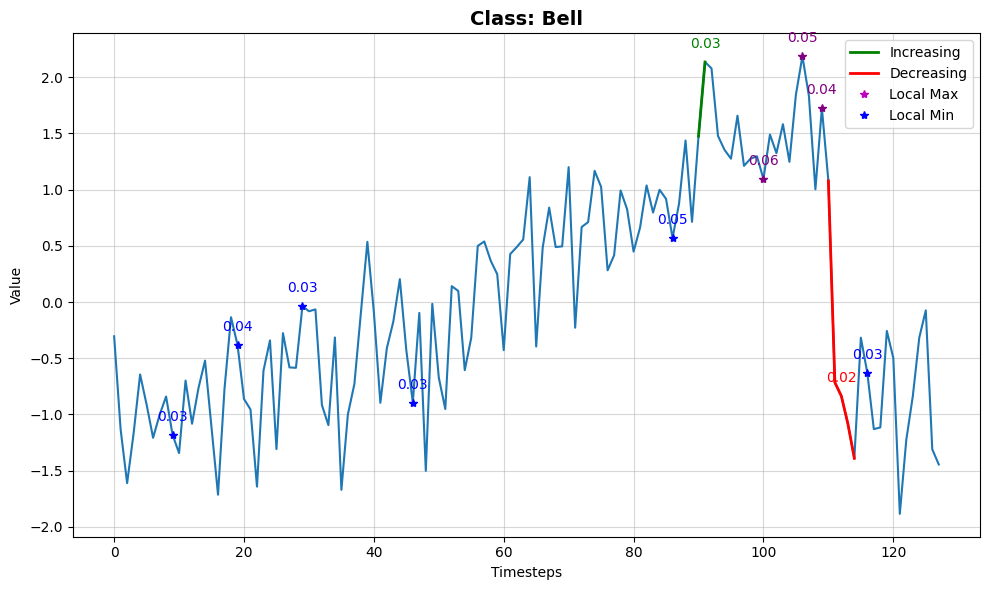

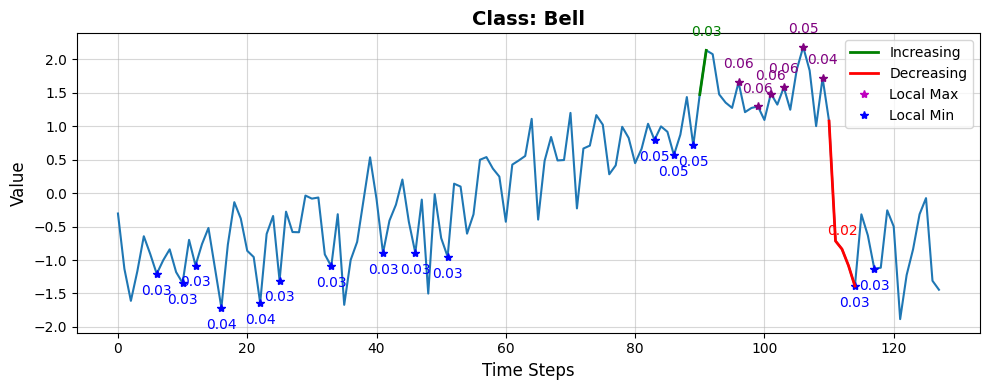

INFO:lomatce.explainer:Starting time series local explanation


Predection probability : tensor([0.1979, 0.7054, 0.0967])
Cylinder:                      0.1979
Bell:                      0.7054
Funnel:                      0.0967


INFO:lomatce.explainer:Perturbed instances shap for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 16862 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 14330 samples)
Optimal number of clusters for Decreasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 35831 samples)
Optimal number of clusters for LocalMax_ch1: 13
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 36960 samples)
Optimal number of clusters for LocalMin_ch1: 4


INFO:lomatce.explainer:Final data shape: (1001, 55) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 55


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.94
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.77
INFO:lomatce.explainer:Model Type: Ridge


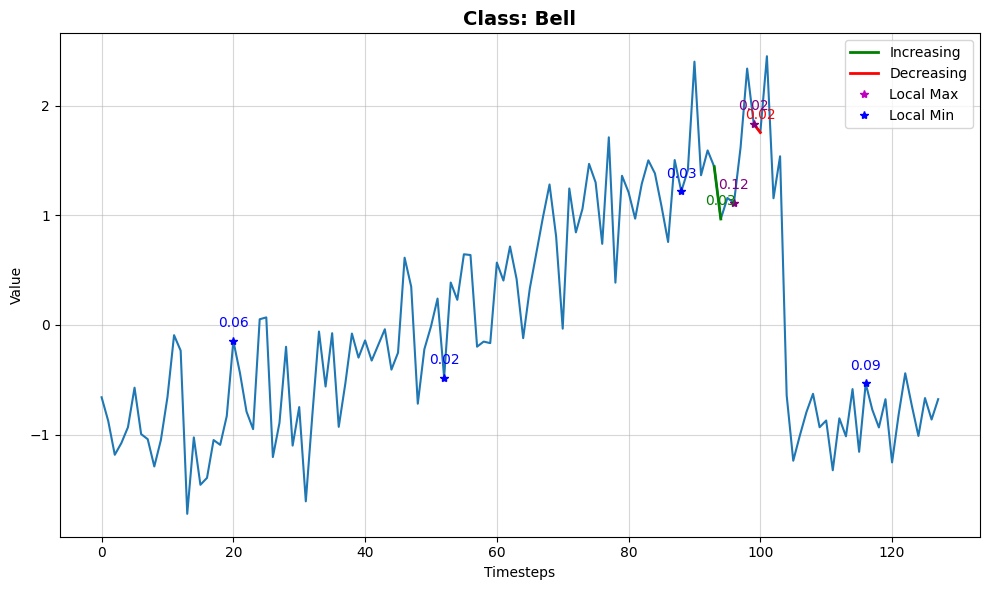

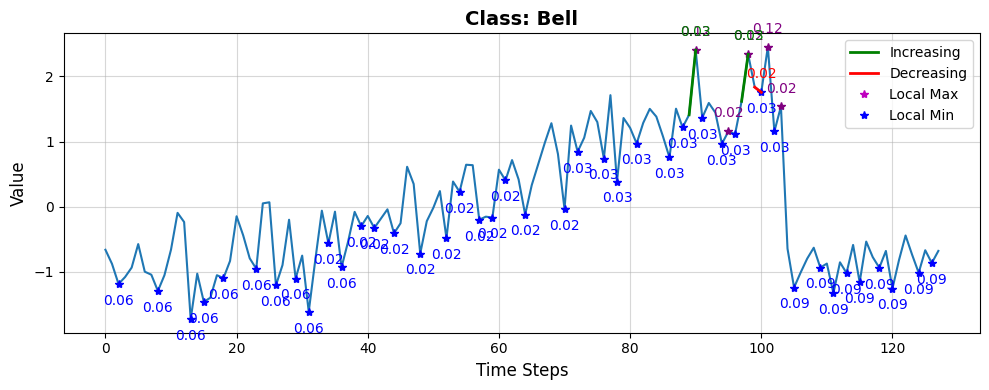

INFO:lomatce.explainer:Starting time series local explanation


Predection probability : tensor([0.1471, 0.7786, 0.0743])
Cylinder:                      0.1471
Bell:                      0.7786
Funnel:                      0.0743


INFO:lomatce.explainer:Perturbed instances shap for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 14236 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 13677 samples)
Optimal number of clusters for Decreasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 36897 samples)
Optimal number of clusters for LocalMax_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 37101 samples)
Optimal number of clusters for LocalMin_ch1: 19


INFO:lomatce.explainer:Final data shape: (1001, 76) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 76


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.96
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.7
INFO:lomatce.explainer:Model Type: Ridge


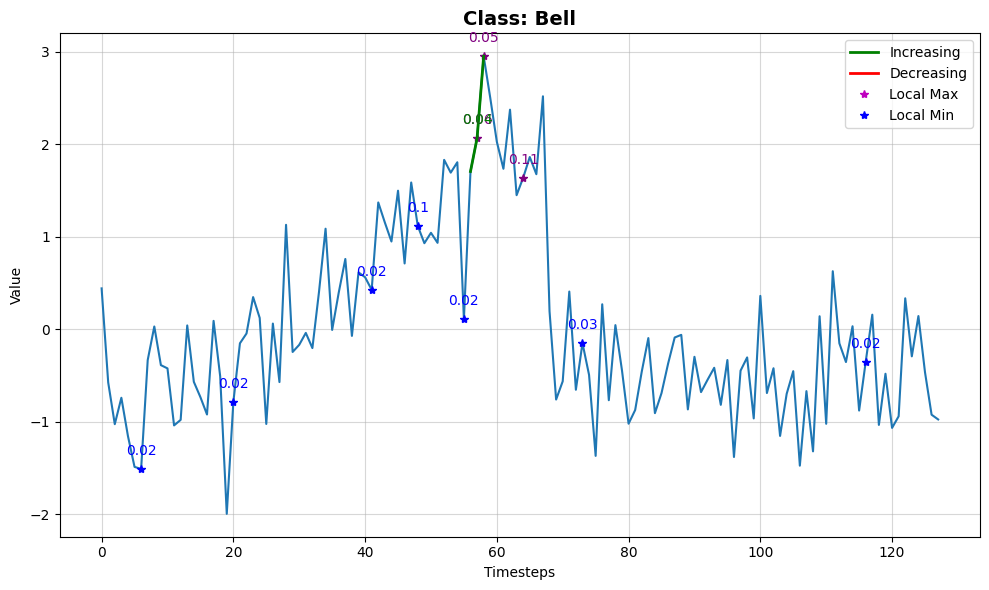

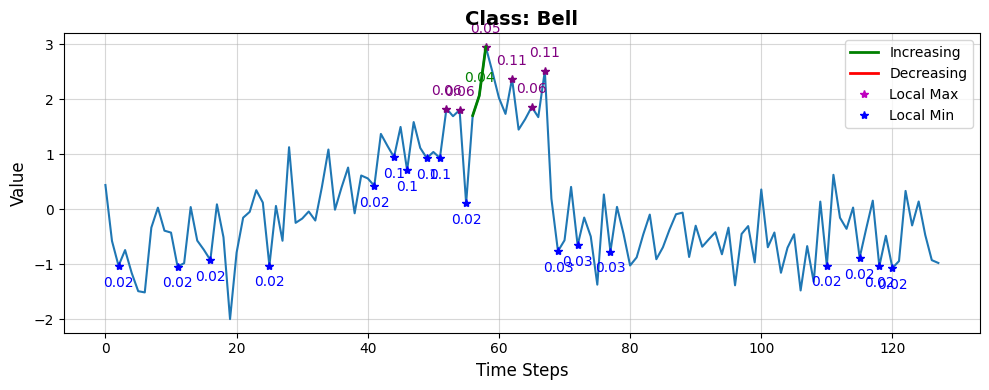

INFO:lomatce.explainer:Starting time series local explanation


Predection probability : tensor([0.0597, 0.7123, 0.2280])
Cylinder:                      0.0597
Bell:                      0.7123
Funnel:                      0.2280


INFO:lomatce.explainer:Perturbed instances shap for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 14940 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 18693 samples)
Optimal number of clusters for Decreasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 36050 samples)
Optimal number of clusters for LocalMax_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 35104 samples)
Optimal number of clusters for LocalMin_ch1: 18


INFO:lomatce.explainer:Final data shape: (1001, 75) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 75


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.98
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.84
INFO:lomatce.explainer:Model Type: Ridge


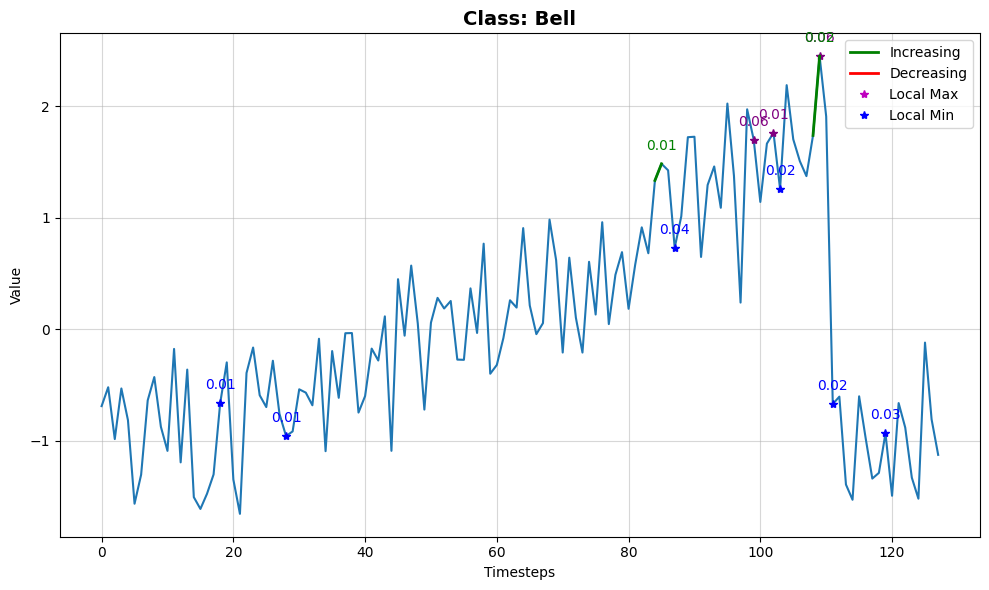

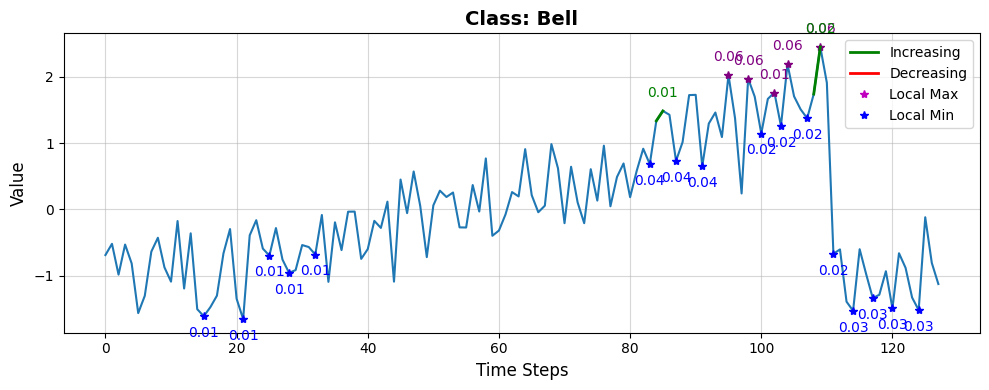

INFO:lomatce.explainer:Starting time series local explanation


Predection probability : tensor([0.0810, 0.8387, 0.0803])
Cylinder:                      0.0810
Bell:                      0.8387
Funnel:                      0.0803


INFO:lomatce.explainer:Perturbed instances shap for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 15155 samples)
Optimal number of clusters for Increasing_ch1: 18
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 16065 samples)
Optimal number of clusters for Decreasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 36993 samples)
Optimal number of clusters for LocalMax_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 37085 samples)
Optimal number of clusters for LocalMin_ch1: 19


INFO:lomatce.explainer:Final data shape: (1001, 75) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 75


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.97
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.84
INFO:lomatce.explainer:Model Type: Ridge


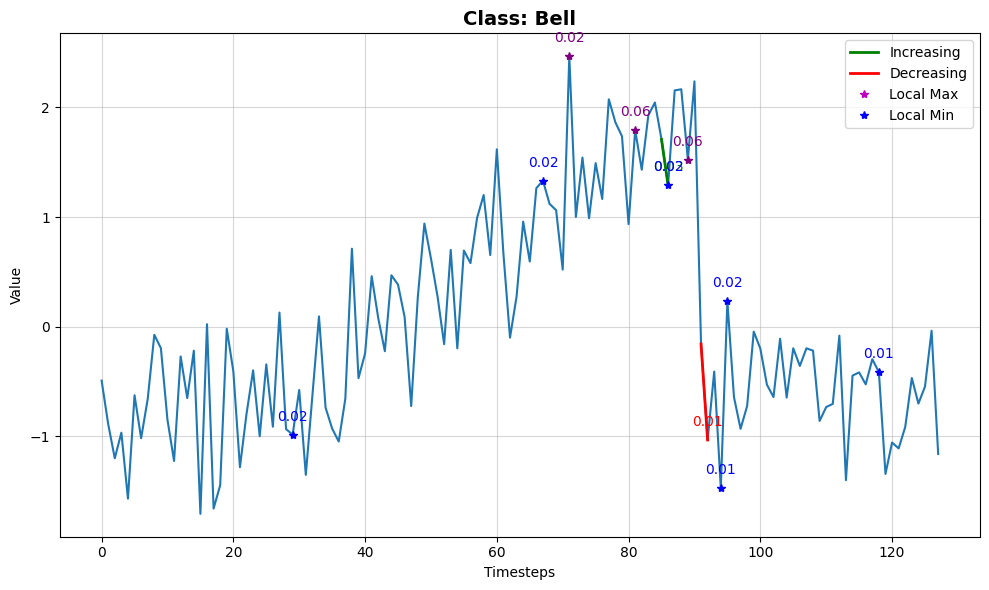

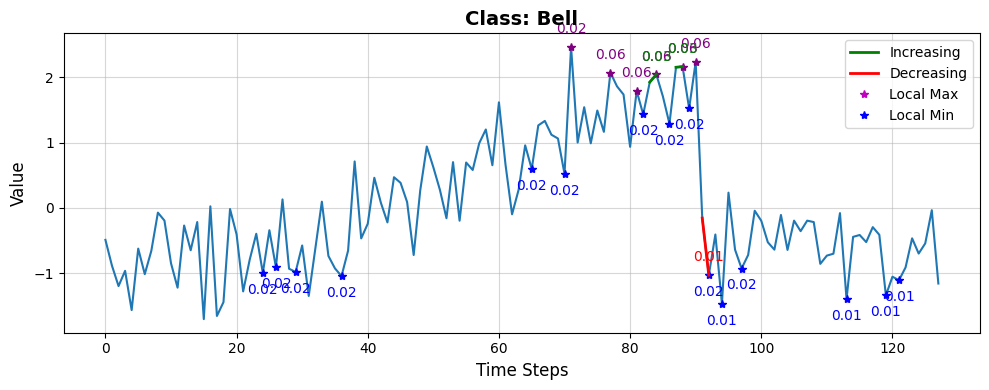

INFO:lomatce.explainer:Starting time series local explanation


Predection probability : tensor([0.0724, 0.8398, 0.0878])
Cylinder:                      0.0724
Bell:                      0.8398
Funnel:                      0.0878


INFO:lomatce.explainer:Perturbed instances shap for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 16248 samples)
Optimal number of clusters for Increasing_ch1: 18
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 14271 samples)
Optimal number of clusters for Decreasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 34770 samples)
Optimal number of clusters for LocalMax_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 35731 samples)
Optimal number of clusters for LocalMin_ch1: 19


INFO:lomatce.explainer:Final data shape: (1001, 75) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 75


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.94
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.71
INFO:lomatce.explainer:Model Type: Ridge


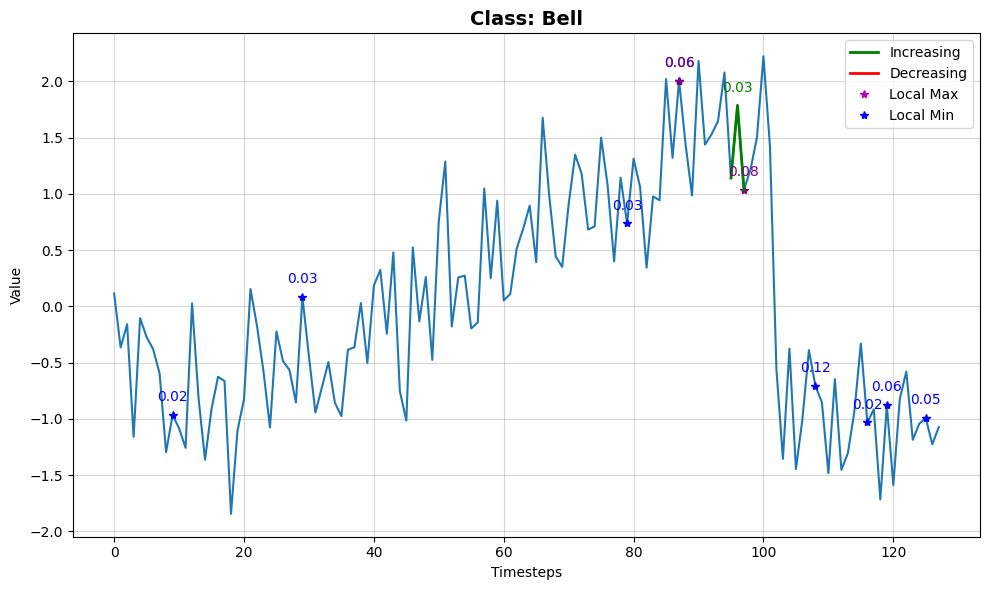

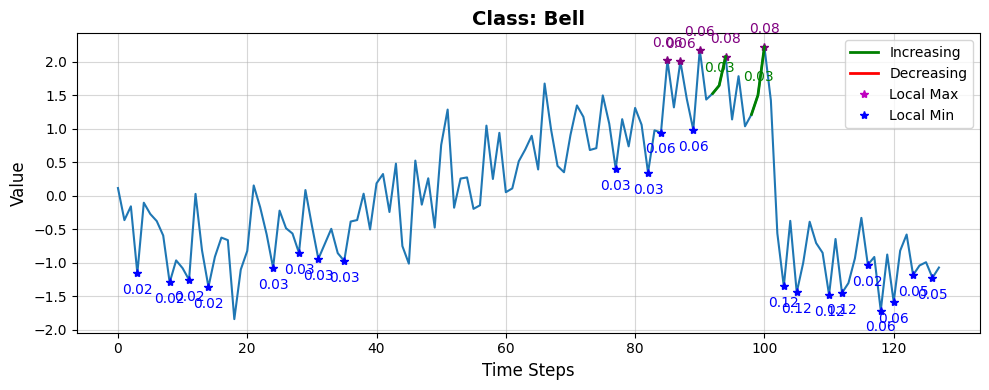

INFO:lomatce.explainer:Starting time series local explanation


Predection probability : tensor([0.1653, 0.7171, 0.1176])
Cylinder:                      0.1653
Bell:                      0.7171
Funnel:                      0.1176


INFO:lomatce.explainer:Perturbed instances shap for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 16758 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 14424 samples)
Optimal number of clusters for Decreasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 37275 samples)
Optimal number of clusters for LocalMax_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 37362 samples)
Optimal number of clusters for LocalMin_ch1: 19


INFO:lomatce.explainer:Final data shape: (1001, 76) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 76


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.98
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.72
INFO:lomatce.explainer:Model Type: Ridge


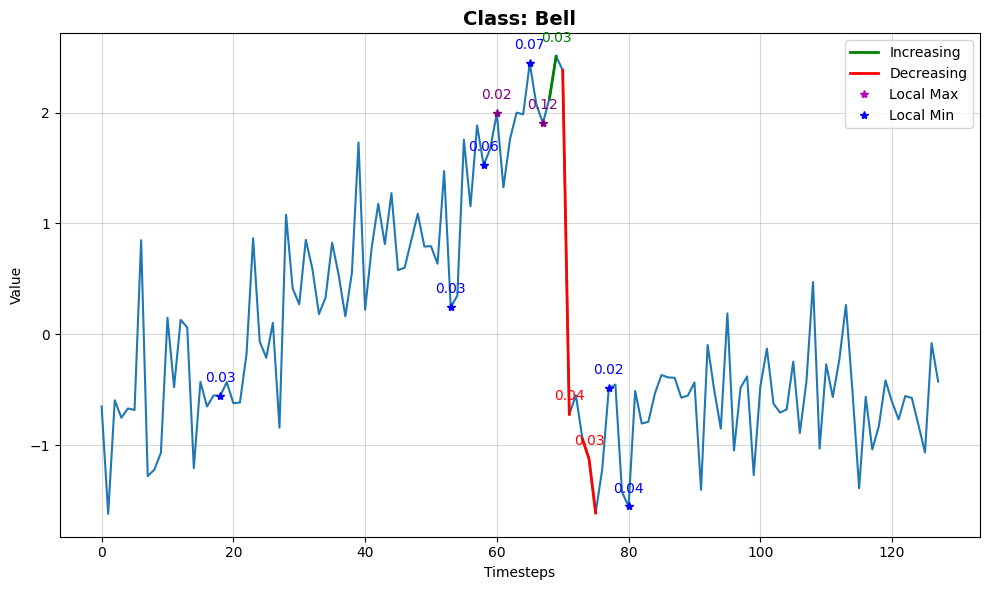

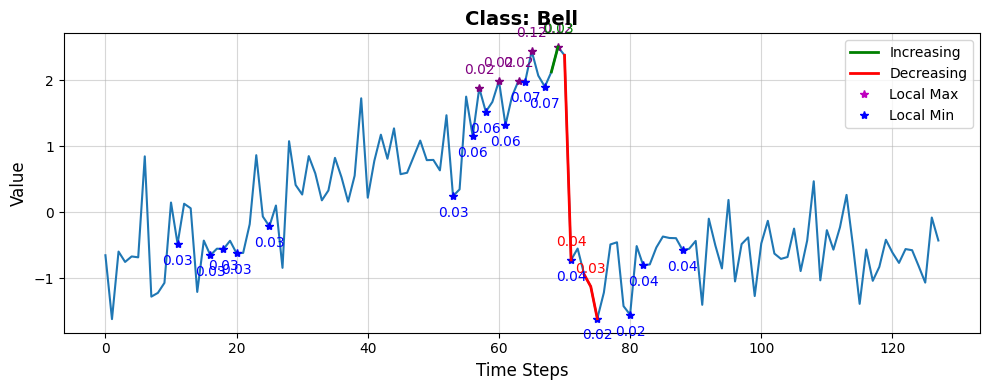

INFO:lomatce.explainer:Starting time series local explanation


Predection probability : tensor([0.1265, 0.7314, 0.1421])
Cylinder:                      0.1265
Bell:                      0.7314
Funnel:                      0.1421


INFO:lomatce.explainer:Perturbed instances shap for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 18664 samples)
Optimal number of clusters for Increasing_ch1: 18
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 9787 samples)
Optimal number of clusters for Decreasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 37107 samples)
Optimal number of clusters for LocalMax_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 38076 samples)
Optimal number of clusters for LocalMin_ch1: 19


INFO:lomatce.explainer:Final data shape: (1001, 75) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 75


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.97
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.81
INFO:lomatce.explainer:Model Type: Ridge


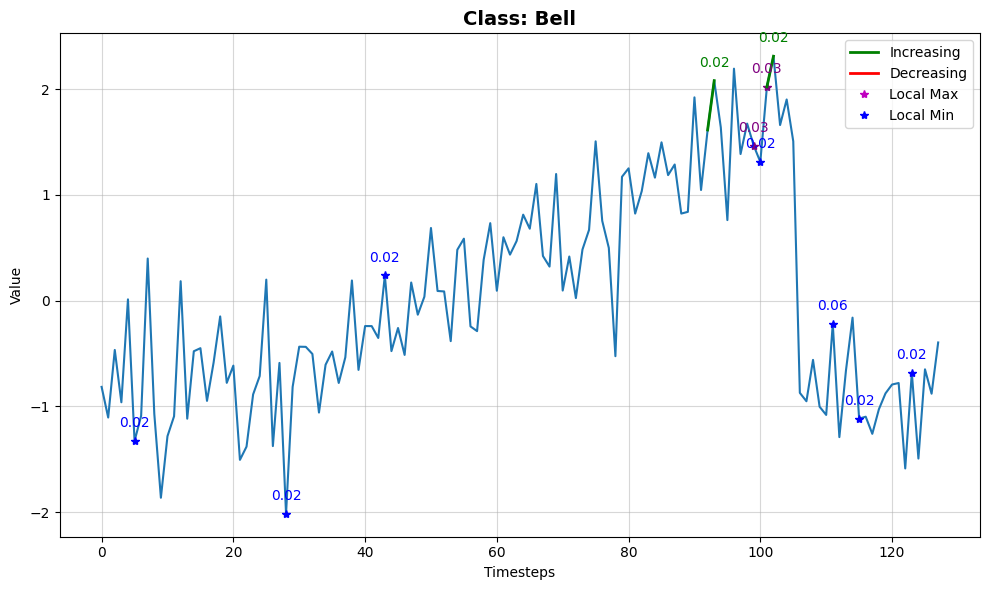

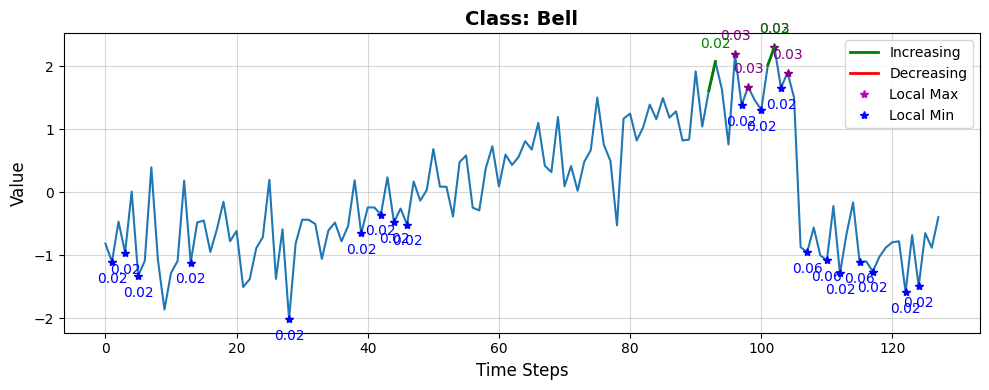

INFO:lomatce.explainer:Starting time series local explanation


Predection probability : tensor([0.1004, 0.8219, 0.0777])
Cylinder:                      0.1004
Bell:                      0.8219
Funnel:                      0.0777


INFO:lomatce.explainer:Perturbed instances shap for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 15183 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 13405 samples)
Optimal number of clusters for Decreasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 33353 samples)
Optimal number of clusters for LocalMax_ch1: 18
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 34450 samples)
Optimal number of clusters for LocalMin_ch1: 4


INFO:lomatce.explainer:Final data shape: (1001, 60) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 60


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.98
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.73
INFO:lomatce.explainer:Model Type: Ridge


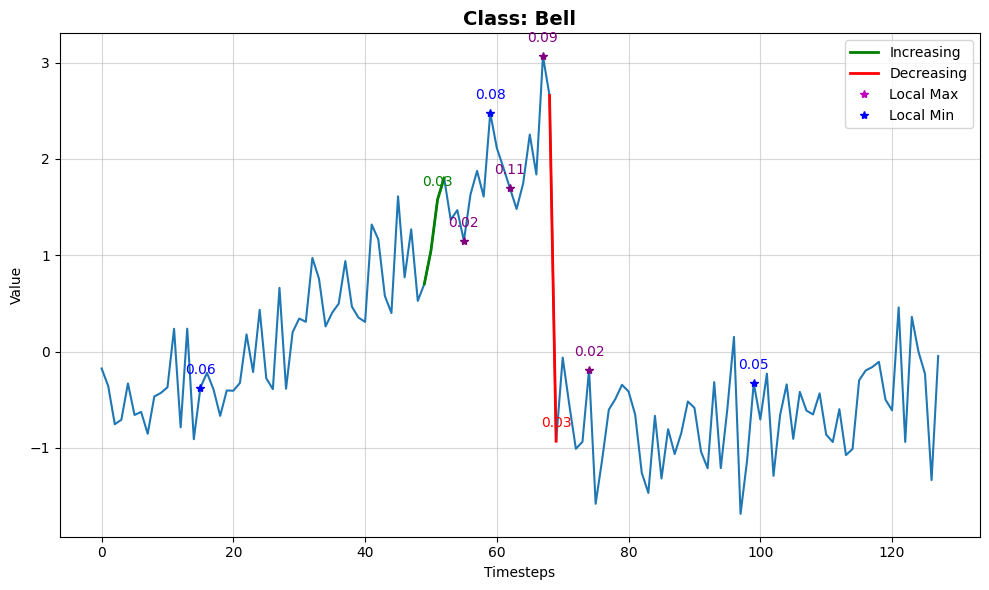

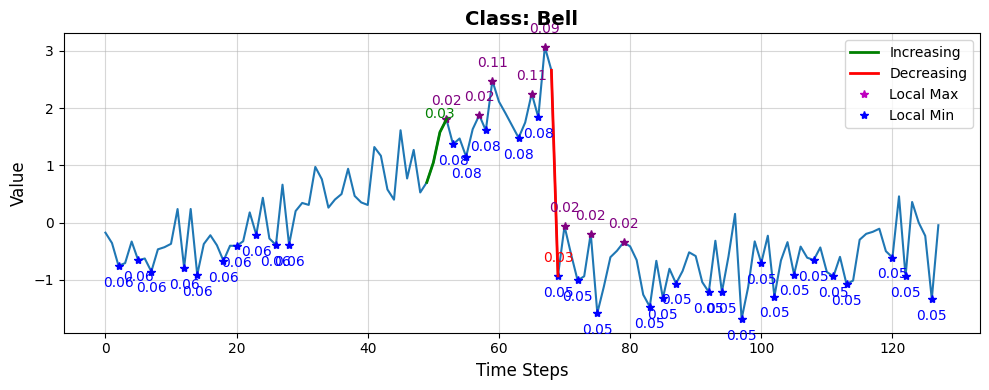

INFO:lomatce.explainer:Starting time series local explanation


Predection probability : tensor([0.1265, 0.7369, 0.1366])
Cylinder:                      0.1265
Bell:                      0.7369
Funnel:                      0.1366

📈 Global Faithfulness (Avg Local Fidelity): 0.9652

=== Running SP-LOMATCE for class Funnel ===


INFO:lomatce.explainer:Perturbed instances shap for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 14312 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 14163 samples)
Optimal number of clusters for Decreasing_ch1: 14
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 35125 samples)
Optimal number of clusters for LocalMax_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 36303 samples)
Optimal number of clusters for LocalMin_ch1: 19


INFO:lomatce.explainer:Final data shape: (1001, 71) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 71


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.98
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.73
INFO:lomatce.explainer:Model Type: Ridge


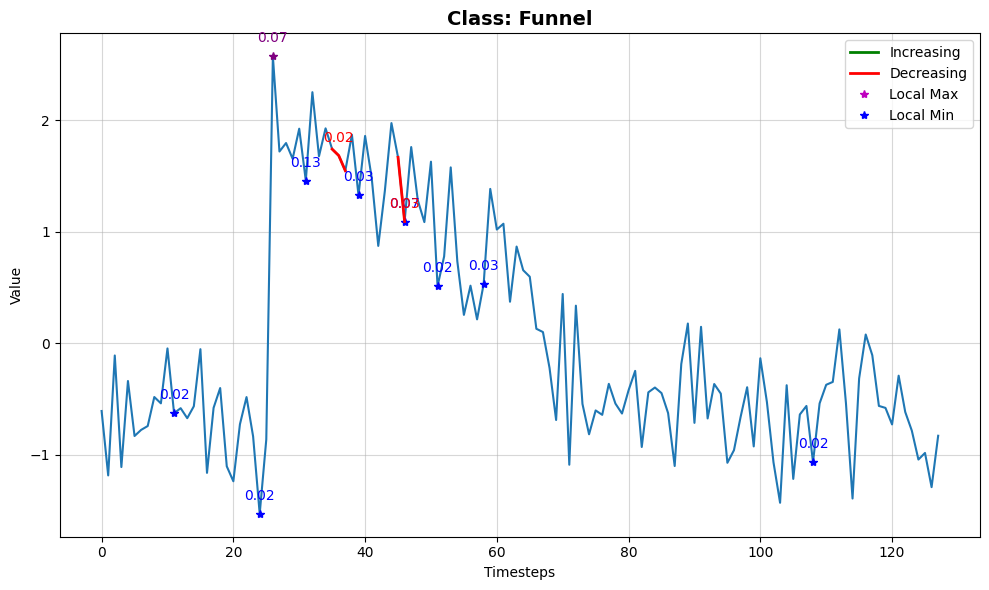

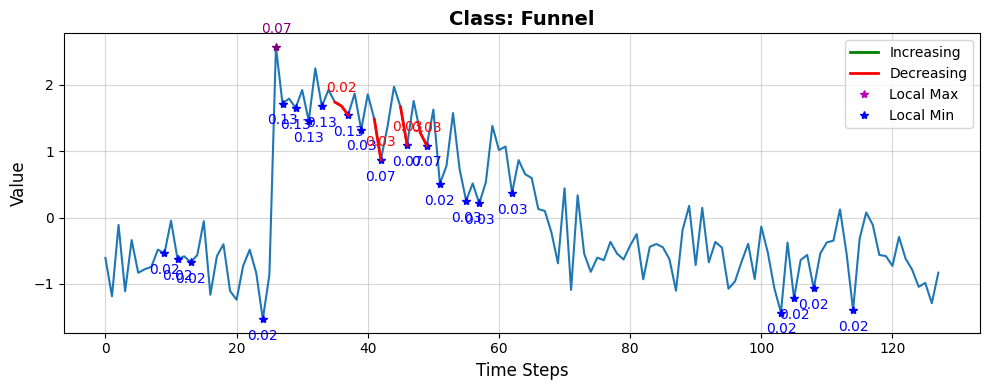

INFO:lomatce.explainer:Starting time series local explanation


Predection probability : tensor([0.1723, 0.1015, 0.7262])
Cylinder:                      0.1723
Bell:                      0.1015
Funnel:                      0.7262


INFO:lomatce.explainer:Perturbed instances shap for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 12474 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 15281 samples)
Optimal number of clusters for Decreasing_ch1: 17
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 36132 samples)
Optimal number of clusters for LocalMax_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 35212 samples)
Optimal number of clusters for LocalMin_ch1: 19


INFO:lomatce.explainer:Final data shape: (1001, 74) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 74


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.97
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.63
INFO:lomatce.explainer:Model Type: Ridge


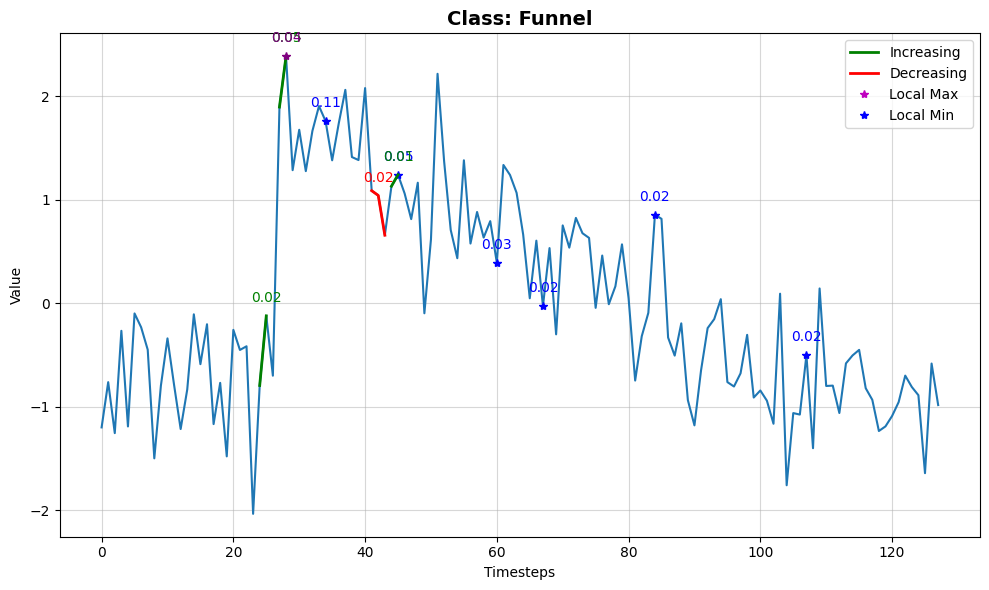

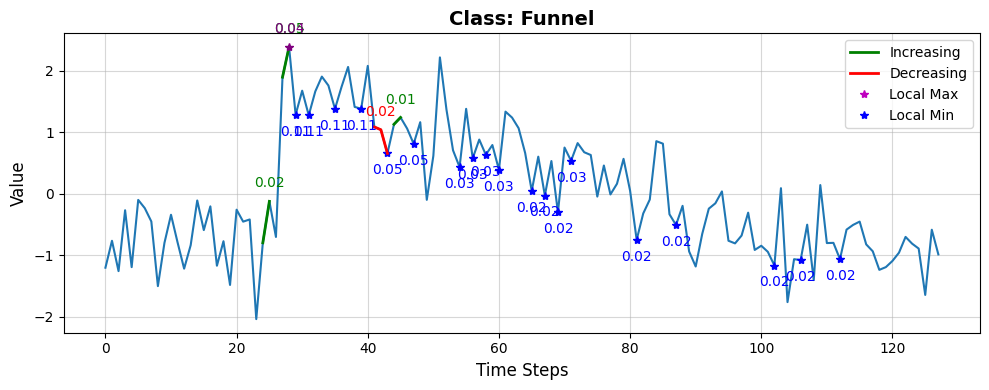

INFO:lomatce.explainer:Starting time series local explanation


Predection probability : tensor([0.2351, 0.1348, 0.6300])
Cylinder:                      0.2351
Bell:                      0.1348
Funnel:                      0.6300


INFO:lomatce.explainer:Perturbed instances shap for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 10795 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 20535 samples)
Optimal number of clusters for Decreasing_ch1: 18
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 36257 samples)
Optimal number of clusters for LocalMax_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 35371 samples)
Optimal number of clusters for LocalMin_ch1: 19


INFO:lomatce.explainer:Final data shape: (1001, 75) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 75


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.96
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.75
INFO:lomatce.explainer:Model Type: Ridge


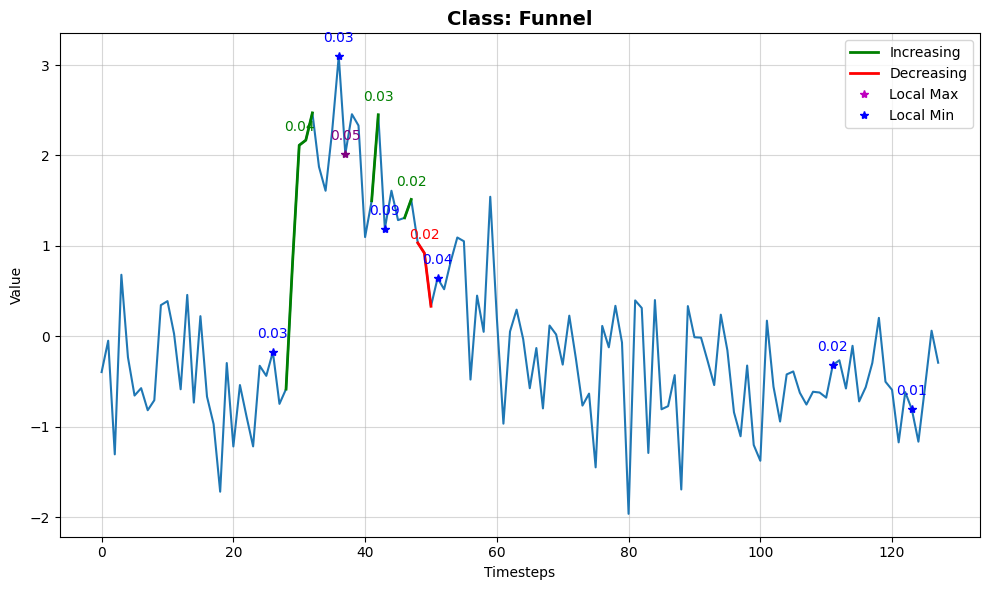

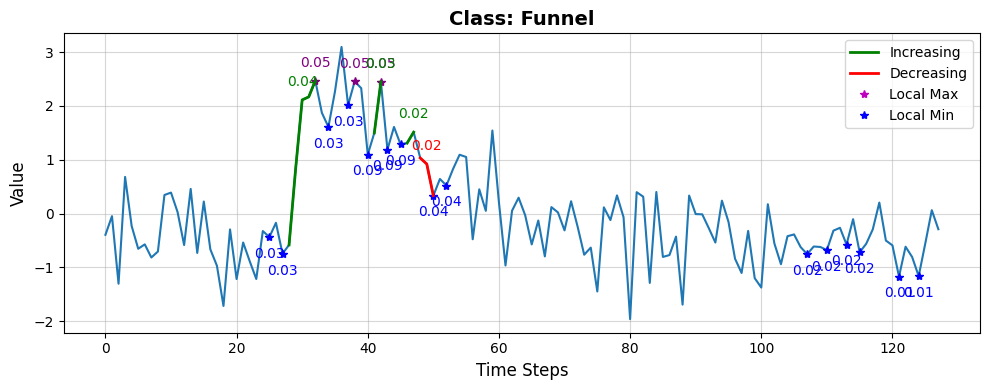

INFO:lomatce.explainer:Starting time series local explanation


Predection probability : tensor([0.0344, 0.2132, 0.7523])
Cylinder:                      0.0344
Bell:                      0.2132
Funnel:                      0.7523


INFO:lomatce.explainer:Perturbed instances shap for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 15237 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 17139 samples)
Optimal number of clusters for Decreasing_ch1: 17
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 35466 samples)
Optimal number of clusters for LocalMax_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 35635 samples)
Optimal number of clusters for LocalMin_ch1: 18


INFO:lomatce.explainer:Final data shape: (1001, 73) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 73


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.97
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.81
INFO:lomatce.explainer:Model Type: Ridge


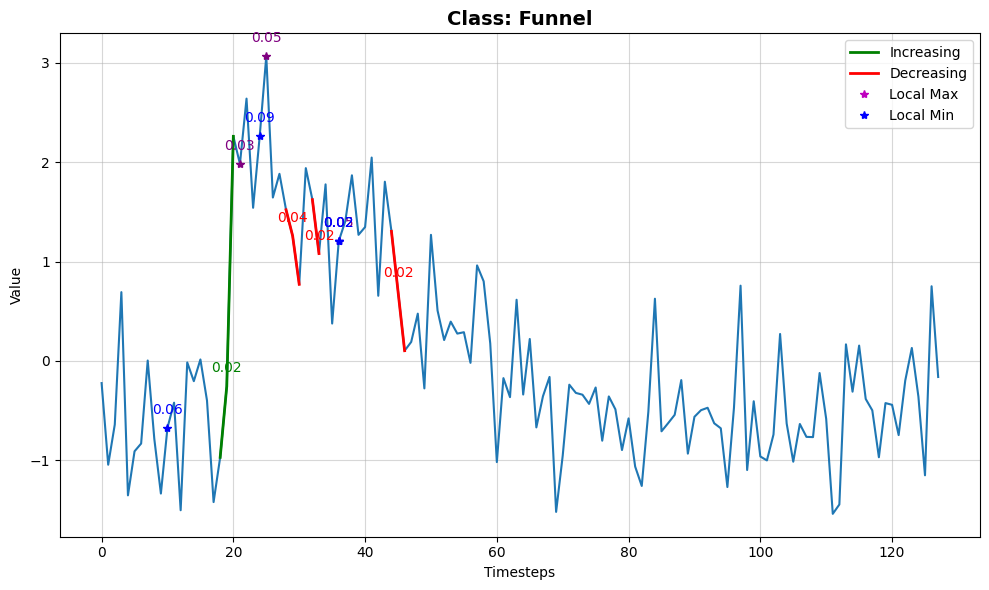

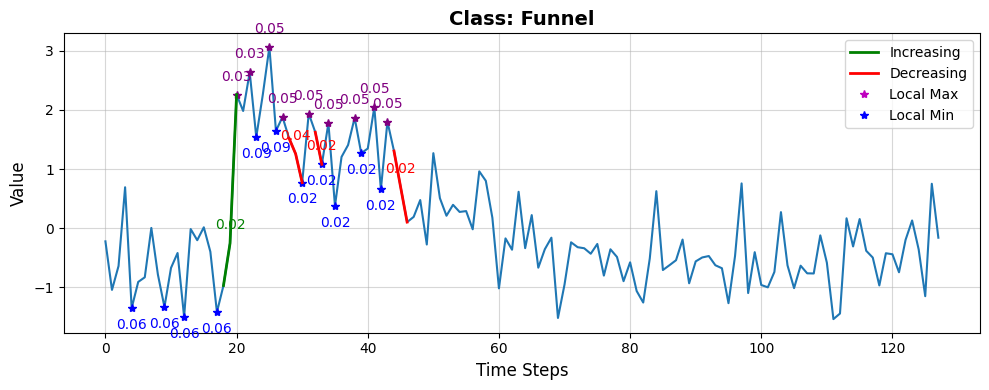

INFO:lomatce.explainer:Starting time series local explanation


Predection probability : tensor([0.0444, 0.1487, 0.8069])
Cylinder:                      0.0444
Bell:                      0.1487
Funnel:                      0.8069


INFO:lomatce.explainer:Perturbed instances shap for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 10605 samples)
Optimal number of clusters for Increasing_ch1: 12
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 17773 samples)
Optimal number of clusters for Decreasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 35341 samples)
Optimal number of clusters for LocalMax_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 34564 samples)
Optimal number of clusters for LocalMin_ch1: 19


INFO:lomatce.explainer:Final data shape: (1001, 69) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 69


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.98
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.83
INFO:lomatce.explainer:Model Type: Ridge


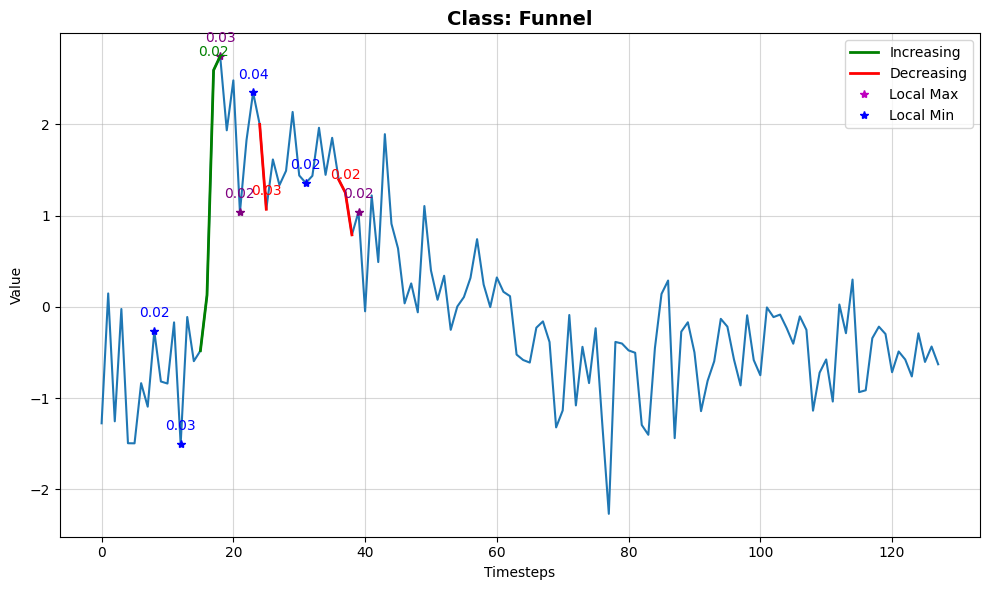

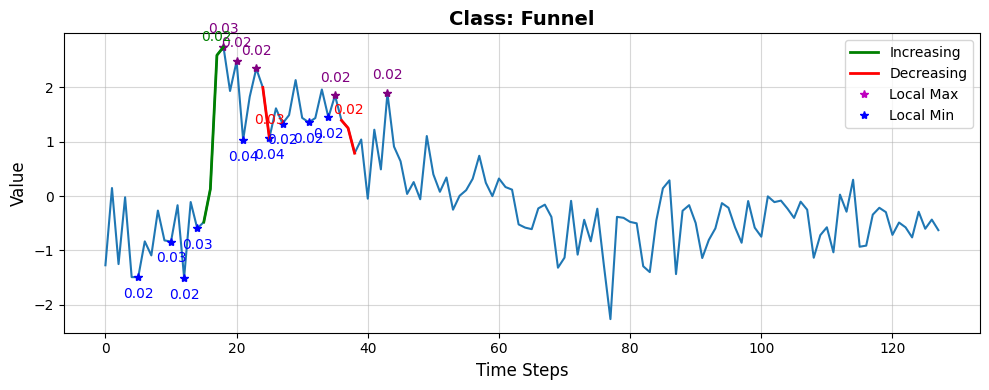

INFO:lomatce.explainer:Starting time series local explanation


Predection probability : tensor([0.0633, 0.1074, 0.8292])
Cylinder:                      0.0633
Bell:                      0.1074
Funnel:                      0.8292


INFO:lomatce.explainer:Perturbed instances shap for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 16948 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 10748 samples)
Optimal number of clusters for Decreasing_ch1: 15
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 37164 samples)
Optimal number of clusters for LocalMax_ch1: 18
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 37385 samples)
Optimal number of clusters for LocalMin_ch1: 19


INFO:lomatce.explainer:Final data shape: (1001, 71) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 71


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.98
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.84
INFO:lomatce.explainer:Model Type: Ridge


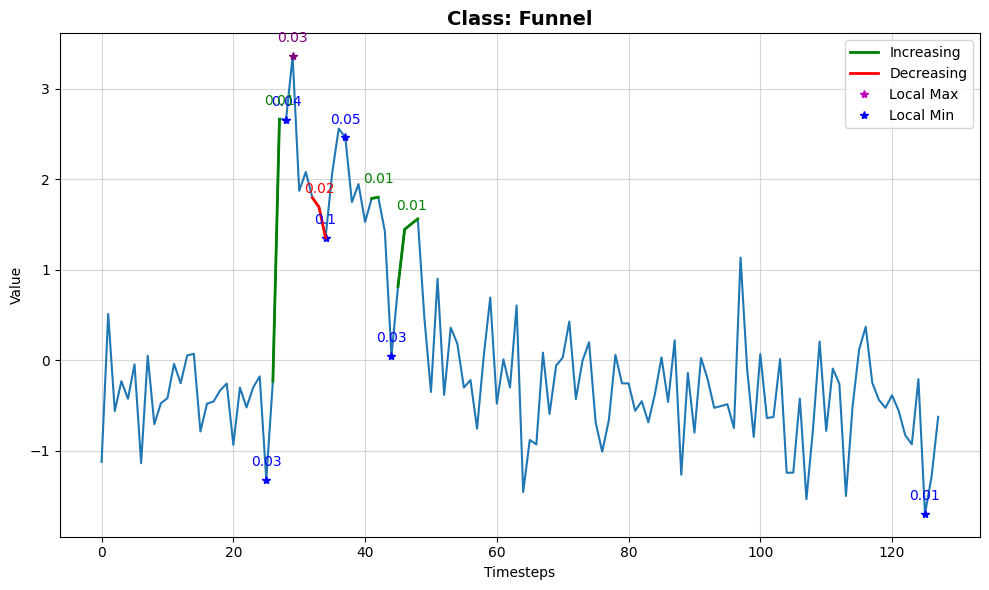

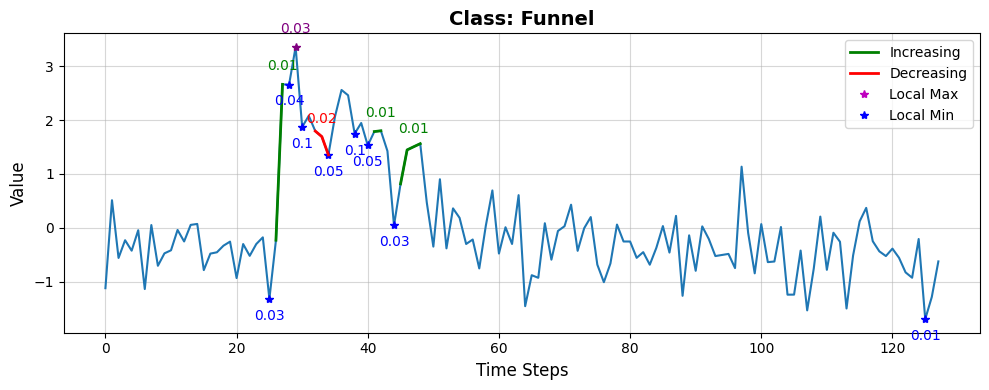

INFO:lomatce.explainer:Starting time series local explanation


Predection probability : tensor([0.0152, 0.1411, 0.8437])
Cylinder:                      0.0152
Bell:                      0.1411
Funnel:                      0.8437


INFO:lomatce.explainer:Perturbed instances shap for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 12550 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 16068 samples)
Optimal number of clusters for Decreasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 37826 samples)
Optimal number of clusters for LocalMax_ch1: 3
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 38984 samples)
Optimal number of clusters for LocalMin_ch1: 17


INFO:lomatce.explainer:Final data shape: (1001, 58) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 58


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.97
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.78
INFO:lomatce.explainer:Model Type: Ridge


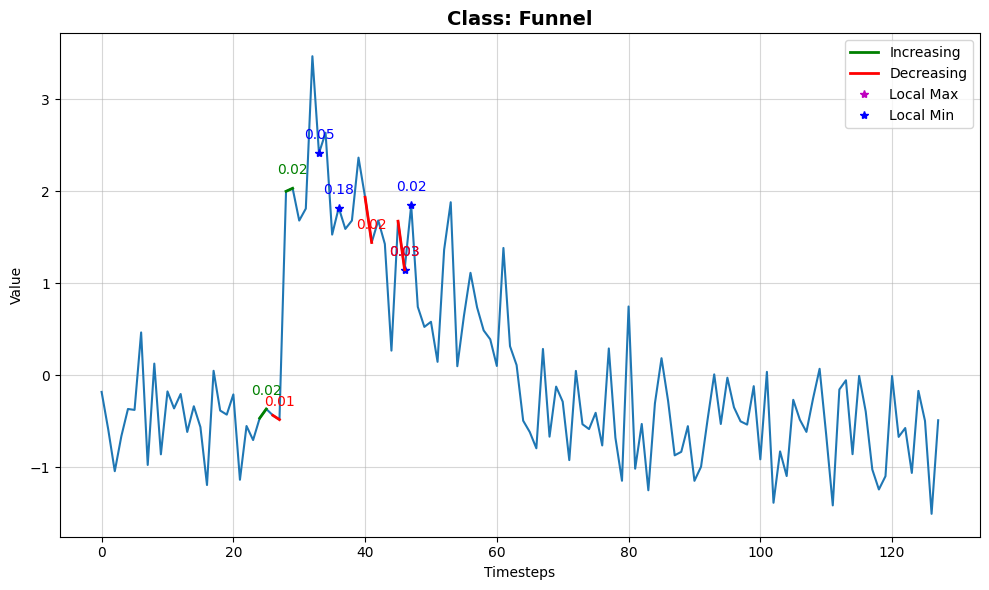

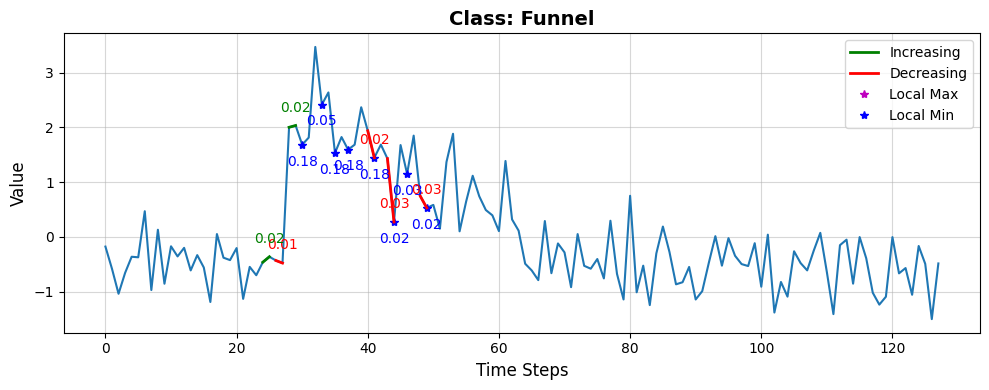

INFO:lomatce.explainer:Starting time series local explanation


Predection probability : tensor([0.0521, 0.1687, 0.7793])
Cylinder:                      0.0521
Bell:                      0.1687
Funnel:                      0.7793


INFO:lomatce.explainer:Perturbed instances shap for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 10646 samples)
Optimal number of clusters for Increasing_ch1: 17
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 16135 samples)
Optimal number of clusters for Decreasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 37607 samples)
Optimal number of clusters for LocalMax_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 37430 samples)
Optimal number of clusters for LocalMin_ch1: 19


INFO:lomatce.explainer:Final data shape: (1001, 74) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 74


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.98
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.68
INFO:lomatce.explainer:Model Type: Ridge


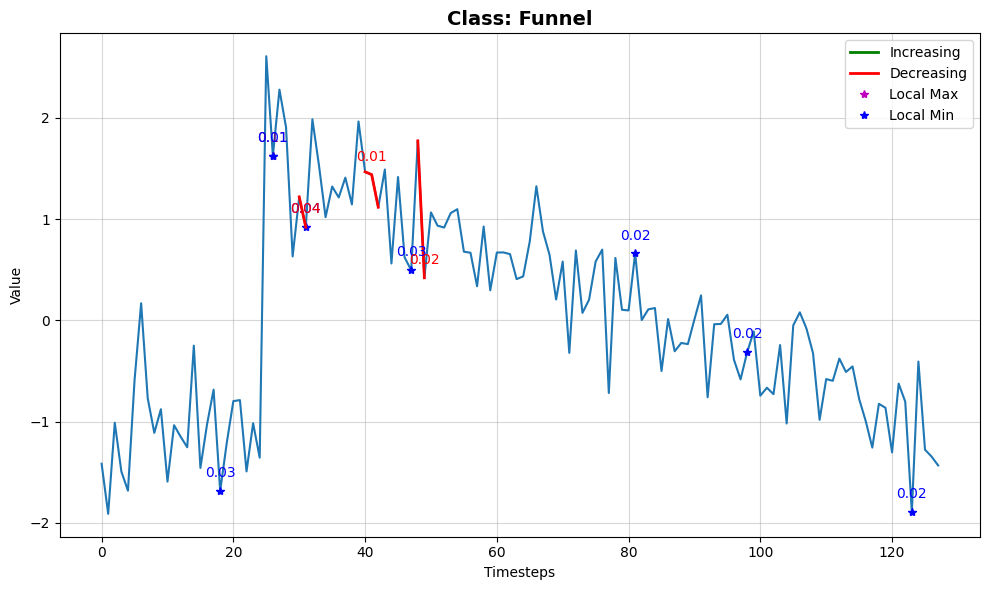

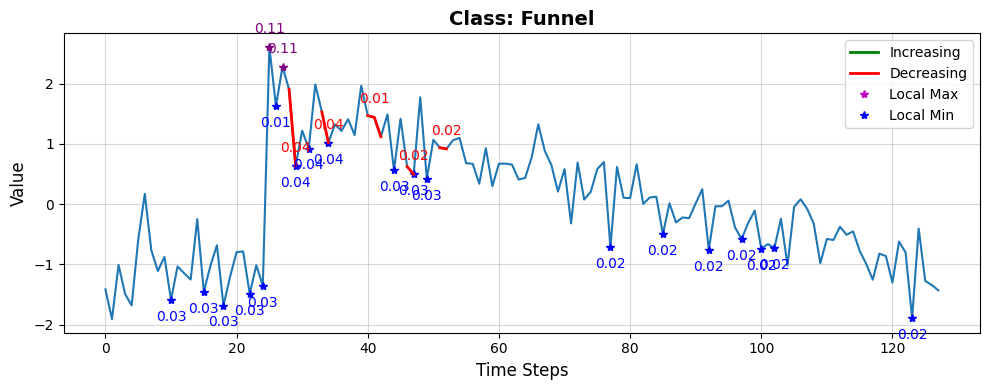

INFO:lomatce.explainer:Starting time series local explanation


Predection probability : tensor([0.2212, 0.0995, 0.6793])
Cylinder:                      0.2212
Bell:                      0.0995
Funnel:                      0.6793


INFO:lomatce.explainer:Perturbed instances shap for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 13201 samples)
Optimal number of clusters for Increasing_ch1: 17
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 15099 samples)
Optimal number of clusters for Decreasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 36965 samples)
Optimal number of clusters for LocalMax_ch1: 18
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 36305 samples)
Optimal number of clusters for LocalMin_ch1: 19


INFO:lomatce.explainer:Final data shape: (1001, 73) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 73


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.98
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.85
INFO:lomatce.explainer:Model Type: Ridge


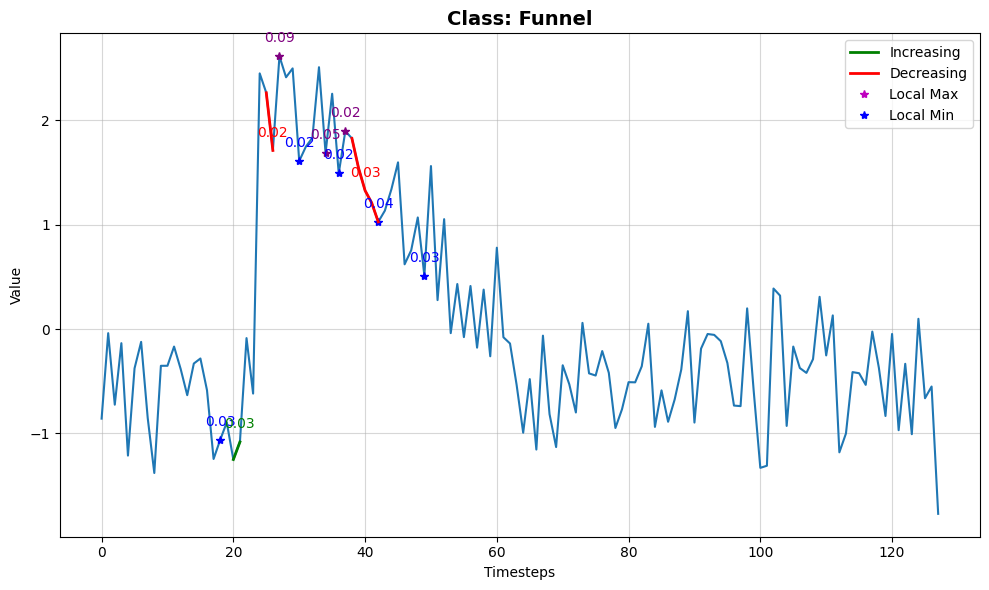

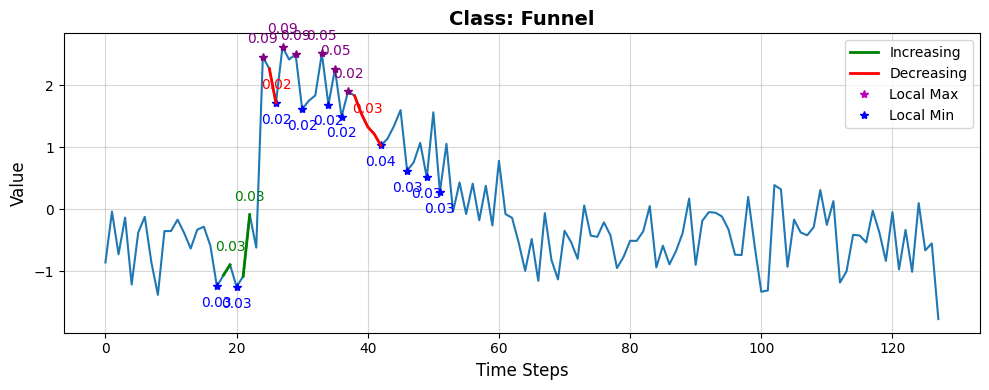

INFO:lomatce.explainer:Starting time series local explanation


Predection probability : tensor([0.0544, 0.0941, 0.8515])
Cylinder:                      0.0544
Bell:                      0.0941
Funnel:                      0.8515


INFO:lomatce.explainer:Perturbed instances shap for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 17080 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 12678 samples)
Optimal number of clusters for Decreasing_ch1: 18
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 35286 samples)
Optimal number of clusters for LocalMax_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 36411 samples)
Optimal number of clusters for LocalMin_ch1: 18


INFO:lomatce.explainer:Final data shape: (1001, 74) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 74


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.97
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.82
INFO:lomatce.explainer:Model Type: Ridge


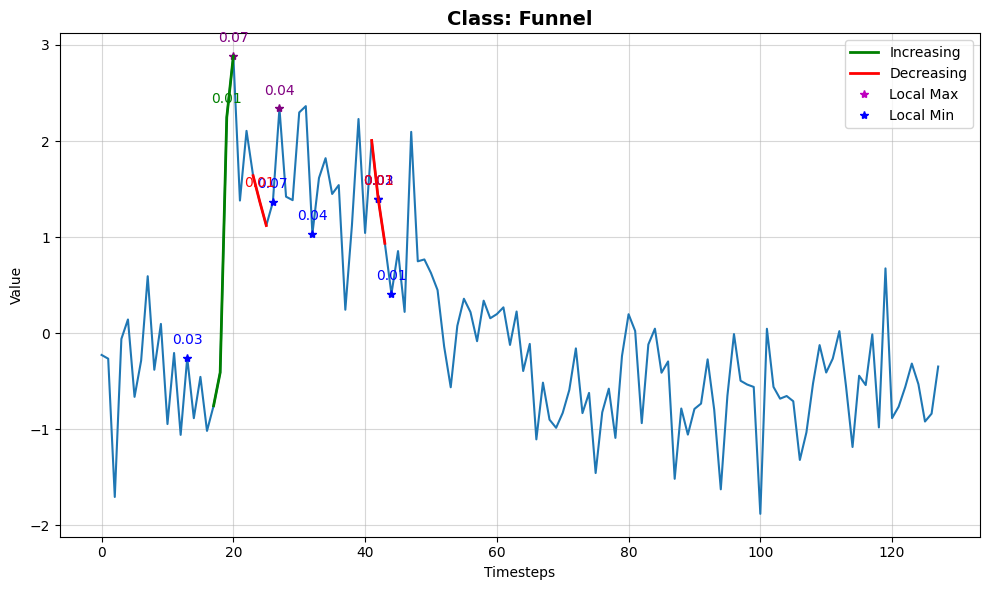

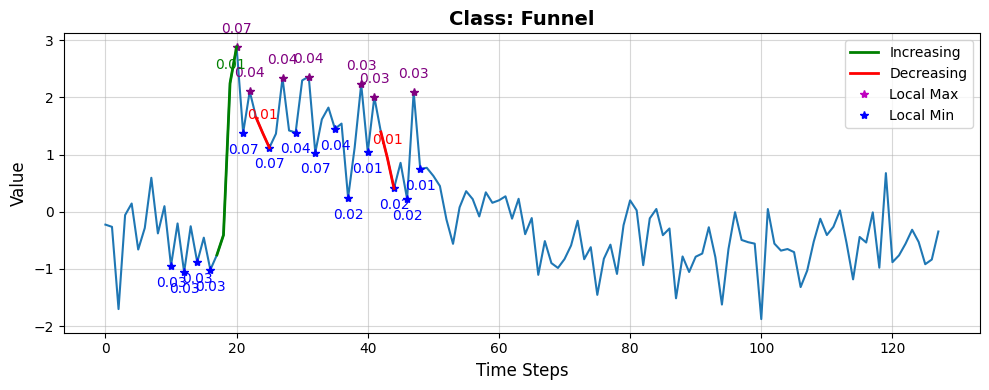

INFO:lomatce.explainer:Starting time series local explanation


Predection probability : tensor([0.0497, 0.1335, 0.8168])
Cylinder:                      0.0497
Bell:                      0.1335
Funnel:                      0.8168


INFO:lomatce.explainer:Perturbed instances shap for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 11552 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 16859 samples)
Optimal number of clusters for Decreasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 37049 samples)
Optimal number of clusters for LocalMax_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 37137 samples)
Optimal number of clusters for LocalMin_ch1: 19


INFO:lomatce.explainer:Final data shape: (1001, 76) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 76


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.98
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.81
INFO:lomatce.explainer:Model Type: Ridge


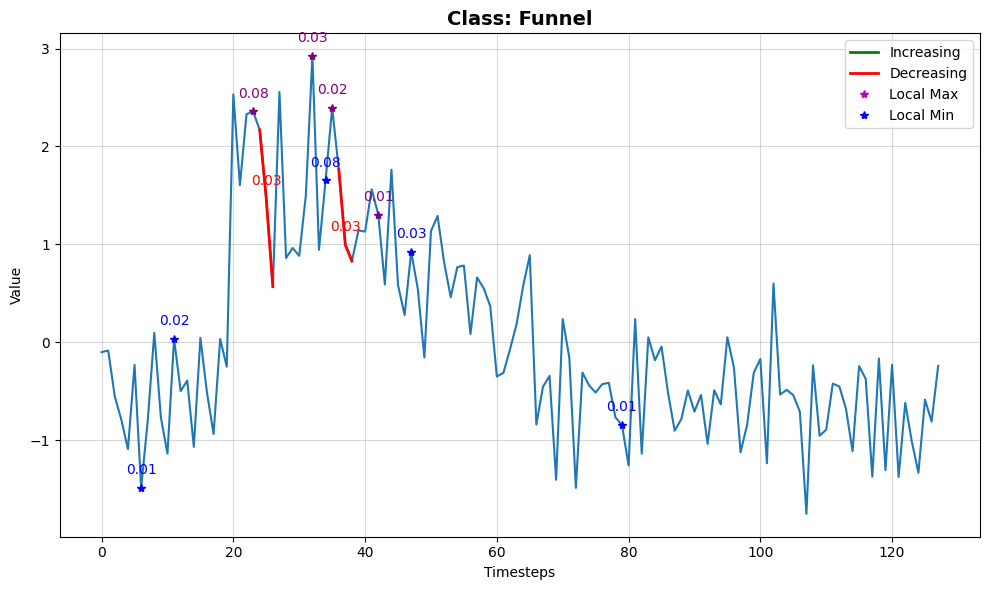

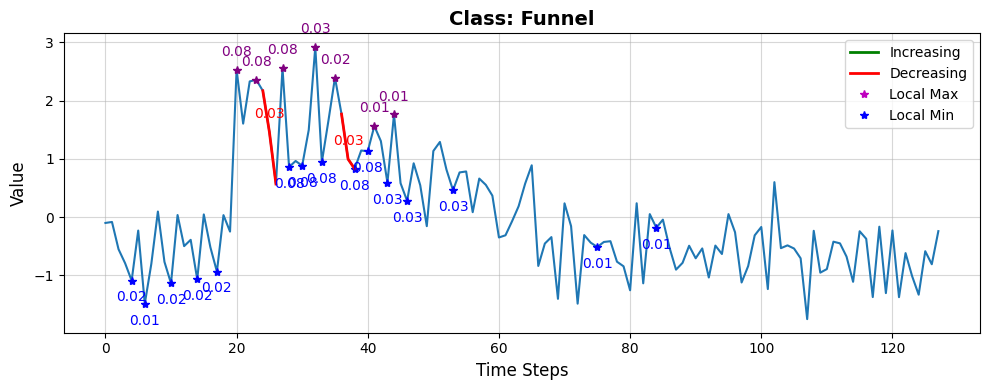

INFO:lomatce.explainer:Starting time series local explanation


Predection probability : tensor([0.0604, 0.1291, 0.8105])
Cylinder:                      0.0604
Bell:                      0.1291
Funnel:                      0.8105


INFO:lomatce.explainer:Perturbed instances shap for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 13462 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 19501 samples)
Optimal number of clusters for Decreasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 36417 samples)
Optimal number of clusters for LocalMax_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 37338 samples)
Optimal number of clusters for LocalMin_ch1: 19


INFO:lomatce.explainer:Final data shape: (1001, 76) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 76


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.98
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.76
INFO:lomatce.explainer:Model Type: Ridge


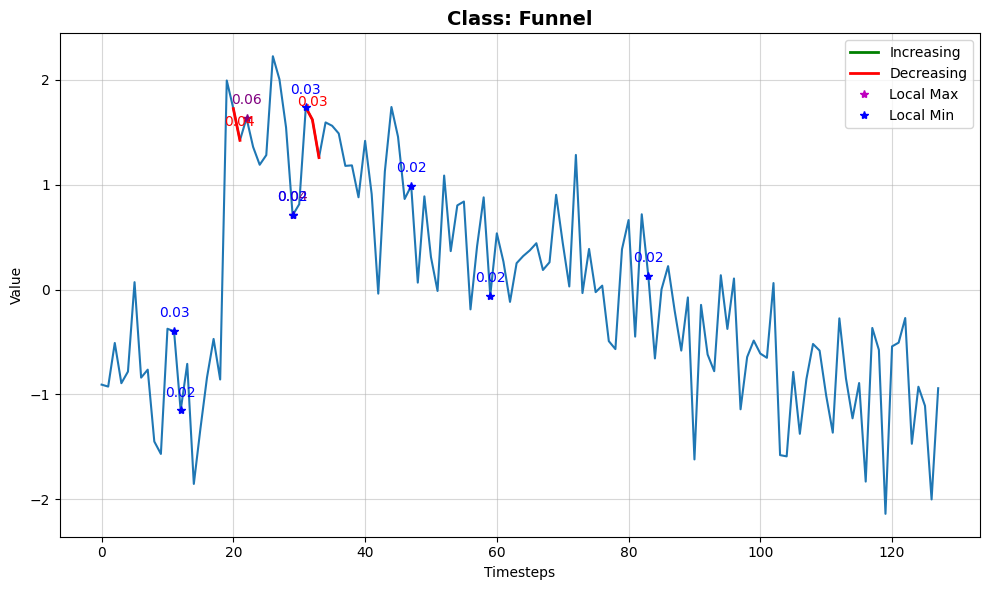

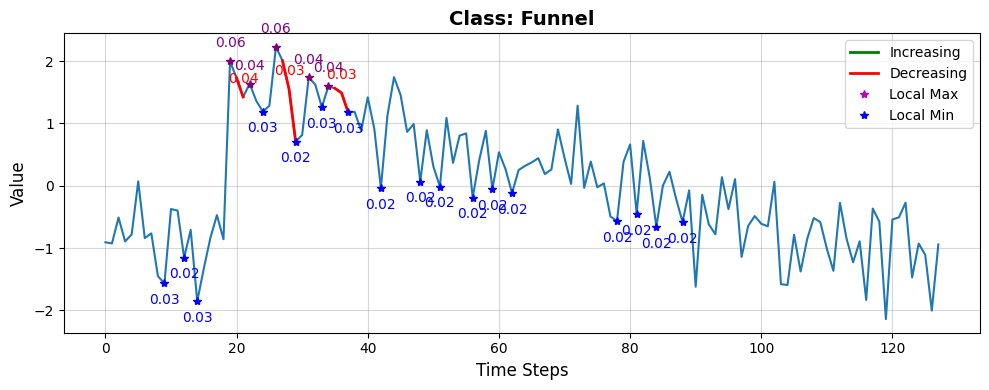

INFO:lomatce.explainer:Starting time series local explanation


Predection probability : tensor([0.1302, 0.1134, 0.7565])
Cylinder:                      0.1302
Bell:                      0.1134
Funnel:                      0.7565


INFO:lomatce.explainer:Perturbed instances shap for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 16242 samples)
Optimal number of clusters for Increasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 14302 samples)
Optimal number of clusters for Decreasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 38178 samples)
Optimal number of clusters for LocalMax_ch1: 3
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 38113 samples)
Optimal number of clusters for LocalMin_ch1: 19


INFO:lomatce.explainer:Final data shape: (1001, 60) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 60


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.96
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.65
INFO:lomatce.explainer:Model Type: Ridge


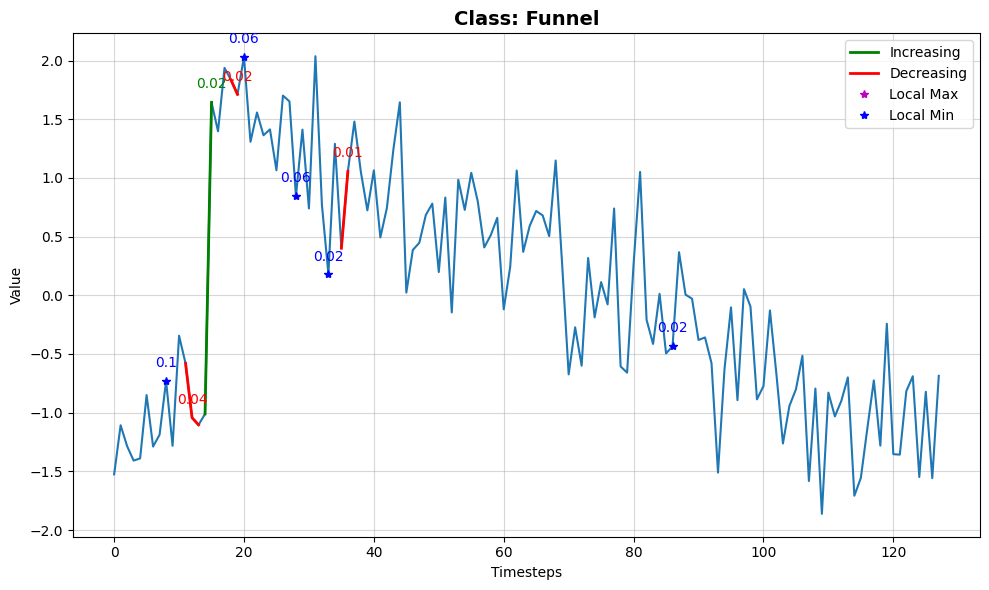

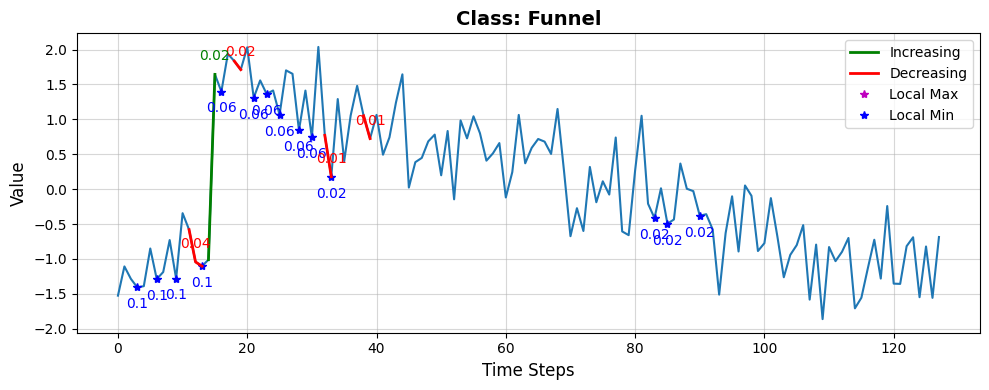

INFO:lomatce.explainer:Starting time series local explanation


Predection probability : tensor([0.2541, 0.1001, 0.6458])
Cylinder:                      0.2541
Bell:                      0.1001
Funnel:                      0.6458


INFO:lomatce.explainer:Perturbed instances shap for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 15949 samples)
Optimal number of clusters for Increasing_ch1: 18
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 14324 samples)
Optimal number of clusters for Decreasing_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 37889 samples)
Optimal number of clusters for LocalMax_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 37010 samples)
Optimal number of clusters for LocalMin_ch1: 17


INFO:lomatce.explainer:Final data shape: (1001, 73) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 73


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.96
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.76
INFO:lomatce.explainer:Model Type: Ridge


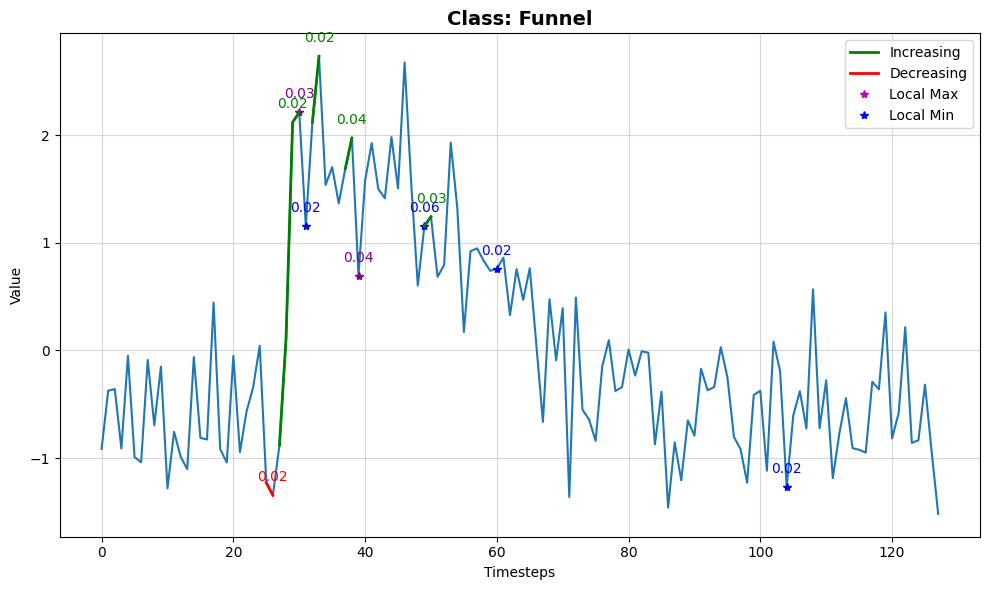

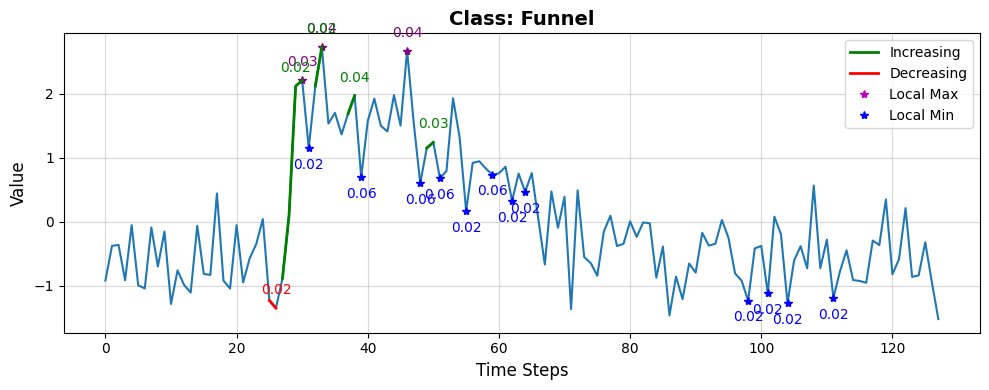

INFO:lomatce.explainer:Starting time series local explanation


Predection probability : tensor([0.0787, 0.1587, 0.7626])
Cylinder:                      0.0787
Bell:                      0.1587
Funnel:                      0.7626


INFO:lomatce.explainer:Perturbed instances shap for classifier: (1001, 1, 128)
INFO:lomatce.explainer:Processing events for 1001 instances


Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 14260 samples)
Optimal number of clusters for Increasing_ch1: 18
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 17752 samples)
Optimal number of clusters for Decreasing_ch1: 18
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 35019 samples)
Optimal number of clusters for LocalMax_ch1: 19
Running on 5/20 CPU cores
Testing up to 20 clusters (adaptive based on 35199 samples)
Optimal number of clusters for LocalMin_ch1: 18


INFO:lomatce.explainer:Final data shape: (1001, 73) (instances x features)
INFO:lomatce.explainer:Number of instances: 1001
INFO:lomatce.explainer:Number of features (clusters): 73


INFO:lomatce.explainer:Applying linear regression
INFO:lomatce.explainer:R-Score (Local Fidelity): 0.96
INFO:lomatce.explainer:Local Prediction (Linear Model): 0.84
INFO:lomatce.explainer:Model Type: Ridge


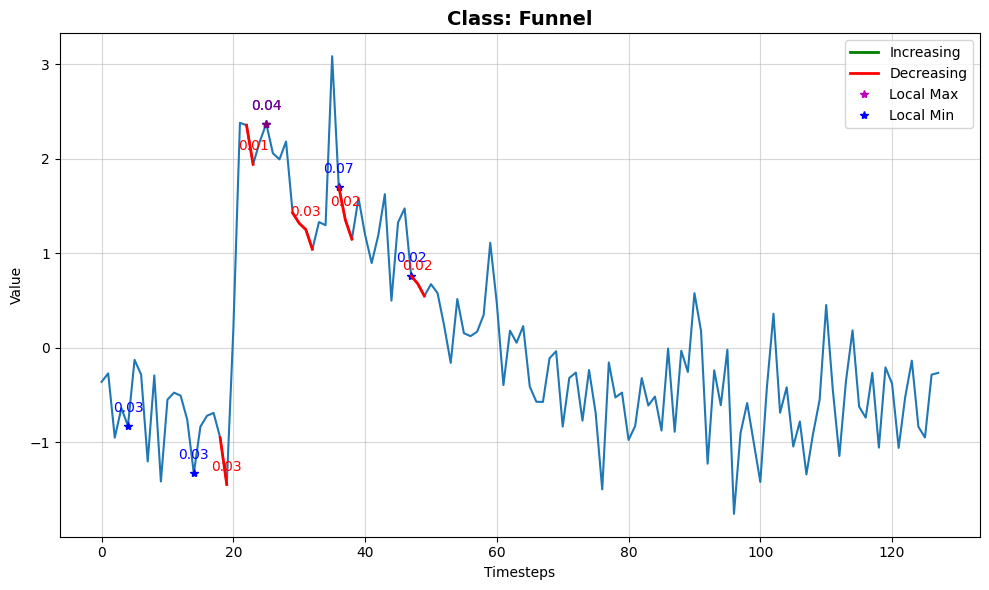

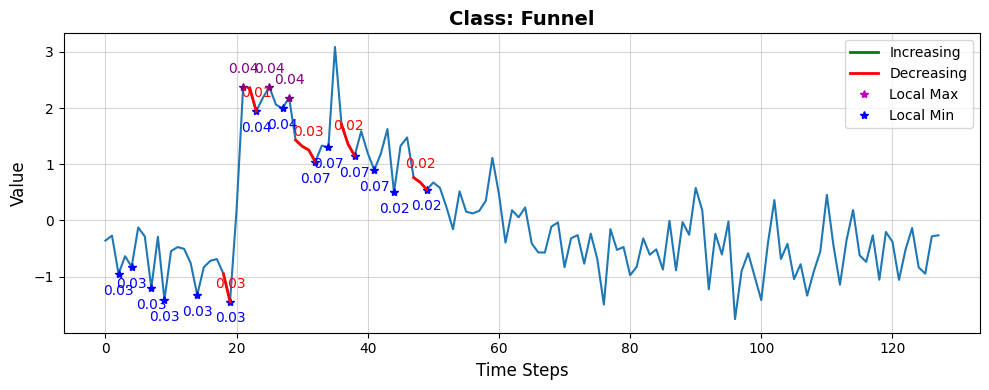

Predection probability : tensor([0.0774, 0.0869, 0.8357])
Cylinder:                      0.0774
Bell:                      0.0869
Funnel:                      0.8357

📈 Global Faithfulness (Avg Local Fidelity): 0.9728

=== 📊 Final Visualization for All Classes ===



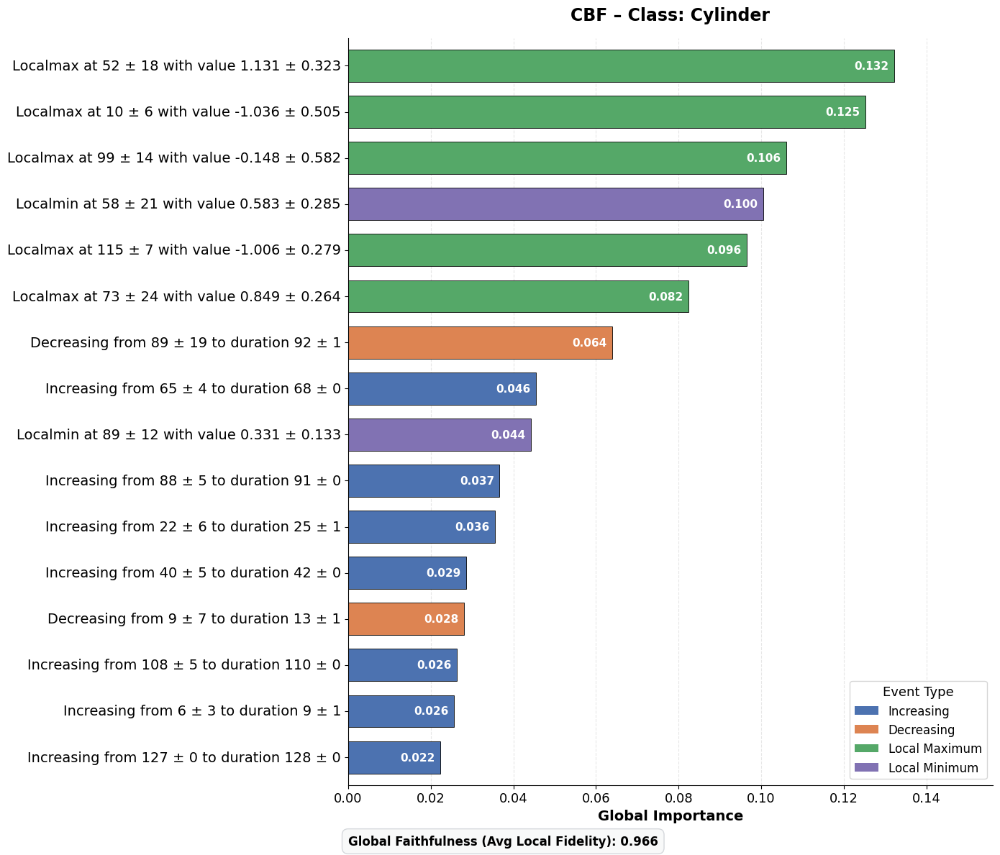

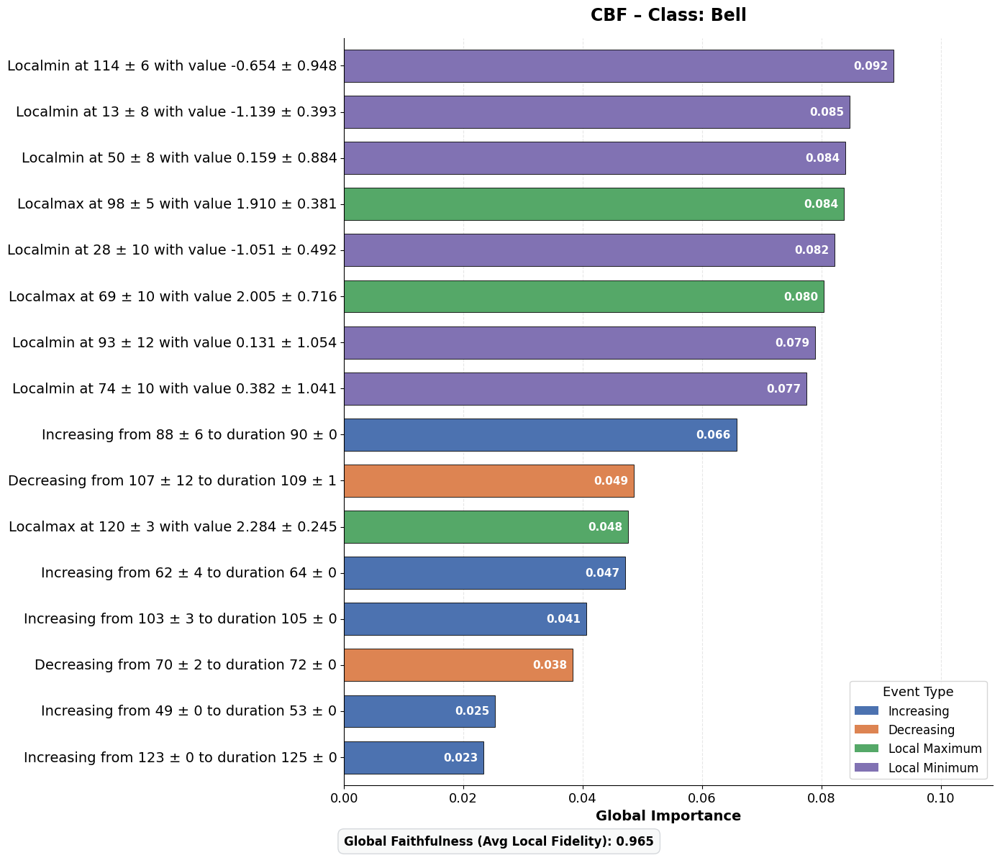

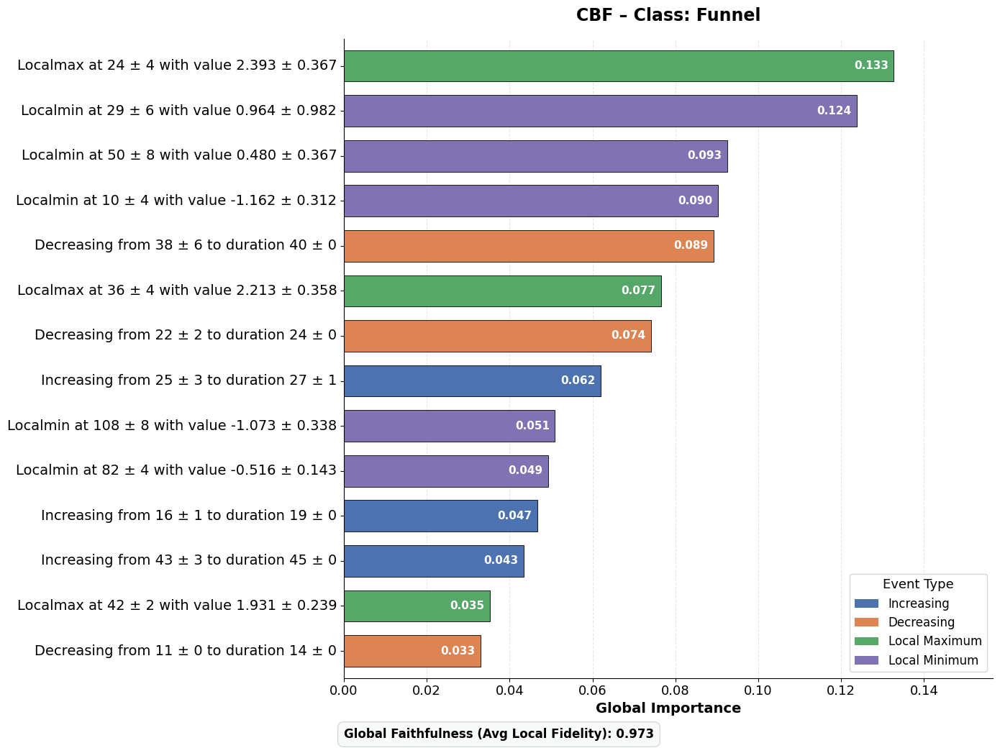

In [18]:
result_p95 = splomatce_explainer.run(X_test, y_test, n_per_class=15, B=15, merge_percentile=95)